In [3]:
import pandas as pd
result_tech = pd.read_csv('updated_df_tech.csv')
result_pol = pd.read_csv('updated_df_pol.csv')
result_enter = pd.read_csv('updated_df_enter.csv')
result_entrep = pd.read_csv('updated_df_entrep.csv')
result_celeb = pd.read_csv('updated_df_celeb.csv')
result_merged = pd.read_csv('updated_df_merged.csv')
result_others = pd.read_csv('updated_df_others.csv')

list(result_enter.columns.values)

FileNotFoundError: [Errno 2] No such file or directory: 'updated_df_tech.csv'

In [ ]:
# Define a function to map 0 to "Negative" and 1.0 to "Positive"
def map_svm_label(label):
    if label == 0:
        return "Negative"
    elif label == 1.0:
        return "Positive"
    else:
        return label

# Apply the function to the "SVM Predicted Label" column of each DataFrame
result_tech["SVM Predicted Label"] = result_tech["SVM Predicted Label"].apply(map_svm_label)
result_pol["SVM Predicted Label"] = result_pol["SVM Predicted Label"].apply(map_svm_label)
result_enter["SVM Predicted Label"] = result_enter["SVM Predicted Label"].apply(map_svm_label)
result_entrep["SVM Predicted Label"] = result_entrep["SVM Predicted Label"].apply(map_svm_label)
result_celeb["SVM Predicted Label"] = result_celeb["SVM Predicted Label"].apply(map_svm_label)
result_merged["SVM Predicted Label"] = result_merged["SVM Predicted Label"].apply(map_svm_label)
result_others["SVM Predicted Label"] = result_others["SVM Predicted Label"].apply(map_svm_label)


In [ ]:
# Filter rows where sentiment_label is not equal to result from SVM
filtered_df =result_merged[result_merged['sentiment_label'] !=result_merged['SVM Predicted Label']]

# Save filtered data to a new CSV file
filtered_df.to_csv('svm vs vader.csv', index=False)

In [ ]:
result_tech['Date Created'] = pd.to_datetime(result_tech['Date Created'])
result_merged['Date Created'] = pd.to_datetime(result_merged['Date Created'])
result_entrep['Date Created'] = pd.to_datetime(result_entrep['Date Created'])
result_celeb['Date Created'] = pd.to_datetime(result_celeb['Date Created'])
result_others['Date Created'] = pd.to_datetime(result_others['Date Created'])
result_enter['Date Created'] = pd.to_datetime(result_enter['Date Created'])
result_pol['Date Created'] = pd.to_datetime(result_pol['Date Created'])

In [ ]:
tweet_count_tech = result_tech.groupby(result_tech['Date Created'].dt.date)['Text'].count()
tweet_count_pol = result_pol.groupby(result_pol['Date Created'].dt.date)['Text'].count()
tweet_count_enter = result_enter.groupby(result_enter['Date Created'].dt.date)['Text'].count()
tweet_count_entrep = result_entrep.groupby(result_entrep['Date Created'].dt.date)['Text'].count()
tweet_count_celeb = result_celeb.groupby(result_celeb['Date Created'].dt.date)['Text'].count()
tweet_count_merged = result_merged.groupby(result_merged['Date Created'].dt.date)['Text'].count()
tweet_count_others = result_others.groupby(result_others['Date Created'].dt.date)['Text'].count()




In [ ]:
tweet_count_tech.index = pd.to_datetime(tweet_count_tech.index)
tweet_count_pol.index = pd.to_datetime(tweet_count_pol.index)
tweet_count_enter.index = pd.to_datetime(tweet_count_enter.index)
tweet_count_celeb.index = pd.to_datetime(tweet_count_celeb.index)
tweet_count_others.index = pd.to_datetime(tweet_count_others.index)
tweet_count_merged.index = pd.to_datetime(tweet_count_merged.index)
tweet_count_entrep.index = pd.to_datetime(tweet_count_entrep.index)

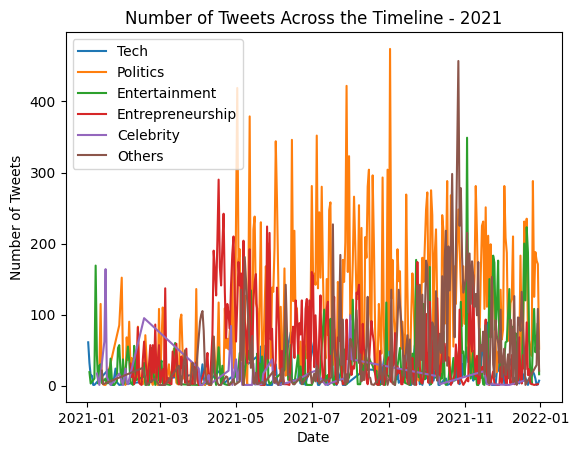

In [ ]:
import matplotlib.pyplot as plt
# Filter the data for 2021
tweet_count_tech_2021 = tweet_count_tech[tweet_count_tech.index.year == 2021]
tweet_count_pol_2021 = tweet_count_pol[tweet_count_pol.index.year == 2021]
tweet_count_enter_2021 = tweet_count_enter[tweet_count_enter.index.year == 2021]
tweet_count_entrep_2021 = tweet_count_entrep[tweet_count_entrep.index.year == 2021]
tweet_count_celeb_2021 = tweet_count_celeb[tweet_count_celeb.index.year == 2021]
tweet_count_merged_2021 = tweet_count_merged[tweet_count_merged.index.year == 2021]
tweet_count_others_2021 = tweet_count_others[tweet_count_others.index.year == 2021]

# Plot the line charts on the same figure
plt.plot(tweet_count_tech_2021.index, tweet_count_tech_2021.values, label='Tech')
plt.plot(tweet_count_pol_2021.index, tweet_count_pol_2021.values, label='Politics')
plt.plot(tweet_count_enter_2021.index, tweet_count_enter_2021.values, label='Entertainment')
plt.plot(tweet_count_entrep_2021.index, tweet_count_entrep_2021.values, label='Entrepreneurship')
plt.plot(tweet_count_celeb_2021.index, tweet_count_celeb_2021.values, label='Celebrity')
#plt.plot(tweet_count_merged_2021.index, tweet_count_merged_2021.values, label='Merged')
plt.plot(tweet_count_others_2021.index, tweet_count_others_2021.values, label='Others')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.title('Number of Tweets Across the Timeline - 2021')
plt.legend()
plt.show()


In [ ]:
tweet_count_tech_2021= tweet_count_tech_2021.rolling(window=21).mean()
tweet_count_enter_2021 = tweet_count_enter_2021.rolling(window=21).mean()
tweet_count_celeb_2021 = tweet_count_celeb_2021.rolling(window=21).mean()
tweet_count_others_2021=tweet_count_others_2021.rolling(window=21).mean()
tweet_count_merged_2021 = tweet_count_merged_2021.rolling(window=21).mean()
tweet_count_tech_2021 = tweet_count_tech_2021.rolling(window=21).mean()

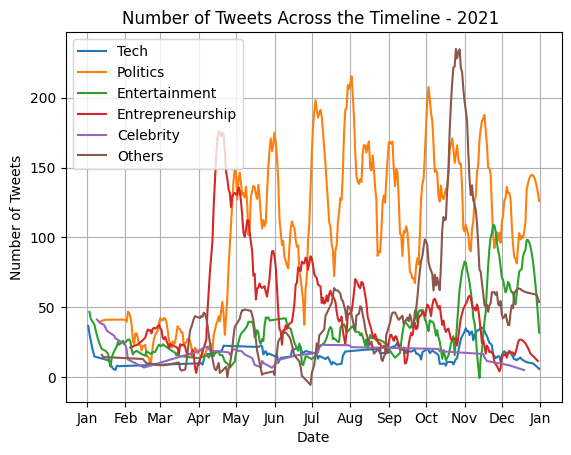

In [ ]:
from scipy.signal import savgol_filter
from matplotlib.dates import DateFormatter, MonthLocator

# Filter the data for 2021
tweet_count_tech_2021 = tweet_count_tech[tweet_count_tech.index.year == 2021]
tweet_count_pol_2021 = tweet_count_pol[tweet_count_pol.index.year == 2021]
tweet_count_enter_2021 = tweet_count_enter[tweet_count_enter.index.year == 2021]
tweet_count_entrep_2021 = tweet_count_entrep[tweet_count_entrep.index.year == 2021]
tweet_count_celeb_2021 = tweet_count_celeb[tweet_count_celeb.index.year == 2021]
tweet_count_merged_2021 = tweet_count_merged[tweet_count_merged.index.year == 2021]
tweet_count_others_2021 = tweet_count_others[tweet_count_others.index.year == 2021]

# Set the window size and order for the Savitzky-Golay filter
window = 21
order = 2

# Apply the Savitzky-Golay filter to each line chart
tweet_count_tech_2021_filtered = savgol_filter(tweet_count_tech_2021.values, window, order)
tweet_count_pol_2021_filtered = savgol_filter(tweet_count_pol_2021.values, window, order)
tweet_count_enter_2021_filtered = savgol_filter(tweet_count_enter_2021.values, window, order)
tweet_count_entrep_2021_filtered = savgol_filter(tweet_count_entrep_2021.values, window, order)
tweet_count_celeb_2021_filtered = savgol_filter(tweet_count_celeb_2021.values, window, order)
tweet_count_others_2021_filtered = savgol_filter(tweet_count_others_2021.values, window, order)

# Plot the filtered line charts on the same figure
plt.plot(tweet_count_tech_2021.index, tweet_count_tech_2021_filtered, label='Tech')
plt.plot(tweet_count_pol_2021.index, tweet_count_pol_2021_filtered, label='Politics')
plt.plot(tweet_count_enter_2021.index, tweet_count_enter_2021_filtered, label='Entertainment')
plt.plot(tweet_count_entrep_2021.index, tweet_count_entrep_2021_filtered, label='Entrepreneurship')
plt.plot(tweet_count_celeb_2021.index, tweet_count_celeb_2021_filtered, label='Celebrity')
#plt.plot(tweet_count_merged_2021.index, tweet_count_merged_2021_filtered, label='Merged')
plt.plot(tweet_count_others_2021.index, tweet_count_others_2021_filtered, label='Others')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.title('Number of Tweets Across the Timeline - 2021 ')
plt.legend()

# Add a grid to the plot
plt.grid(True)

# Set the format of the dates on the x-axis to show only the month
date_form = DateFormatter("%b")
plt.gca().xaxis.set_major_formatter(date_form)

# Set the locator for the x-axis ticks to show only the first day of each month
plt.gca().xaxis.set_major_locator(MonthLocator())

plt.show()

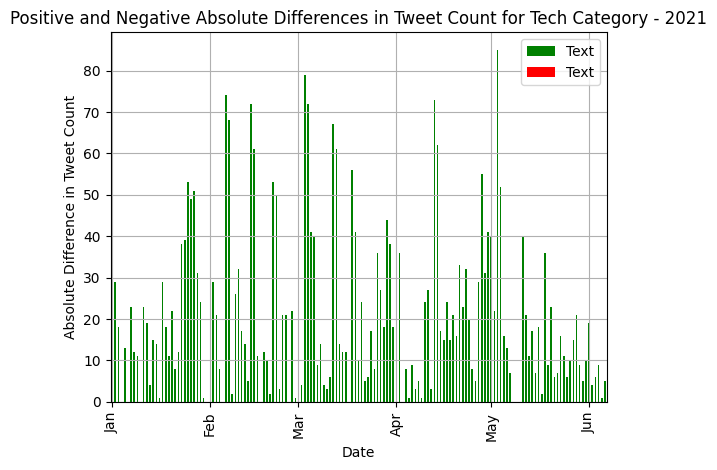

In [ ]:
# Filter the data for 2021
tweet_count_tech_2021 = tweet_count_tech[tweet_count_tech.index.year == 2021]

# Set the window size and order for the Savitzky-Golay filter
window = 21
order = 2

# Apply the Savitzky-Golay filter to the data
tweet_count_tech_2021_filtered = savgol_filter(tweet_count_tech_2021.values, window, order)

# Calculate the absolute differences between consecutive values in the dataframe
diffs = tweet_count_tech_2021.diff().abs()

# Create a new dataframe with separate columns for positive and negative differences
diffs_pos = diffs.where(diffs >= 0, other=0)
diffs_neg = diffs.where(diffs < 0, other=0)
diffs_bar = pd.concat([diffs_pos, diffs_neg], axis=1)

# Plot the positive and negative differences as separate bars in a bar chart
diffs_bar.plot(kind='bar', stacked=True, color=['green', 'red'])
plt.xlabel('Date')
plt.ylabel('Absolute Difference in Tweet Count')
plt.title('Positive and Negative Absolute Differences in Tweet Count for Tech Category - 2021')

# Add a grid to the plot
plt.grid(True)

# Set the format of the dates on the x-axis to show only the month
date_form = DateFormatter("%b")
plt.gca().xaxis.set_major_formatter(date_form)

# Set the locator for the x-axis ticks to show only the first day of each month
plt.gca().xaxis.set_major_locator(MonthLocator())

plt.show()


In [ ]:
# filter rows where 'sentiment_label' is not equal to 'SVM Predicted Label' and 'SVM Predicted Label' is not empty
filtered_df = result_merged[(result_merged['sentiment_label'] !=result_merged['SVM Predicted Label']) & (~result_merged['SVM Predicted Label'].isnull())]

# print the filtered dataframe
filtered_df

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label
412,723,723,hazemanhuzir,Asal buat IG live je kelam kabut tau dia ni. C...,2021-07-16 15:22:44+00:00,18875,8502,144,Twitter for Android,1416055707212812288,1416055707212812288,Main post,Entertainer,"Just doing IG live is a mess, you know. Try to...",live mess calm,"{'neg': 0.431, 'neu': 0.172, 'pos': 0.397, 'co...",-0.0516,Negative,Positive
445,767,767,CeddyOrNot,Oh? You don’t know what to do when people are ...,2021-11-03 12:49:24+00:00,917,85,86,Twitter for iPhone,1455879784139935744,1455879784139935744,Main post,Entertainer,Oh? You don’t know what to do when people are ...,dont people singing happy birthday,"{'neg': 0.428, 'neu': 0.572, 'pos': 0.0, 'comp...",-0.4585,Negative,Positive
483,829,829,brgsjks,Reply tweet ini sebagai tanda anda morning per...,2021-12-01 22:01:31+00:00,3214,1246,156,Twitter for iPhone,1466165590373007362,1466165590373007362,Main post,Entertainer,Reply to this tweet as a sign that you are a m...,reply tweet sign morning person ready face per...,"{'neg': 0.266, 'neu': 0.559, 'pos': 0.175, 'co...",-0.3182,Negative,Positive
650,1111,1111,Khairykj,RENTAS DAERAH DAN NEGERI BAGI TUJUAN VAKSINASI...,2021-05-04 12:15:07+00:00,2307,2490,70,Twitter for iPhone,1389554178305921029,1389554178305921029,Main post,Politics,REGIONAL AND COUNTRY RENTASING FOR THE PURPOSE...,regional country rentasing purpose covid vacci...,"{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compou...",0.4019,Positive,Negative
900,1606,1606,SyedSaddiq,Kerajaan: Rakyat yang susah waktu pandemik ken...,2021-11-16 09:37:57+00:00,2241,1627,119,Twitter for iPhone,1460542646598791168,1460542646598791168,Main post,Politics,Government: People who are having a hard time ...,government people hard time pandemic withdraw ...,"{'neg': 0.068, 'neu': 0.821, 'pos': 0.111, 'co...",0.2263,Positive,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76376,151874,151874,UmarHarith,@SyedSaddiq Terima kasih beritahu semua ni. Ka...,2021-10-02 01:48:35+00:00,15,1,0,Twitter for iPhone,1444117075832684548,1443521421481627650,reply,Politics,@SyedSaddiq Thank you for telling me all this....,telling generations young people holy face sal...,"{'neg': 0.149, 'neu': 0.769, 'pos': 0.082, 'co...",-0.3182,Negative,Positive
76388,151894,151894,amar71335685,@SyedSaddiq @HlmiHnfi Beri rakyat seorg sejuta...,2021-10-03 05:25:00+00:00,0,0,0,Twitter Web App,1444533924760211464,1443521421481627650,reply,Politics,@SyedSaddiq @HlmiHnfi Give the people a millio...,people millionlet millionaireslive happily stress,"{'neg': 0.298, 'neu': 0.319, 'pos': 0.383, 'co...",0.2023,Positive,Negative
76422,151943,151943,ZubirAl03596168,"@SyedSaddiq @mraaj89 Apa pun,di Boleh Land, ke...",2022-01-05 02:50:24+00:00,0,0,0,Twitter for Android,1478559479411077120,1443521421481627650,reply,Politics,"@SyedSaddiq @mraaj89 Whatever, in Boleh Land, ...",boleh land luxury sun standard morons perverte...,"{'neg': 0.283, 'neu': 0.585, 'pos': 0.132, 'co...",-0.4767,Negative,Positive
76444,151993,151993,sayasyafiqazlan,@SyedSaddiq Hahaha jahat!!,2021-09-28 08:06:34+00:00,0,0,0,Twitter for iPhone,1442762646705479682,1442761091109441536,reply,Politics,@SyedSaddiq Hahaha evil!!,hahaha evil,"{'neg': 0.55, 'neu': 0.0, 'pos': 0.45, 'compou...",-0.2023,Negative,Positive


In [ ]:
text =  ['i','people','yuna','faz','fazura','yb','malaysia','azfar','ceddy','maxis','swt','sir','bro','dsai']


# loop over each dataframe and remove the specified words from the "translated cleaned" column
for df_name in ["result_tech", "result_pol", "result_enter", "result_entrep", "result_celeb", "result_merged", "result_others"]:
    df = globals()[df_name] # get the dataframe by name
    df["translated cleaned"] = df["translated cleaned"].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in text]))


In [ ]:
result_tech

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label
0,2,2,XavierNaxa,Melihat cara kerajaan mahupun pembangkang meny...,2021-12-26 07:16:38+00:00,3047,2239,50,Twitter for iPhone,1475002598327394306,1475002598327394306,Main post,Technology,Seeing how the government and the opposition s...,government opposition solved flood issue times...,"{'neg': 0.126, 'neu': 0.651, 'pos': 0.223, 'co...",0.2732,Positive,NaN
1,3,3,XavierNaxa,Penatlah dapat sorang menteri perasan cantik n...,2021-12-19 13:59:40+00:00,10386,6531,57,Twitter Web App,1472567309940129792,1472567309940129792,Main post,Technology,Tired of getting a minister to notice this bea...,tired minister notice beauty,"{'neg': 0.333, 'neu': 0.23, 'pos': 0.437, 'com...",0.2263,Positive,NaN
2,4,4,XavierNaxa,Apakah produk Apple yang berjaya anda miliki p...,2021-12-17 16:42:15+00:00,397,60,293,Twitter for iPhone,1471883452324597762,1471883452324597762,Main post,Technology,What are the successful Apple products you hav...,successful apple products year,"{'neg': 0.0, 'neu': 0.441, 'pos': 0.559, 'comp...",0.5859,Positive,Positive
3,5,5,XavierNaxa,Promosi penukaran bateri iPhone 8 dan iPhone 8...,2021-12-14 10:57:18+00:00,921,532,63,Twitter for iPhone,1470709477196193796,1470709477196193796,Main post,Technology,iPhone 8 and iPhone 8 Plus battery replacement...,iphone iphone battery replacement promotion lo...,"{'neg': 0.111, 'neu': 0.741, 'pos': 0.148, 'co...",0.1779,Positive,Positive
4,6,6,XavierNaxa,Apa barangan menarik sempena 12.12 yang telah ...,2021-12-11 16:58:35+00:00,225,28,67,Twitter for iPhone,1469713235125309445,1469713235125309445,Main post,Technology,What interesting items in conjunction with 12....,interesting items conjunction bought share,"{'neg': 0.0, 'neu': 0.38, 'pos': 0.62, 'compou...",0.5994,Positive,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2813,7965,7965,Angahsmart,@acaiijawe Bapak saya selalu kirim yong tau fu...,2021-01-03 07:18:18+00:00,0,0,0,Twitter for Android,1345630552498475013,1345340323946319873,reply,Technology,@acaiijawe My father always sends yong tau fu ...,father sends yong tau kalau night market asks ...,"{'neg': 0.0, 'neu': 0.632, 'pos': 0.368, 'comp...",0.7506,Positive,NaN
2814,7969,7969,EylaJr,"@acaiijawe Ini benda paling favourite, dulu, k...",2021-01-03 11:13:36+00:00,1,0,0,Twitter for Android,1345689765790638081,1345340323946319873,reply,Technology,"@acaiijawe This is the most favorite thing, th...",favorite thing forever,"{'neg': 0.0, 'neu': 0.4, 'pos': 0.6, 'compound...",0.4588,Positive,NaN
2815,7971,7971,supriseboxFL,@acaiijawe Hi tumpang iklan utk rezeki saya 🥺🙏...,2021-01-03 15:46:57+00:00,2,1,0,Twitter for iPhone,1345758557598191616,1345340323946319873,reply,Technology,@acaiijawe Hi ride ads for my sustenance 🥺🙏\nA...,ride ads sustenance gift partner surprise love...,"{'neg': 0.124, 'neu': 0.353, 'pos': 0.524, 'co...",0.7783,Positive,NaN
2816,7972,7972,melatijelitaa,@acaiijawe Paling menyampah kalau tak letak tn...,2021-01-03 19:58:22+00:00,0,0,0,Twitter for iPhone,1345821825989677056,1345340323946319873,reply,Technology,@acaiijawe It's the most rubbish if you don't ...,rubbish price tag day lot dumb seller support ...,"{'neg': 0.151, 'neu': 0.596, 'pos': 0.252, 'co...",0.2960,Positive,NaN


In [ ]:
# Calculate the percentage of tweets that are positive, negative, or neutral for each category
category_counts = result_merged.groupby("Category")["SVM Predicted Label"].value_counts(normalize=True) * 100
category_counts

Category            SVM Predicted Label
Celebrity           Positive               79.500000
                    Negative               20.500000
Entertainer         Positive               63.766633
                    Negative               36.233367
Entrepreneur        Positive               74.697581
                    Negative               25.302419
Fitness and others  Positive               64.876691
                    Negative               35.123309
Politics            Positive               58.409571
                    Negative               41.590429
Technology          Positive               67.838313
                    Negative               32.161687
Name: SVM Predicted Label, dtype: float64

In [ ]:
# Calculate the percentage of tweets that are positive, negative, or neutral for each category
category_counts2 = result_merged.groupby("Category")["sentiment_label"].value_counts(normalize=True) * 100
category_counts2 = category_counts2.round().astype(int)
category_counts2

Category            sentiment_label
Celebrity           Positive           77
                    Negative           23
Entertainer         Positive           64
                    Negative           36
Entrepreneur        Positive           74
                    Negative           26
Fitness and others  Positive           64
                    Negative           36
Politics            Positive           58
                    Negative           42
Technology          Positive           66
                    Negative           34
Name: sentiment_label, dtype: int32

<AxesSubplot: xlabel='Category'>

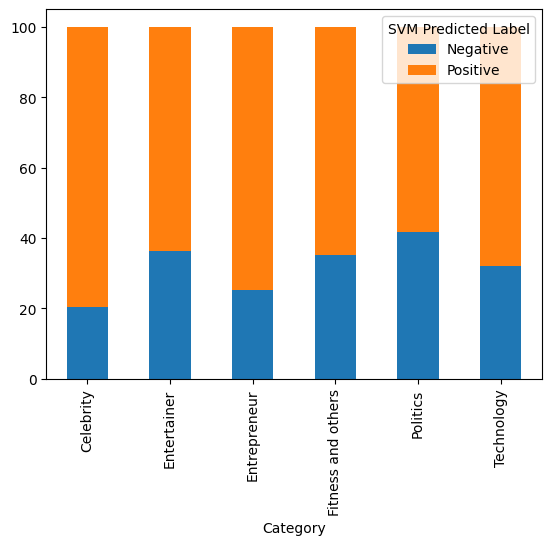

In [ ]:
# Plot the results
category_counts.unstack(level=1).plot(kind="bar", stacked=True)

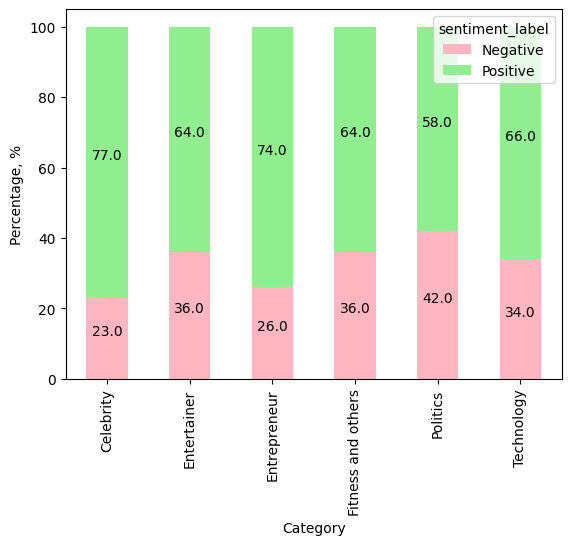

In [ ]:
import matplotlib.pyplot as plt

# Plot the results
ax = category_counts2.unstack(level=1).plot(kind="bar", stacked=True, color=["#FFB6C1", "#90EE90"])

# Add value labels to each column
for c in ax.containers:
    ax.bar_label(c, label_type="center", labels=c.datavalues, padding=5)

# Set the y-axis label
ax.set_ylabel("Percentage, %")

# Show the plot
plt.show()


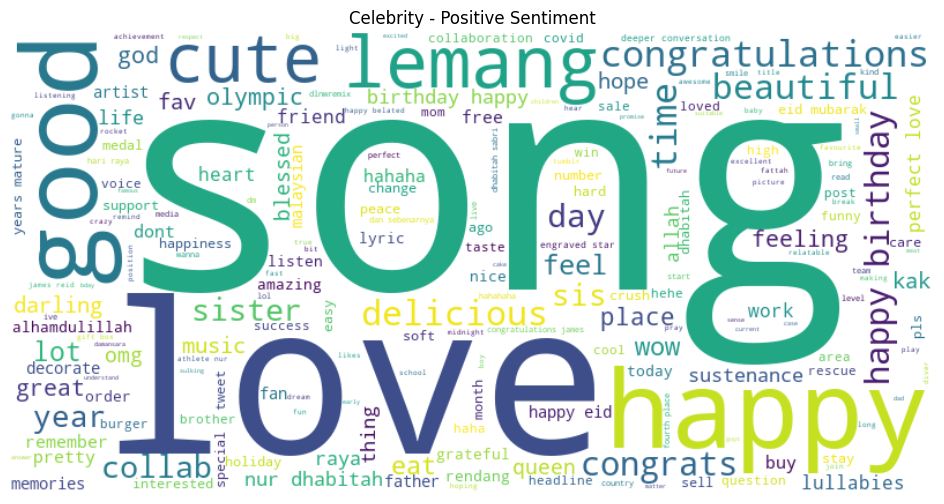

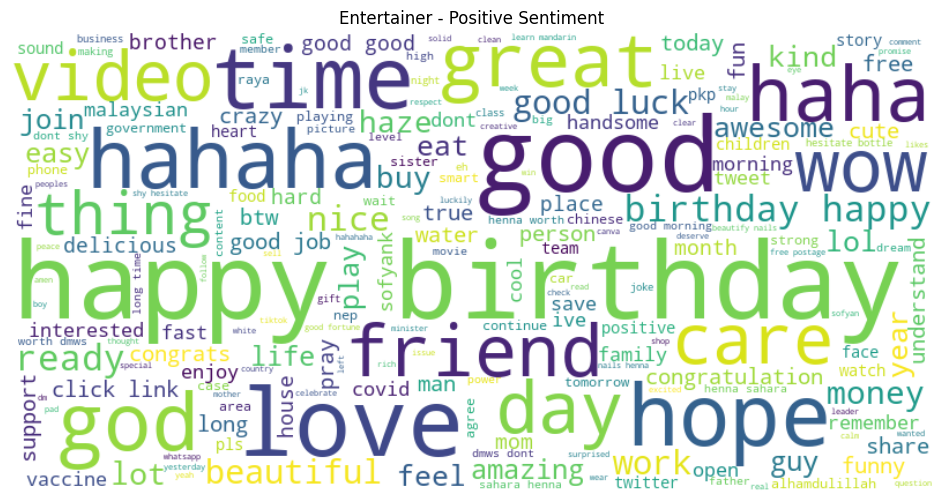

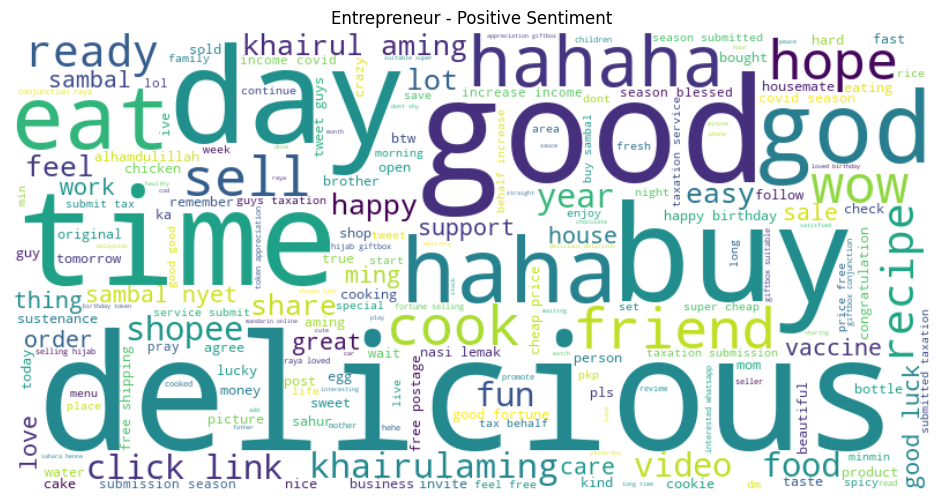

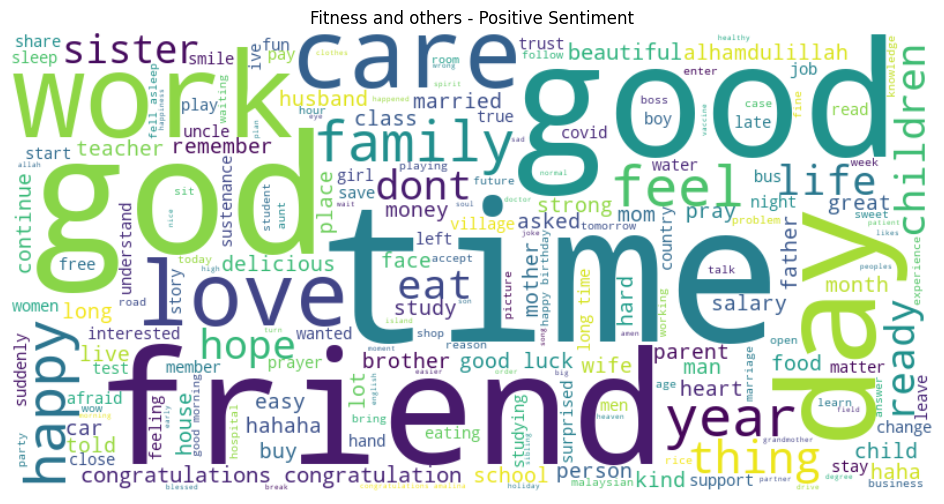

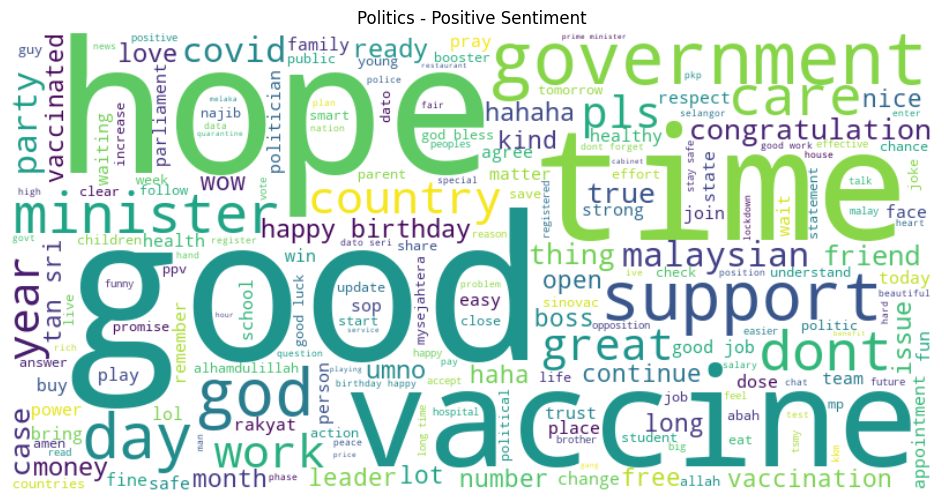

...

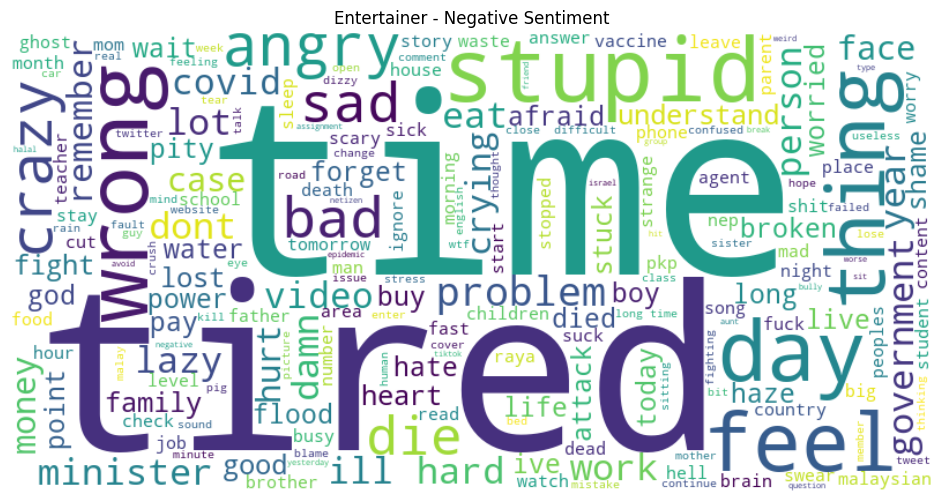

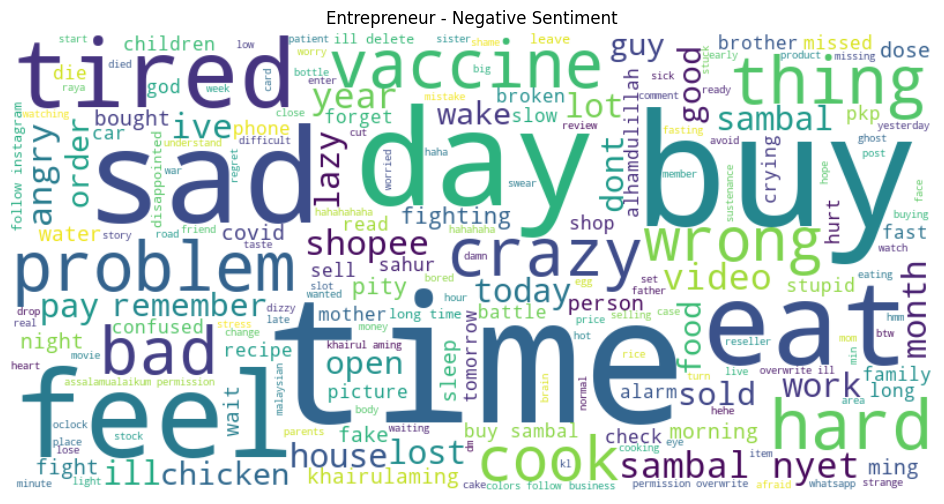

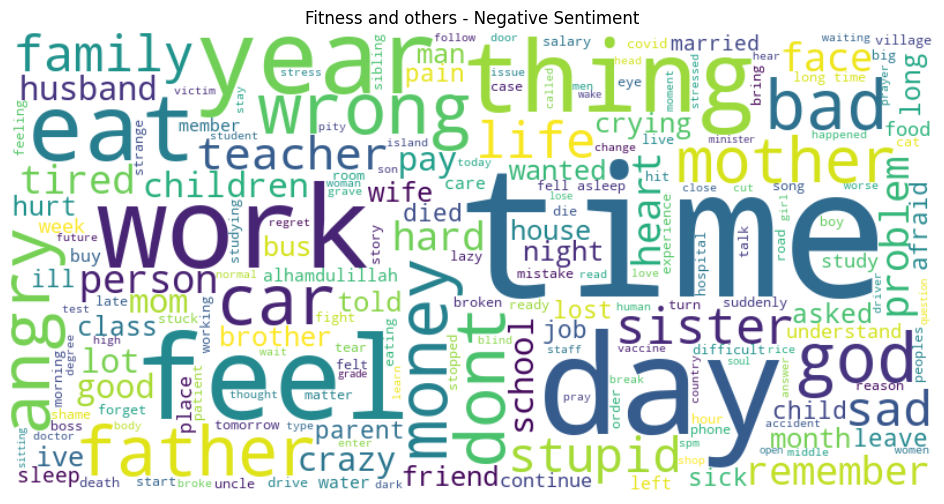

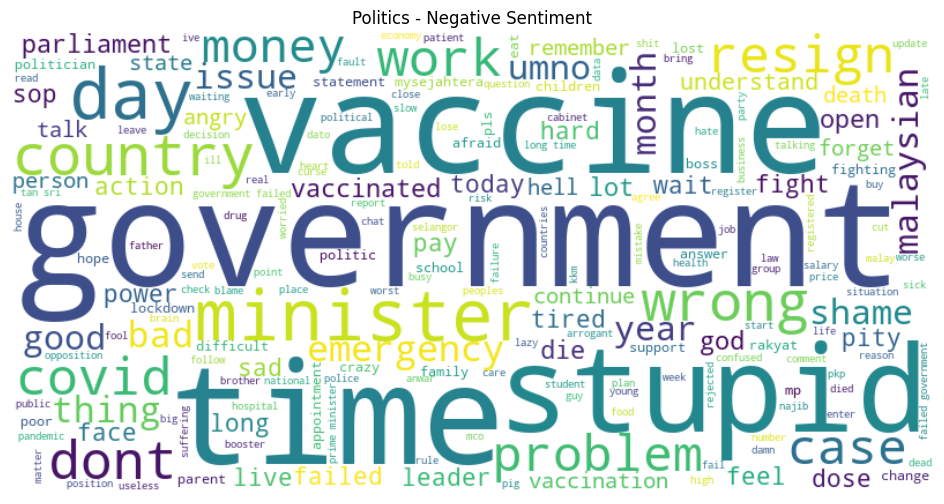

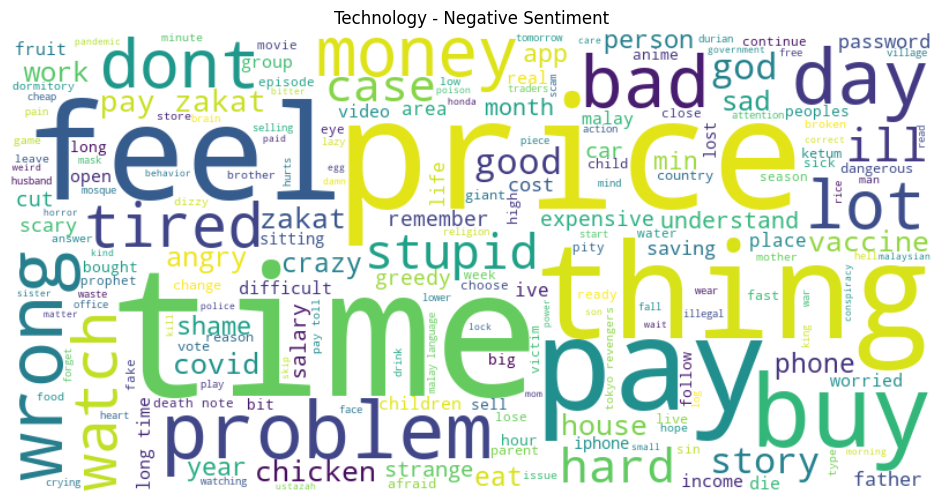

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Create separate dataframes for positive and negative sentiment for each category
pos_sentiment = result_merged[result_merged['sentiment_label']=='Positive'].groupby("Category", group_keys=True)["translated cleaned"].apply(lambda x: " ".join(x.astype(str)))
neg_sentiment = result_merged[result_merged['sentiment_label']=='Negative'].groupby("Category", group_keys=True)["translated cleaned"].apply(lambda x: " ".join(x.astype(str)))

# Generate a word cloud for each category and sentiment
for category, text in pos_sentiment.items():
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{category} - Positive Sentiment")
    plt.show()

for category, text in neg_sentiment.items():
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{category} - Negative Sentiment")
    plt.show()


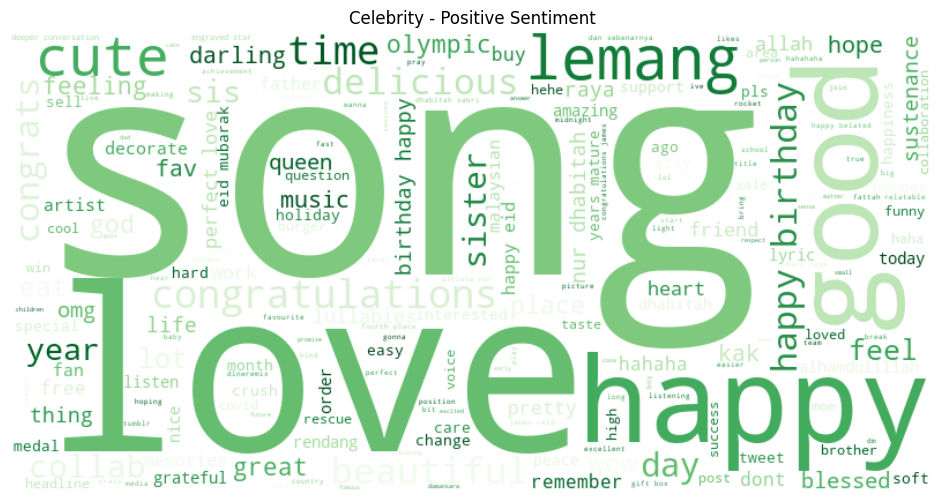

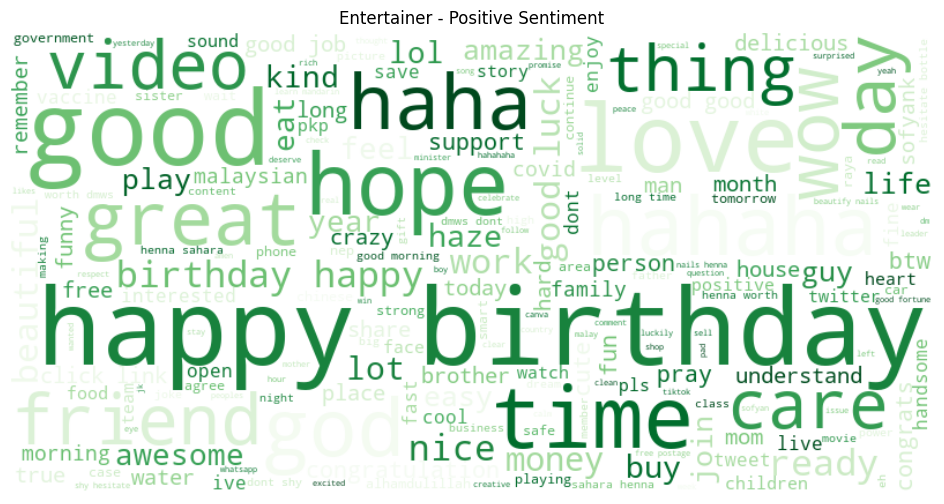

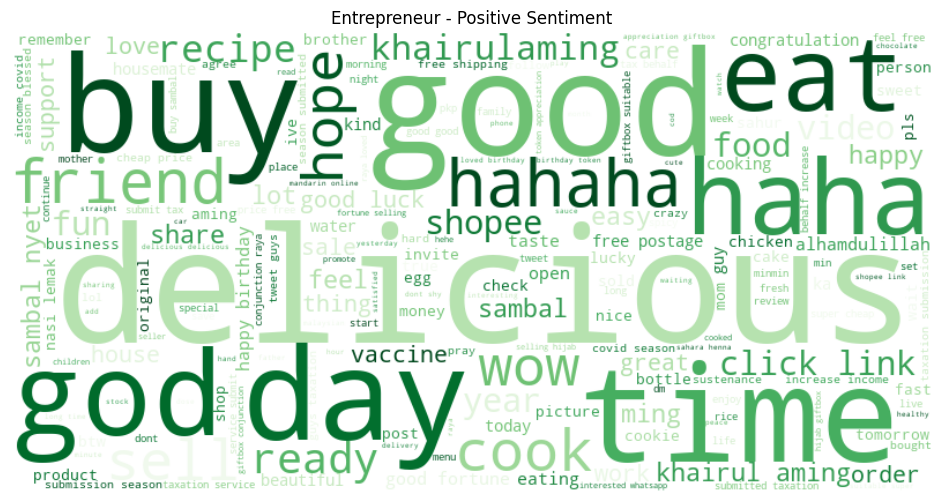

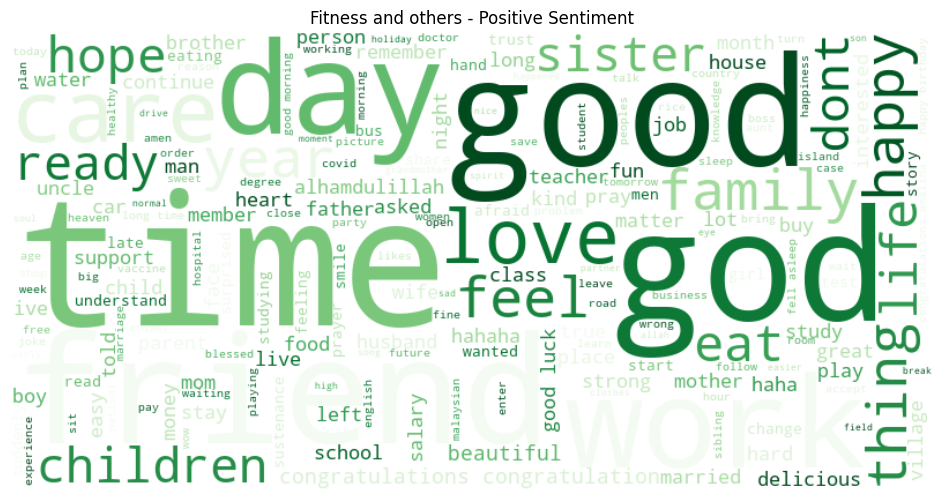

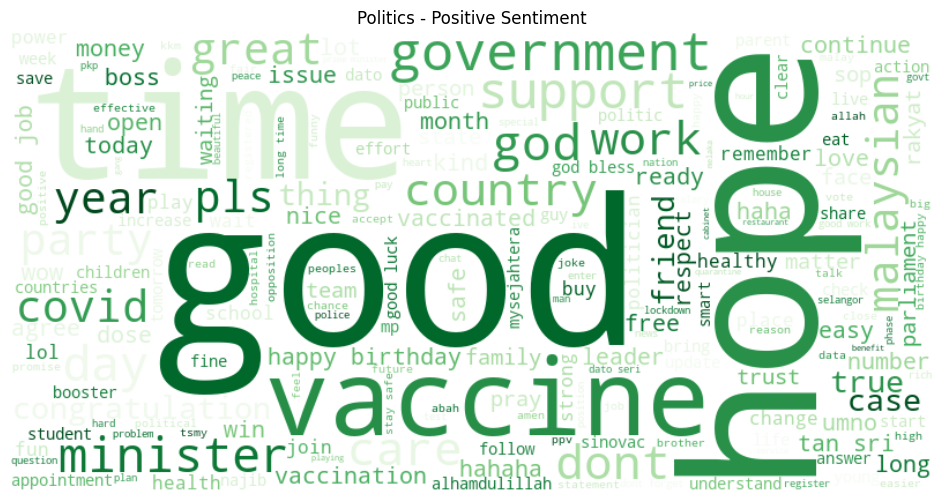

...

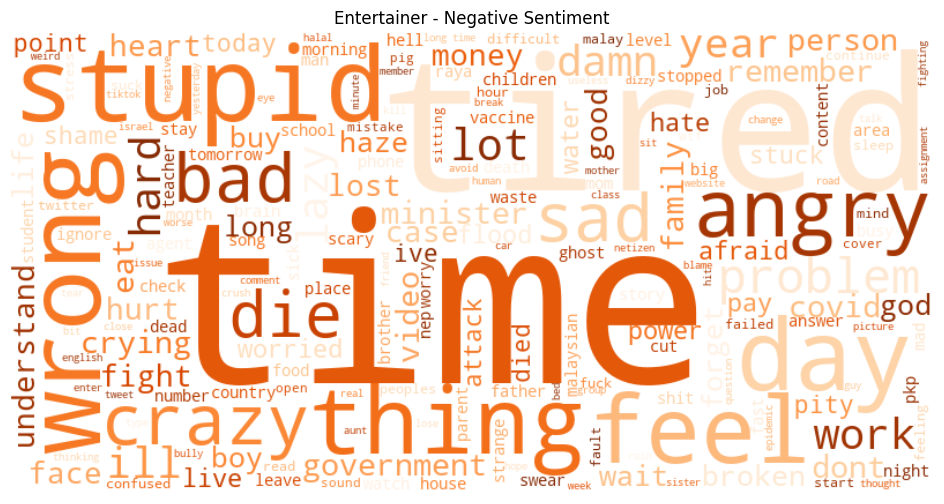

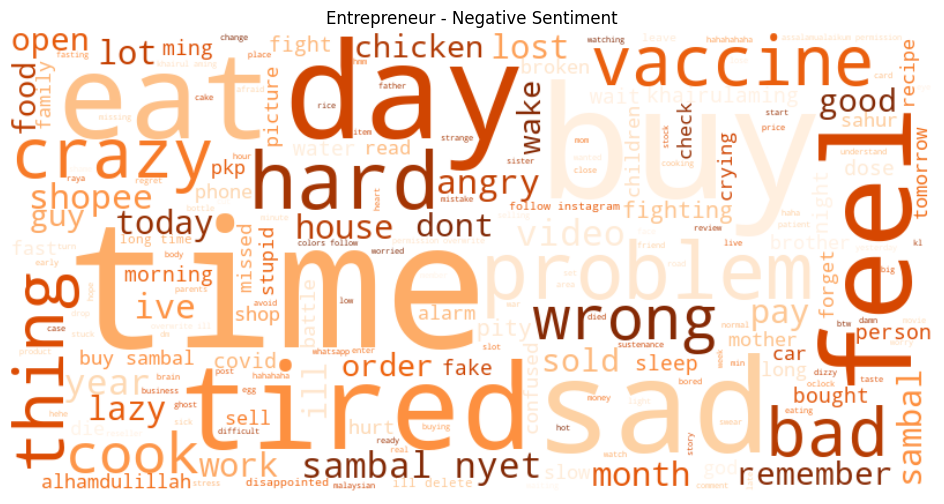

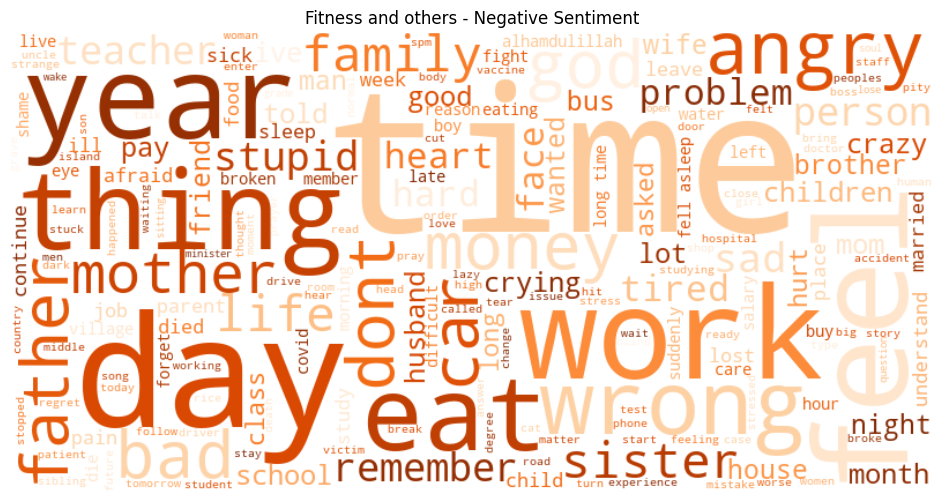

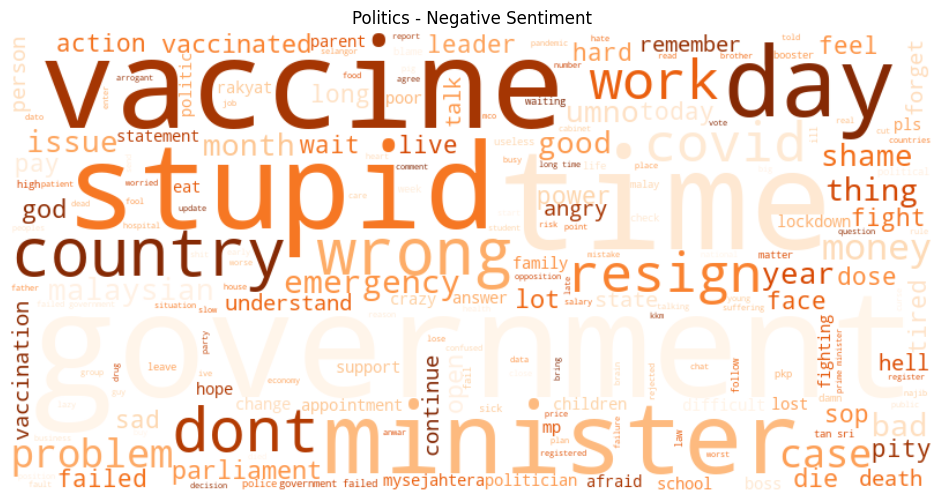

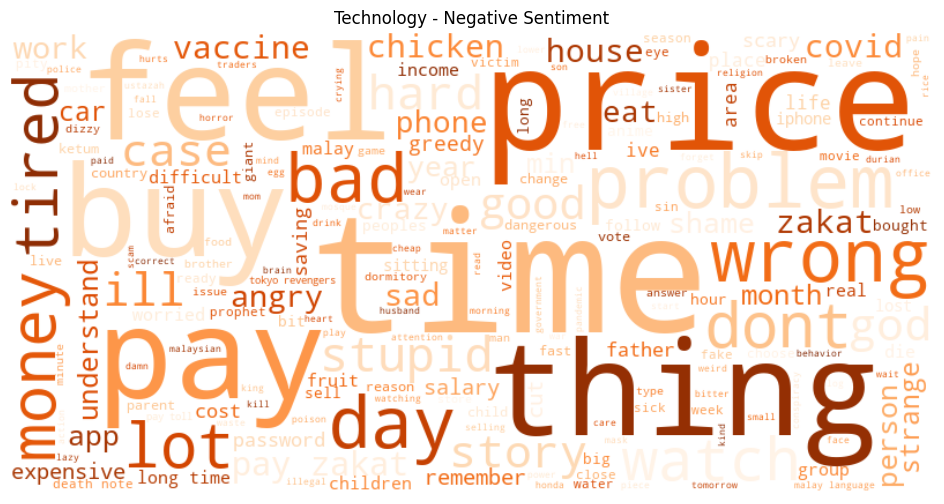

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

#Create separate dataframes for positive and negative sentiment for each category
pos_sentiment = result_merged[result_merged['sentiment_label']=='Positive'].groupby("Category", group_keys=True)["translated cleaned"].apply(lambda x: " ".join(x.astype(str)))
neg_sentiment = result_merged[result_merged['sentiment_label']=='Negative'].groupby("Category", group_keys=True)["translated cleaned"].apply(lambda x: " ".join(x.astype(str)))

#Generate a word cloud for each category and sentiment (Positive - Green, Negative - Orange)
for category, text in pos_sentiment.items():
    wordcloud = WordCloud(width=800, height=400, background_color="white", colormap='Greens').generate(text)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{category} - Positive Sentiment")
    plt.show()

for category, text in neg_sentiment.items():
    wordcloud = WordCloud(width=800, height=400, background_color="white", colormap='Oranges').generate(text)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{category} - Negative Sentiment")
    plt.show()

In [ ]:
import pandas as pd

# Set display option to show full text
pd.set_option('display.max_colwidth', None)

# Filter rows containing the keyword 'sri'
rows_with_keywords = result_celeb[result_celeb['translated cleaned'].str.contains('time', case=False)]

# Display the full text of the "Text" column
rows_with_keywords




,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label
25,8052,8052,YeopAzrul,@altimet Ketaasuban dan sentimen agama perkauman sempit amat tebal. Pray for malaysia.,2021-08-02 10:09:55+00:00,0,0,1,Twitter for Android,1422137580695408646,1422042040288923650,reply,Celebrity,@altimet Bigotry and narrow racial religious sentiments are very thick. Pray for Malaysia.,bigotry narrow racial religious sentiments thick pray,"{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}",0.3182,Positive,Positive
28,8058,8058,Reizki9,@altimet @SyedSaddiq Terus berjuang saudara altimet,2021-08-02 04:08:41+00:00,0,0,0,Twitter for Android,1422046671878328325,1422042040288923650,reply,Celebrity,@altimet @SyedSaddiq Keep fighting brother altimet,fighting brother altimet,"{'neg': 0.556, 'neu': 0.444, 'pos': 0.0, 'compound': -0.3612}",-0.3612,Negative,NaN
31,8062,8062,ohw4ni,"@altimet Waktu PRU masing2 mula turun padang,PEDULI rakyat.\nDapat kuasa 👉🏻 ABAI rakyat.",2021-08-02 04:53:04+00:00,1,0,0,Twitter Web App,1422057839091093510,1422042040288923650,reply,Celebrity,"@altimet It's time for the General Election to start taking the field, CARE about the people.\nGet power 👉🏻 ABAI people.",time general election start field care power abai,"{'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}",0.4939,Positive,NaN
34,8065,8065,itsbergies,"@altimet Jgn tgk kali ni je, tgk skali ketika pentadbiran. Kadang2 skang je jiwa rakyat, dpt kuasa trus jdi sampah. Mentadbir ekonomi pon kelaut. Tahu menyalahkan sedangkan dtg dri pentadbiran sendiri. 👌🏼",2021-08-02 05:13:08+00:00,28,5,0,Twitter for Android,1422062891260256256,1422042040288923650,reply,Celebrity,"@altimet Don't see it this time, never see it during the administration. Sometimes the soul of the people, gets power and then becomes trash. Administering the economy of the ocean. Know how to blame when it comes from the administration itself. 👌🏼",dont time administration soul power trash administering economy ocean blame administration,"{'neg': 0.179, 'neu': 0.821, 'pos': 0.0, 'compound': -0.34}",-0.3400,Negative,NaN
39,8073,8073,afzivaris,@altimet Kami dh letak pendirian kami PRU14 lepas.\n\nKawan baik saudara yg saudara support skrg la yg khianat pendirian kami atas sbb rakus nk jadi PM semasa 22 bulan PH perintah.\n\nOwh lupa masa tu saudara tgh masyuukk dgn job 😆,2021-08-02 06:11:29+00:00,2,0,0,Twitter for iPhone,1422077574767808515,1422042040288923650,reply,Celebrity,"@altimet We already put our stand in the last GE14.\n\nMy good friend, the one you support now, is the one who betrayed our position because he was greedy to become PM during the 22 months of PH's order.\n\nOh, I forgot that time, you were busy with your job 😆",stand good friend support betrayed position greedy months phs order forgot time busy job,"{'neg': 0.261, 'neu': 0.373, 'pos': 0.365, 'compound': 0.3612}",0.3612,Positive,NaN
63,8125,8125,harisdnl__,"@altimet ada sorang tu, sikit lagi nak tinggal camera man lepas bagi bantuan🤣",2021-07-08 17:14:12+00:00,0,0,0,Twitter for iPhone,1413184655382126603,1412728494639955974,reply,Celebrity,"@altimet there's someone there, just a little more time to leave the camera man to help 🤣",time leave camera man,"{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.0516}",-0.0516,Negative,NaN
66,8129,8129,mommieshot,@altimet semoga Allah permudahkan segala urusan dan murahkan rezeki Altimet.. Aamiin 🤲,2021-07-08 23:27:21+00:00,0,0,0,Twitter for Android,1413278562266742788,1412728494639955974,reply,Celebrity,@altimet may God ease all affairs and make Altimet's sustenance cheaper.. Amen 🤲,god ease affairs altimets sustenance cheaper amen,"{'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.5574}",0.5574,Positive,NaN
85,8176,8176,Epulatif,@altimet Orang cakap time heals.. tapi kita nampak mac

C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\19357046.py:11: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (category, sentiment), text in grouped_data.iteritems():


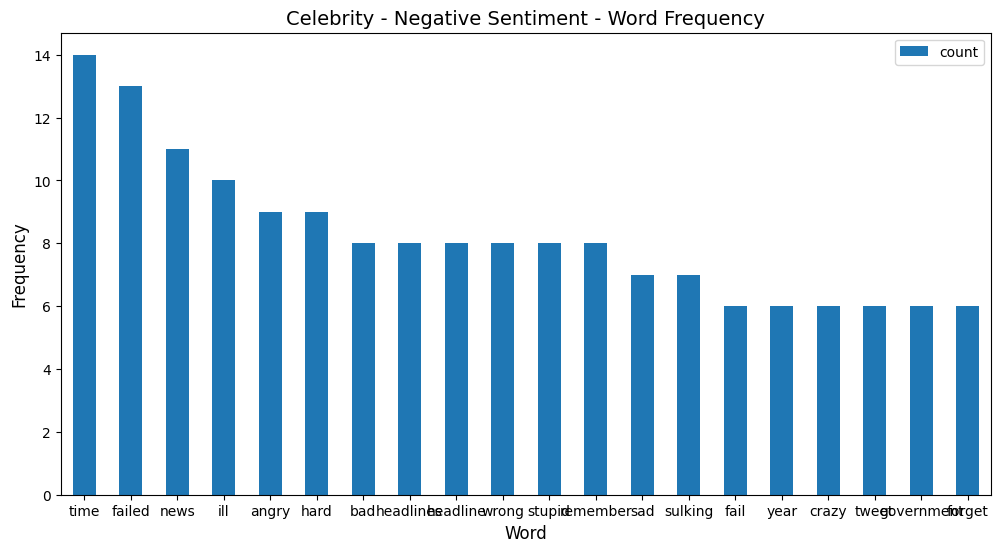

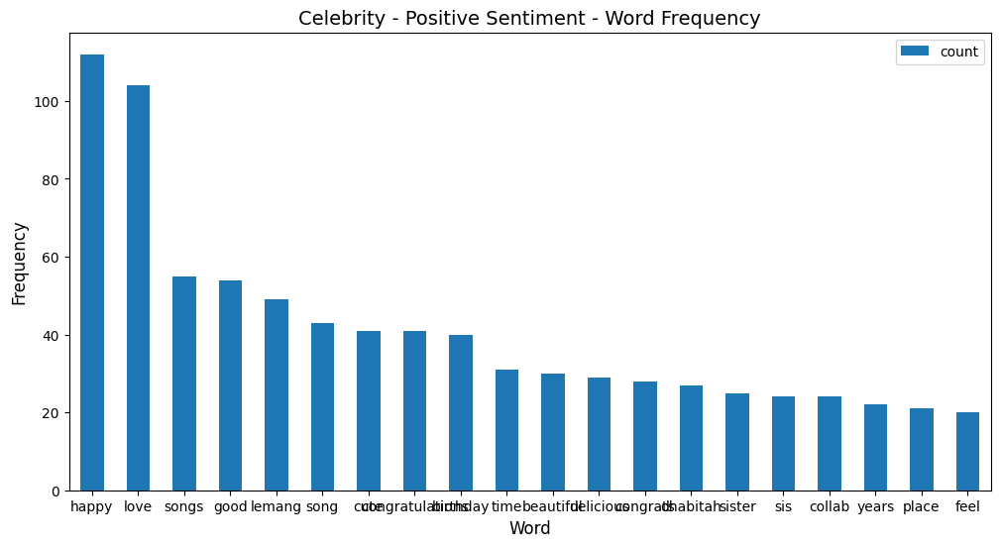

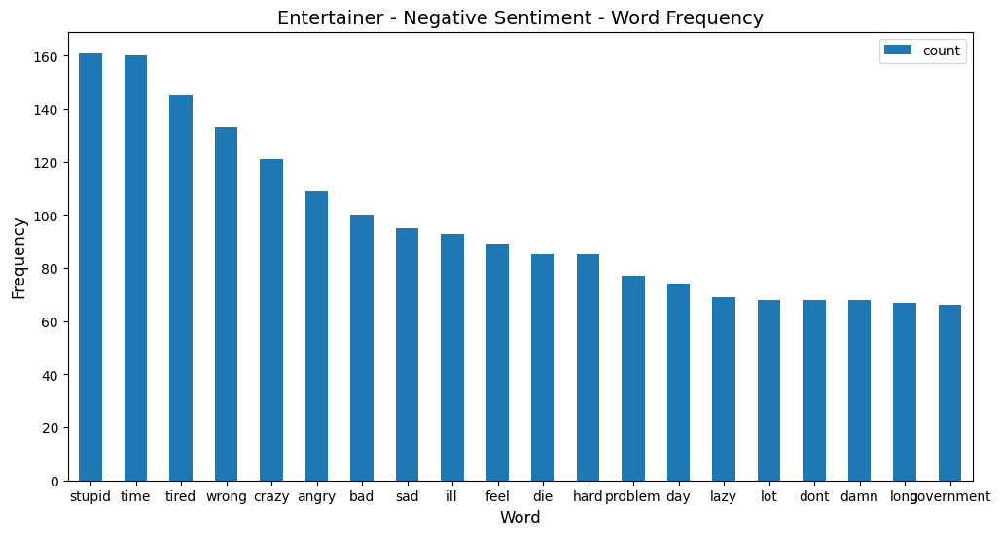

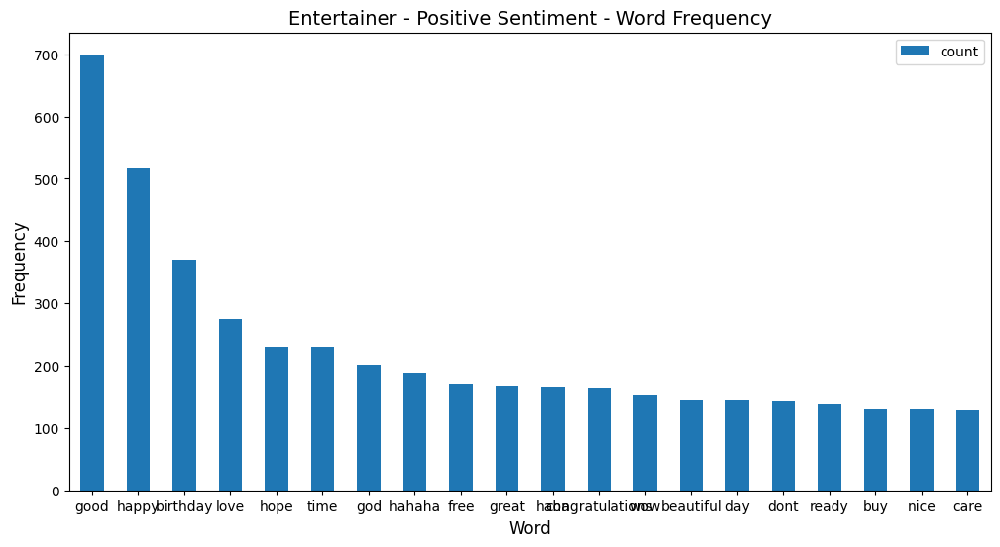

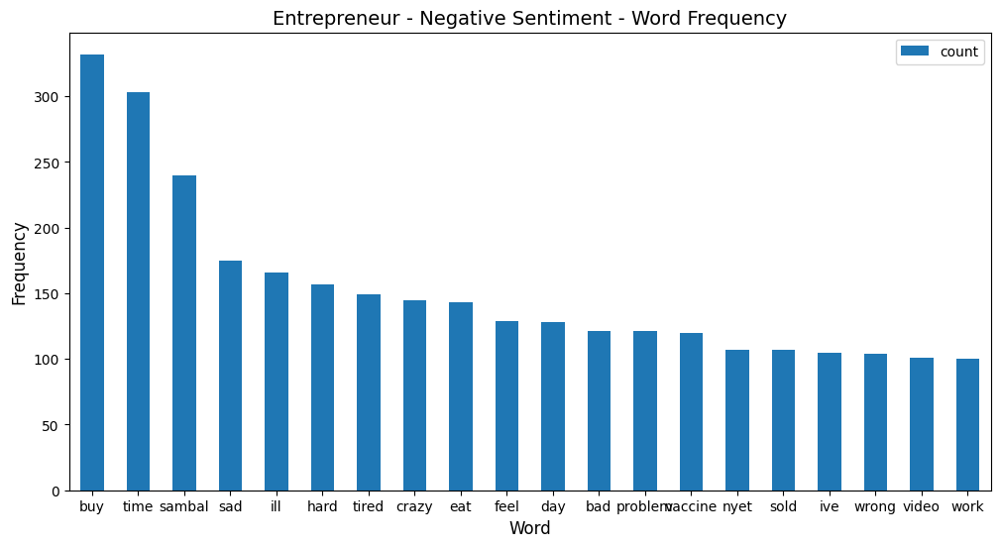

...

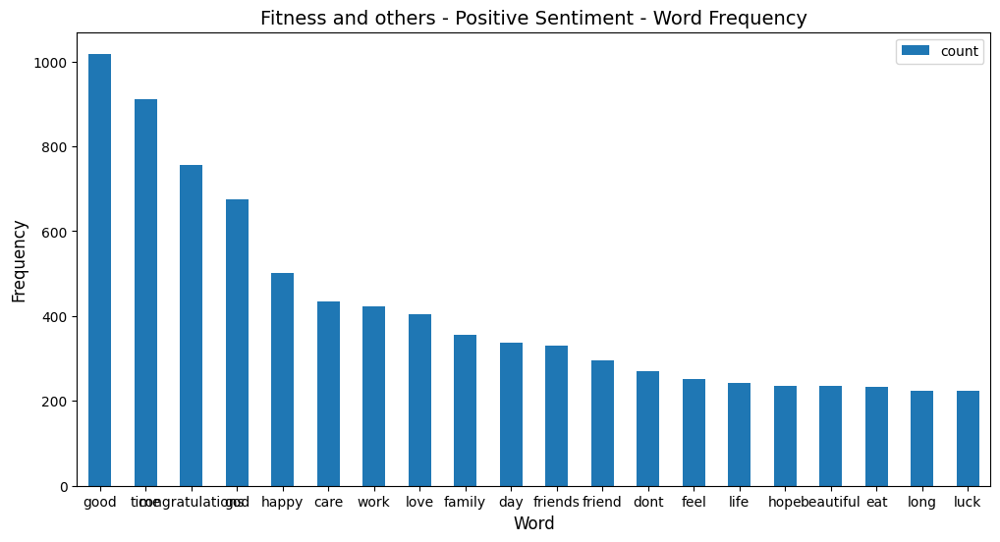

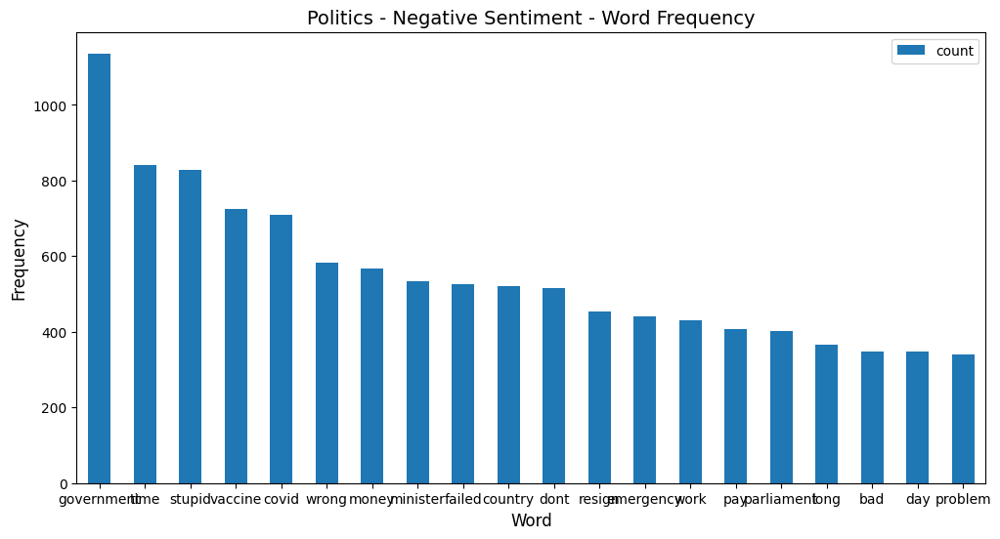

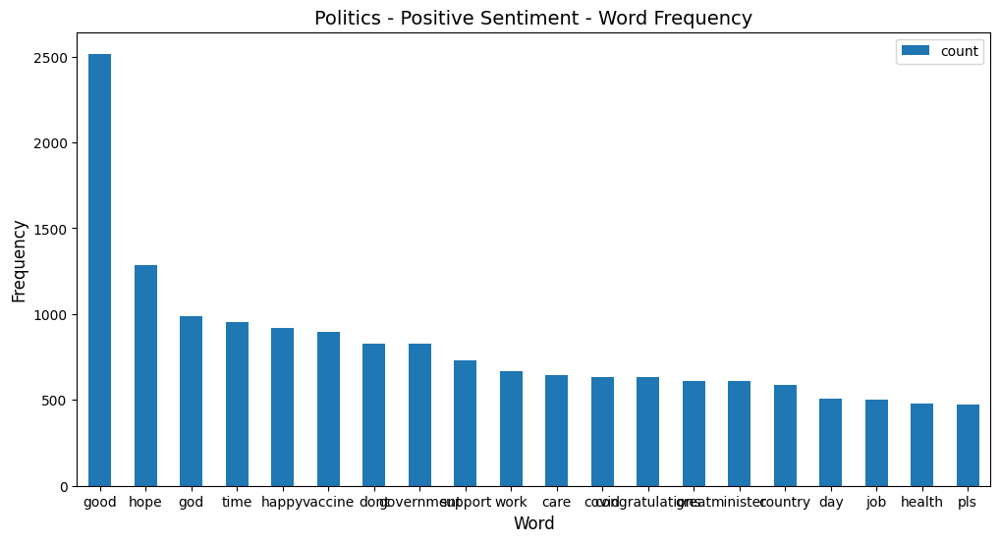

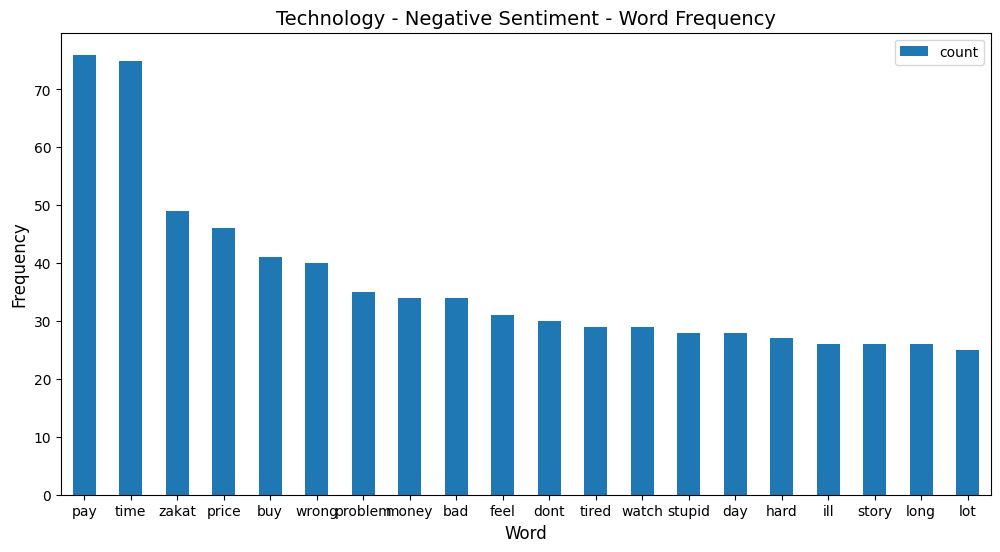

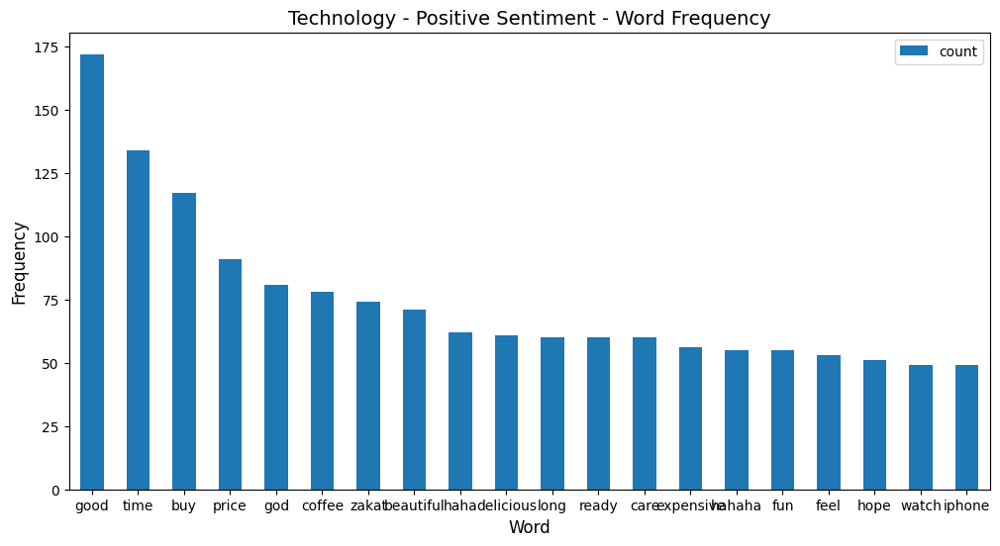

In [ ]:
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

# assuming 'result_merged' dataframe already exists

# Grouping the 'result_merged' dataframe by 'Category' and 'sentiment_label', then joining the 'translated cleaned' column for each group into a single string
grouped_data = result_merged.groupby(['Category', 'sentiment_label'])['translated cleaned'].apply(lambda x: ' '.join(x))

# Looping through each group, generating a bar chart for the frequency of each word in the text
for (category, sentiment), text in grouped_data.iteritems():
    # Split the text into individual words and remove the word 'i'
    words = filter(lambda x: x not in ['i','people','yuna','faz','fazura','yb','malaysia','azfar','ceddy','maxis','swt','sir','bro','dsai'], text.split())

    # Count the frequency of each word
    word_counts = Counter(words)

    # Create a dataframe with the word frequencies
    df = pd.DataFrame.from_dict(word_counts, orient='index', columns=['count'])

    # Sort the dataframe by count in descending order
    df = df.sort_values(by=['count'], ascending=False)

    # Generate a bar chart of the top 20 words
    ax = df.head(20).plot(kind='bar', rot=0, figsize=(12,6))
    ax.set_title(f"{category} - {sentiment} Sentiment - Word Frequency", fontsize=14)
    ax.set_xlabel("Word", fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)
    plt.show()


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2296655520.py:13: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (category, sentiment), text in grouped_data.iteritems():
c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


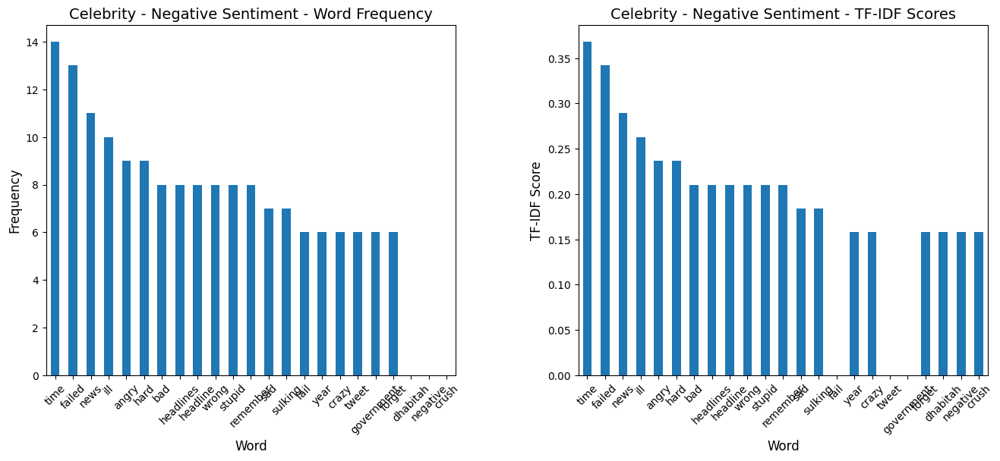

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


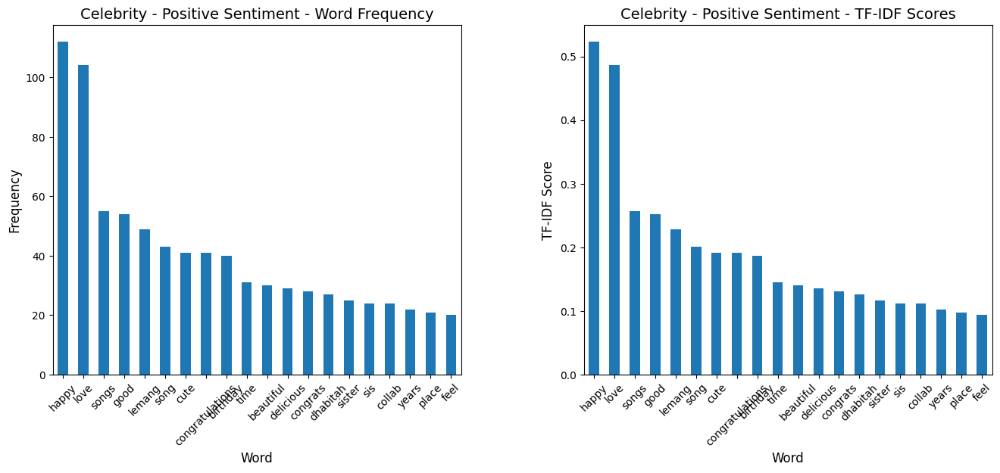

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


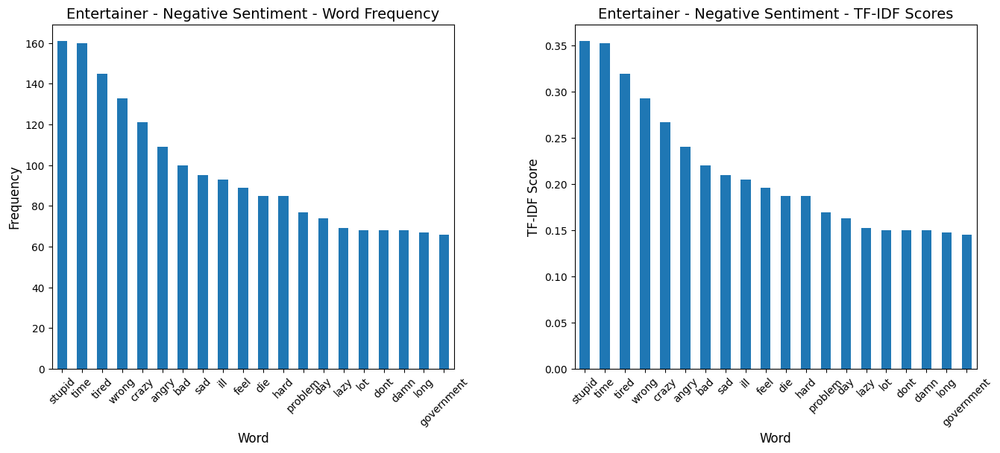

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


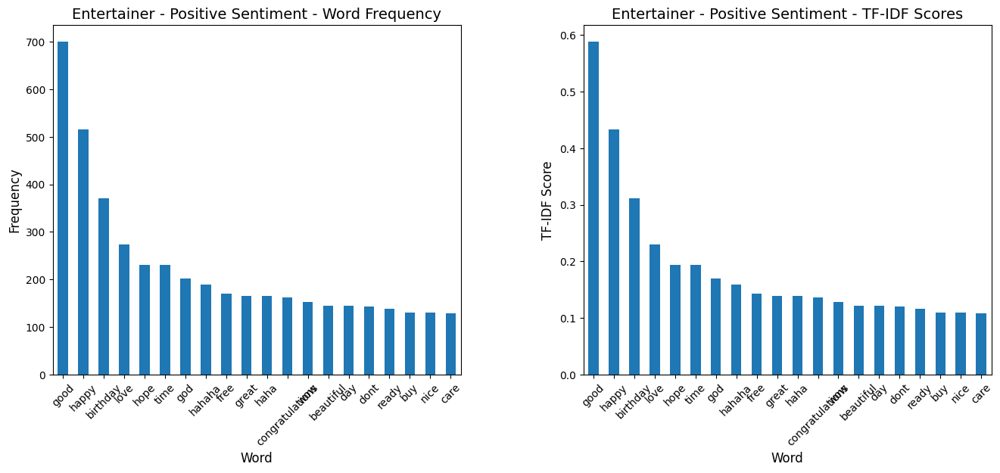

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


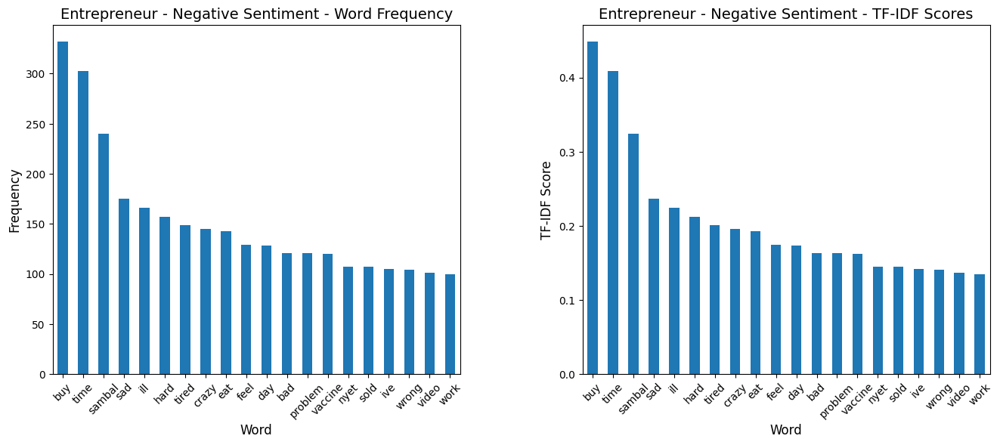

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


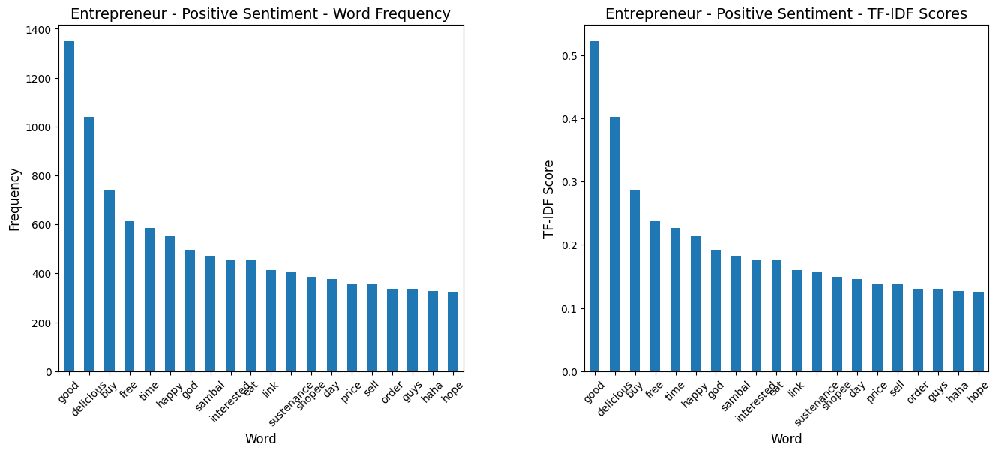

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


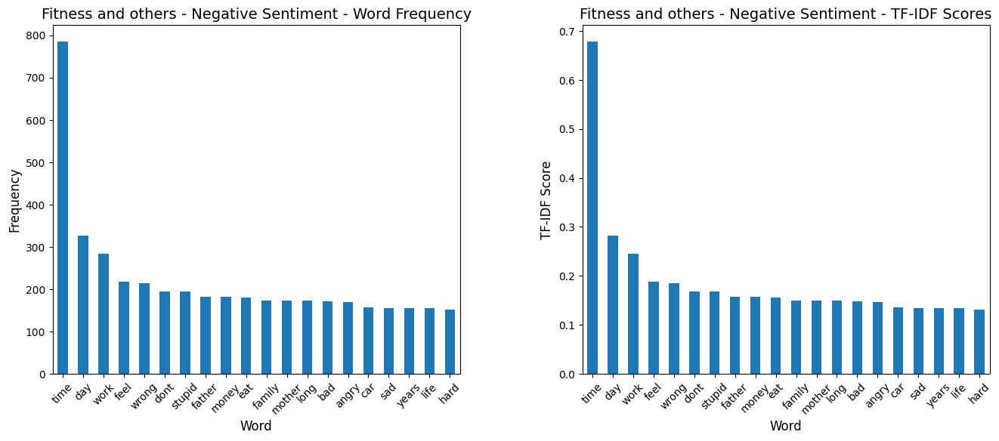

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


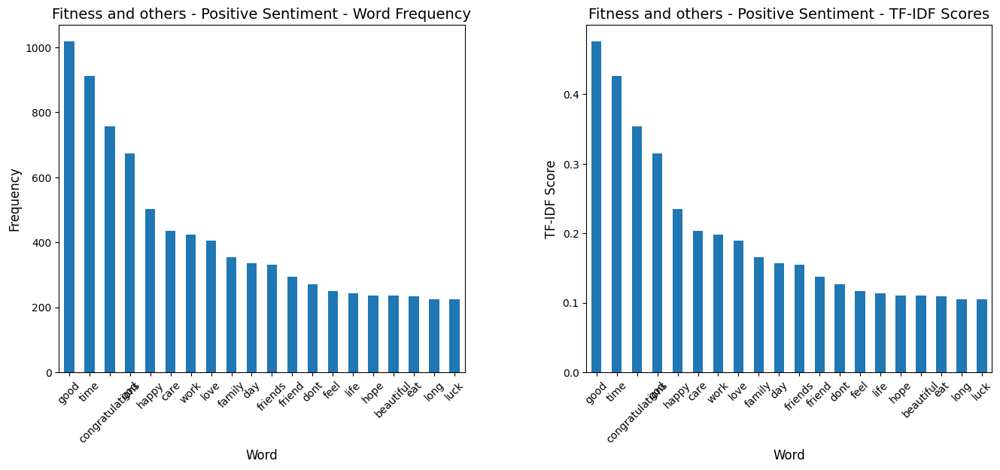

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


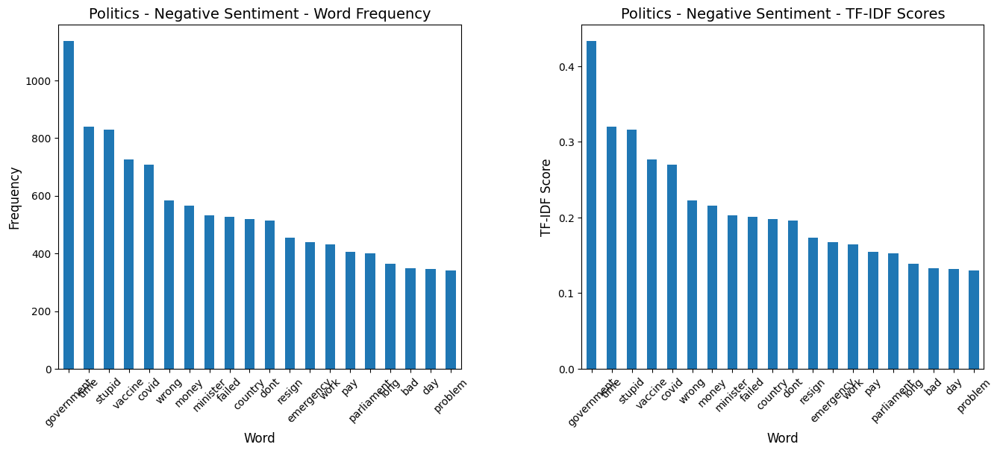

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


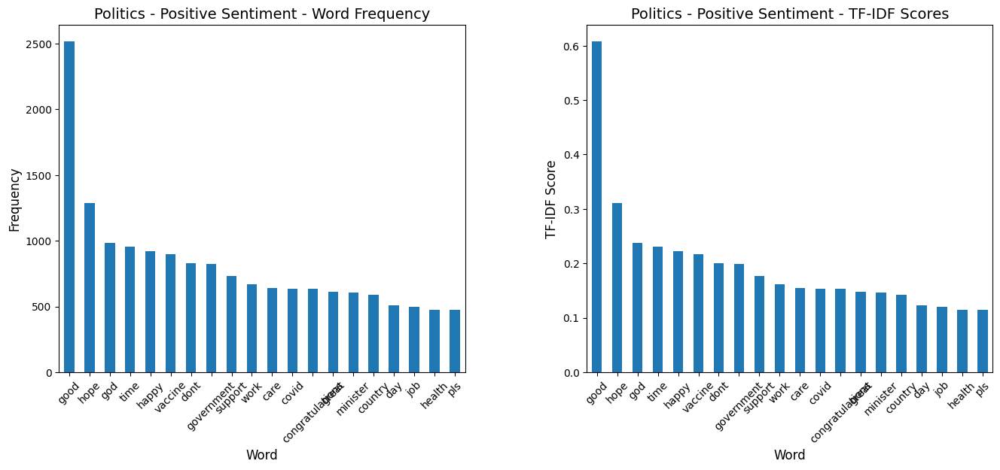

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


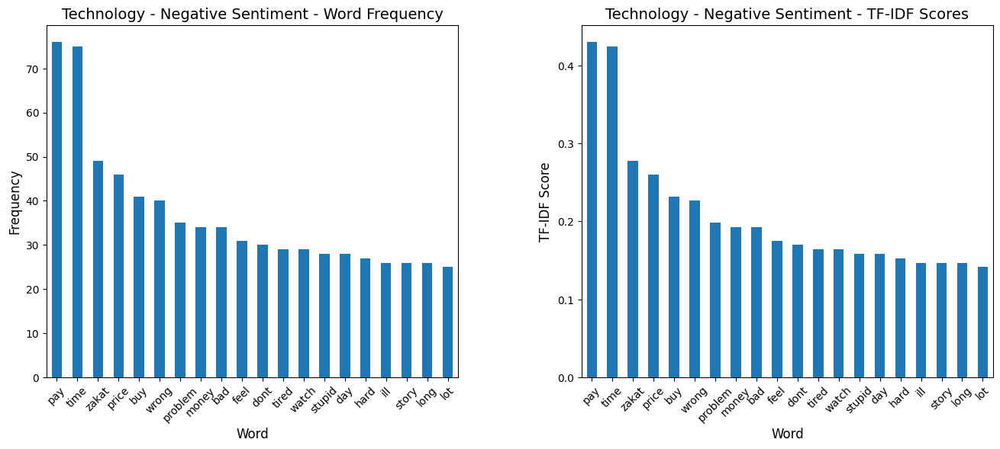

c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


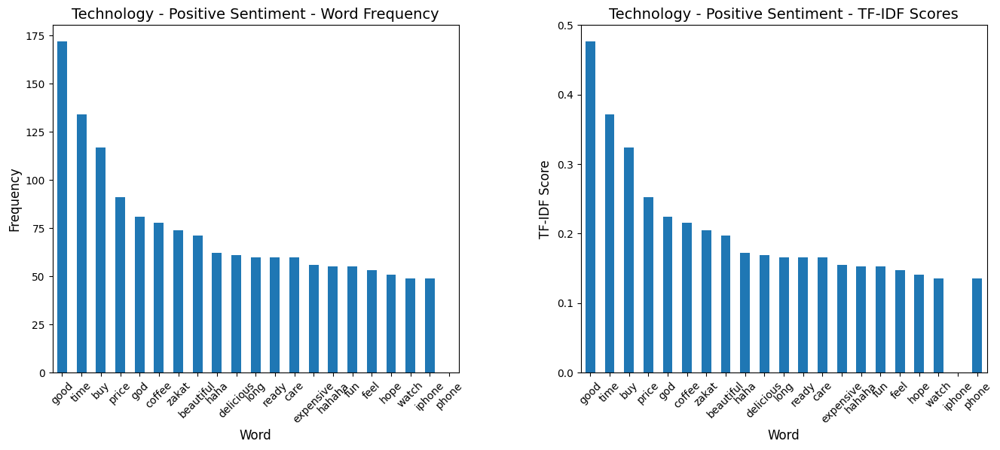

In [ ]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt
from itertools import tee

# assuming 'result_merged' dataframe already exists

# Grouping the 'result_merged' dataframe by 'Category' and 'sentiment_label', then joining the 'translated cleaned' column for each group into a single string
grouped_data = result_merged.groupby(['Category', 'sentiment_label'])['translated cleaned'].apply(lambda x: ' '.join(x))

# Looping through each group, generating bar charts for both word frequency and TF-IDF scores
for (category, sentiment), text in grouped_data.iteritems():
    # Split the text into individual words and remove the word 'i'
    words = filter(lambda x: x not in ['i','people','yuna','faz','fazura','yb','malaysia','azfar','ceddy','maxis','swt','sir','bro','dsai'], text.split())

    # Count the frequency of each word
    word_counts = Counter(words)

    # Create a dataframe with the word frequencies
    df_word_freq = pd.DataFrame.from_dict(word_counts, orient='index', columns=['count'])

    # Sort the dataframe by count in descending order
    df_word_freq = df_word_freq.sort_values(by=['count'], ascending=False)

    # Create a TF-IDF vectorizer
    tfidf = TfidfVectorizer(stop_words='english', max_features=20)

    # Calculate the TF-IDF scores for each word
    tfidf_scores = tfidf.fit_transform([text])

    # Create a pandas dataframe with the top 20 words and their TF-IDF scores
    df_tfidf = pd.DataFrame(tfidf_scores.T.todense(), index=tfidf.get_feature_names(), columns=["tfidf"])
    df_tfidf = df_tfidf.sort_values('tfidf', ascending=False).head(20)

    # Combine the two dataframes into a single dataframe for side-by-side comparison
    df_combined = pd.concat([df_word_freq.head(20), df_tfidf], axis=1)

    # Generate side-by-side bar charts of the top 20 words for both word frequency and TF-IDF scores
    fig, axs = plt.subplots(ncols=2, figsize=(16,6))

    # Word frequency chart
    ax1 = df_combined['count'].plot(kind='bar', rot=45, ax=axs[0])
    ax1.set_title(f"{category} - {sentiment} Sentiment - Word Frequency", fontsize=14)
    ax1.set_xlabel("Word", fontsize=12)
    ax1.set_ylabel("Frequency", fontsize=12)

    # Rotate the x-axis labels
    for tick in ax1.get_xticklabels():
        tick.set_rotation(45)

    # TF-IDF chart
    ax2 = df_combined['tfidf'].plot(kind='bar', rot=45, ax=axs[1])
    ax2.set_title(f"{category} - {sentiment} Sentiment - TF-IDF Scores", fontsize=14)
    ax2.set_xlabel("Word", fontsize=12)
    ax2.set_ylabel("TF-IDF Score", fontsize=12)

    # Rotate the x-axis labels
    for tick in ax2.get_xticklabels():
        tick.set_rotation(45)

    # Adjust the spacing between the two charts
    plt.subplots_adjust(wspace=0.3)

    plt.show()





In [ ]:
column_names = result_merged.columns
column_names_list = column_names.tolist()
column_names_list


['Unnamed: 0.1',
 'Unnamed: 0',
 'Username',
 'Text',
 'Date Created',
 'Number of Likes',
 'Number of Retweet',
 'Number of Replies',
 'Source of Tweet',
 'User ID',
 'Conversation ID',
 'status',
 'Category',
 'translated',
 'translated cleaned',
 'sentiment Scores',
 'sentiment',
 'sentiment_label',
 'SVM Predicted Label']

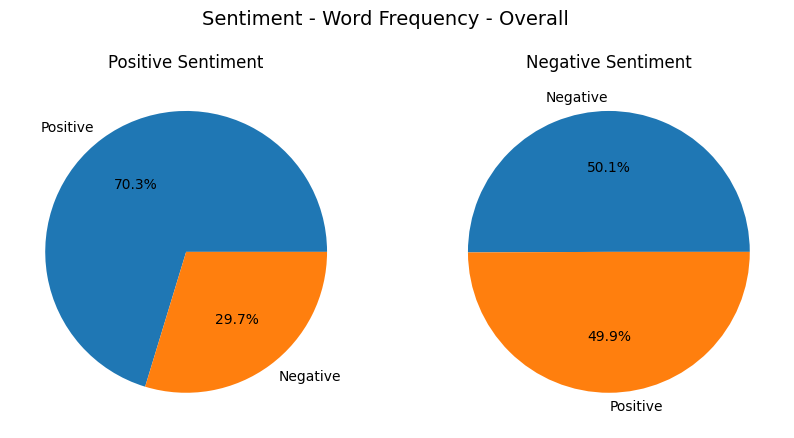

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[main_posts_df['SVM Predicted Label'] == 'Positive']
negative_main_posts_df = main_posts_df[main_posts_df['SVM Predicted Label'] == 'Negative']

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['SVM Predicted Label'].value_counts()
ax1.pie(counts_positive, labels=counts_positive.index, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')
# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['SVM Predicted Label'].value_counts()
ax2.pie(counts_negative, labels=counts_negative.index, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')
# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment - Word Frequency - Overall", fontsize=14)
# Display the chart
plt.show()


In [ ]:
negative_rows_df

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label
3381,7291,7291,MuadzMahfud,"@acaiijawe Haritu ada ternampak video Ustaz Kazim Elias dan Syeikh Zainul Asri yang ayat dia lebih kurang begini juga:\n\n""Zaman Nabi dulu mana ada solat jarak-jarak. Percayalah Tuan-Tuan. Kita sedang dimanipulasi oleh 'mereka'. Nanti kat akhirat Tuan-Tuan jawab la sendiri kat depan Allah""",2021-05-21 05:17:08+00:00,319,85,16,Twitter Web App,1395609584471994370,1395608041811107840,reply,Technology,"@acaiijawe Haritu saw a video of Ustaz Kazim Elias and Syeikh Zainul Asri whose verse was more or less like this:\n\n""During the time of the Prophet, there was no distance prayer. Believe me, gentlemen. We are being manipulated by 'them'. Later in the afterlife, gentlemen, you will answer for yourself in front of God.""",haritu video ustaz kazim elias syeikh zainul asri verse time prophet distance prayer gentlemen manipulated afterlife gentlemen answer god,"{'neg': 0.12, 'neu': 0.783, 'pos': 0.097, 'compound': -0.128}",-0.1280,Negative,NaN
3382,7292,7292,wafaasssss,"@acaiijawe ada juga sebarkan whatsapp supaya adakan banyak majlis ilmu dan solat berjemaah sentiasa agar dapat rahmat Allah dan malaikat ustz. katanya, jangan takut pada penyakit. takutlah pada Allah.",2021-05-21 05:40:16+00:00,93,10,3,Twitter for iPhone,1395615403888439304,1395608041811107840,reply,Technology,"@acaiijawe also spread whatsapp so that there are many knowledge meetings and congregational prayers always to get the grace of God and ustz angels. he said, don't be afraid of disease. fear Allah.",spread whatsapp knowledge meetings congregational prayers grace god ustz angels afraid disease fear allah,"{'neg': 0.168, 'neu': 0.576, 'pos': 0.257, 'compound': 0.1779}",0.1779,Positive,Positive
3383,7293,7293,fkrihkm,"@acaiijawe Covid-19 mmg real &amp; bahaya. Tapi, merapatkan saf adalah Sunnah dan Kita sebagai Muslim kena yakin, walau solat rapat InshaAllah Kita di lindungi. Secara logic, walaupun solat jarak, Jika hendak kena covid tetap kena. Limitkan utk jemaah boleh di buat ikut kapasiti masjid/surau",2021-05-21 08:57:51+00:00,120,30,33,Twitter for Android,1395665128062787585,1395608041811107840,reply,Technology,"@acaiijawe Covid-19 is real &amp; danger. But, closing ranks is Sunnah and we as Muslims have to be confident, even if we pray close together InshaAllah we are protected. Logically, even if you pray at a distance, if you want to get covid, you will still get it. Limit for the congregation can be made according to the capacity of the mosque/surau",covid real danger closing ranks sunnah muslims confident pray close inshaallah protected logically pray distance covid limit congregation capacity mosquesurau,"{'neg': 0.117, 'neu': 0.515, 'pos': 0.368, 'compound': 0.743}",0.7430,Positive,NaN
3384,7295,7295,Sauffie_84,@acaiijawe Ada ustaz roti jala pun pangkah SOP solat jarak dan salam. Padahal dia tak autoriti nak bercakap.,2021-05-21 05:36:40+00:00,1,0,0,Twitter for Android,1395614499651022849,1395608041811107840,reply,Technology,"@acaiijawe There is also ustaz roti jala, a soup soup for distance prayer and salam. Even though he has no authority to speak.",ustaz roti jala soup soup distance prayer salam authority speak,"{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}",0.0772,Positive,NaN
3385,7297,7297,junijunilee,"@acaiijawe Tak tahu laa nak cakap macam mana. Dalam rumah tu, saya sorang je yang faham dengan situasi macam ni. Adik beradik saya &amp; mak saya terutamanya, selalu hentam orang2 ni merepek sebab buat peraturan macam ni. Saya nak keluarkan suara, tapi tak berani, sebab saya sorang je 😭",2021-05-21 06:05:37+00:00,14,1,1,Twitter for Android,1395621785542922248,1395608041811107840,reply,Technology,"@acaiijawe I don't know what to say. In that house, I am the 

In [ ]:


# Sort the dataframe by Conversation ID and status
df_sorted = result_celeb.sort_values(by=['Conversation ID', 'status'])

# Reorder the rows so that main posts come before replies
main_posts_df = df_sorted[df_sorted['status'] == 'Main post']
reply_posts_df = df_sorted[df_sorted['status'] == 'reply']
df_reordered = pd.concat([main_posts_df, reply_posts_df])

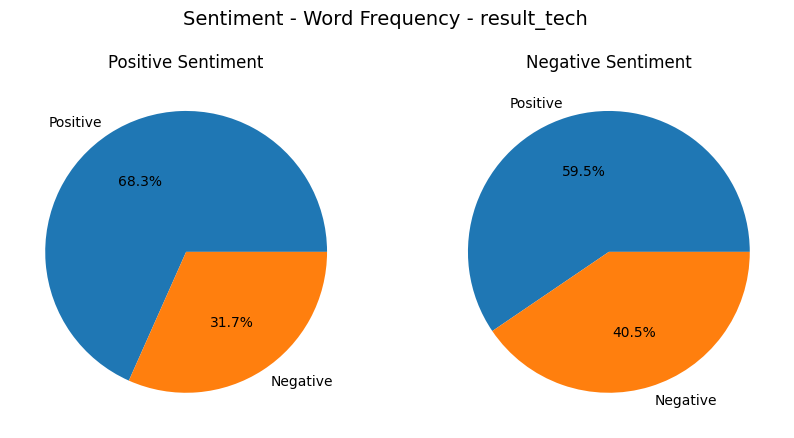

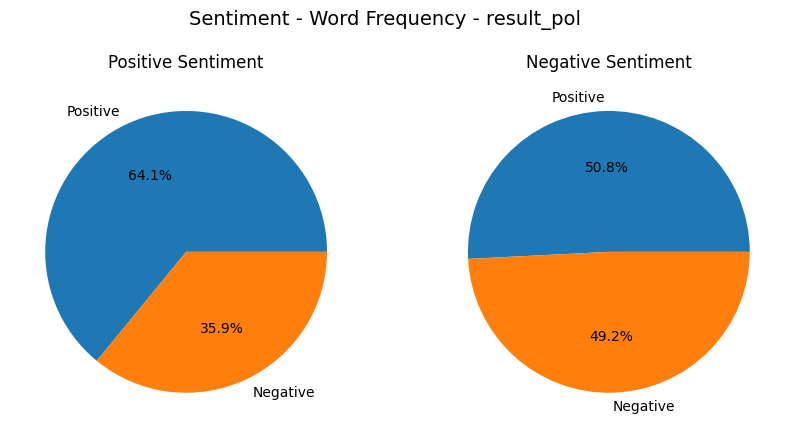

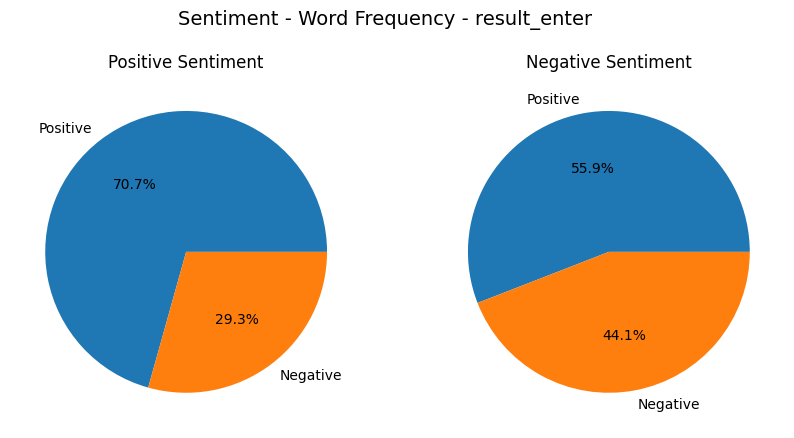

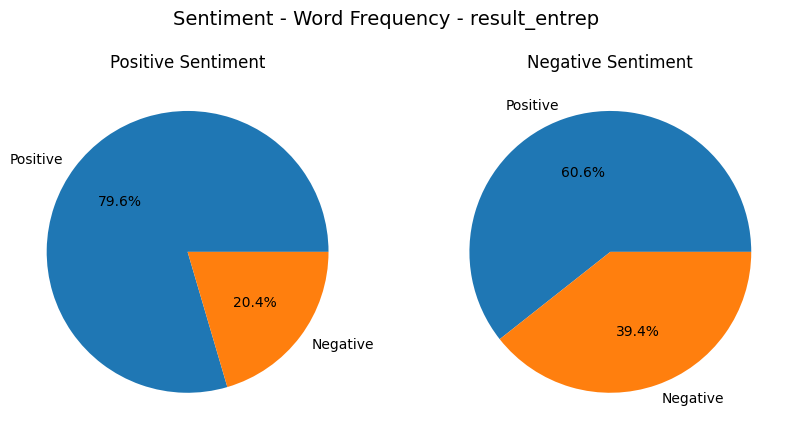

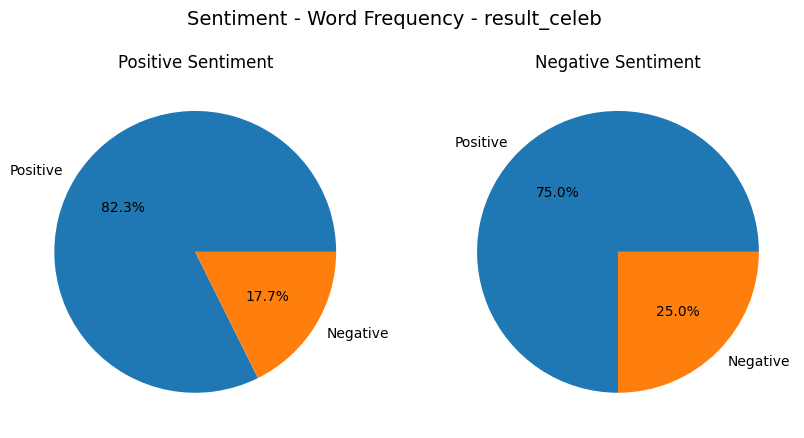

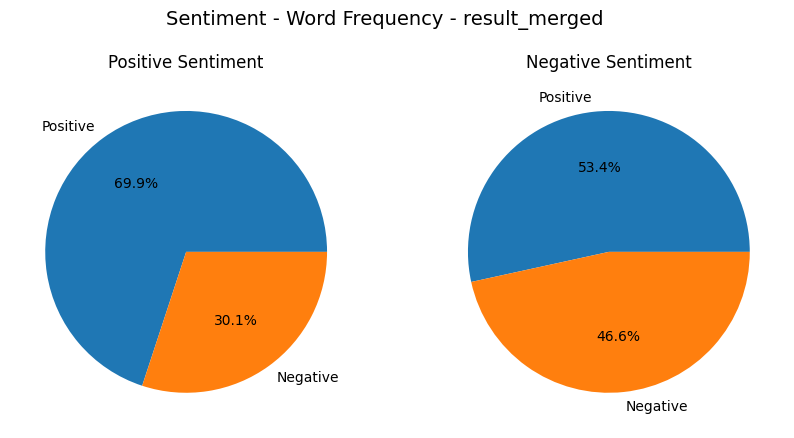

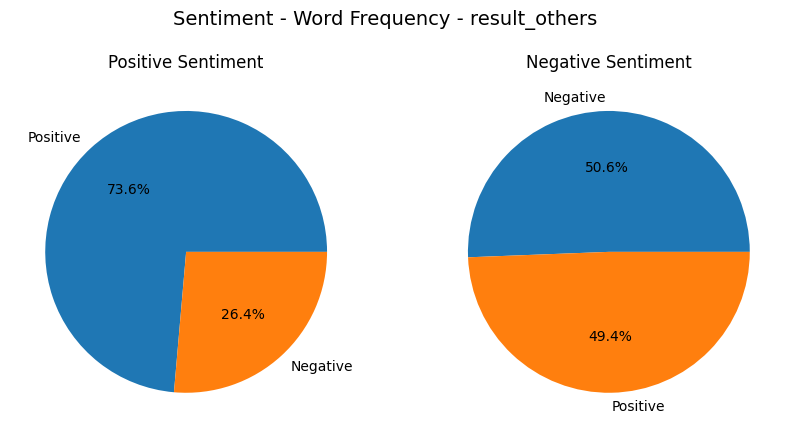

In [ ]:
import matplotlib.pyplot as plt

# List of dataframes and their names
dataframes = [result_tech, result_pol, result_enter, result_entrep, result_celeb, result_merged, result_others]
df_names = ['result_tech', 'result_pol', 'result_enter', 'result_entrep', 'result_celeb', 'result_merged', 'result_others']

# Loop over the dataframes
for i, df in enumerate(dataframes):
    # Filter the dataframe to get only the main posts with positive or negative sentiment
    main_posts_df = df[df['status'] == 'Main post']
    positive_main_posts_df = main_posts_df[main_posts_df['sentiment_label'] == 'Positive']
    negative_main_posts_df = main_posts_df[main_posts_df['sentiment_label'] == 'Negative']

    # Get a list of conversation IDs of the main posts with positive or negative sentiment
    positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
    negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

    # Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
    positive_rows_df = df[df['Conversation ID'].isin(positive_conversation_ids) & (df['status'] == 'reply')]
    negative_rows_df = df[df['Conversation ID'].isin(negative_conversation_ids) & (df['status'] == 'reply')]

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the pie chart for positive sentiment on the first subplot
    counts_positive = positive_rows_df['sentiment_label'].value_counts()
    ax1.pie(counts_positive, labels=counts_positive.index, autopct='%1.1f%%')
    ax1.set_title('Positive Sentiment')

    # Plot the pie chart for negative sentiment on the second subplot
    counts_negative = negative_rows_df['sentiment_label'].value_counts()
    ax2.pie(counts_negative, labels=counts_negative.index, autopct='%1.1f%%')
    ax2.set_title('Negative Sentiment')

    # Add a main title with the name of the dataframe
    fig.suptitle(f"Sentiment - Word Frequency - {df_names[i]}", fontsize=14)

    # Display the chart
    plt.show()


In [ ]:
main_posts_df = result_others[result_others['status'] == 'Main post']
negative_main_posts_df =main_posts_df[main_posts_df['SVM Predicted Label'] == 'Negative']
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()
negative_rows_df = result_others[result_others['Conversation ID'].isin(negative_conversation_ids)]


In [ ]:
negative_rows_df

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label
27,466,466,fedtriyahya,Antara biasiswa dan bimbang kecewa… Bagaimana dapat dibantu? https://t.co/aIaKA5O9Hq,2021-11-08 00:51:56+00:00,5288,1605,258,Twitter for iPhone,1457511168814186500,1457511168814186500,Main post,Fitness and others,Between scholarships and worrying about being disappointed... How can I be helped? https://t.co/aIaKA5O9Hq,scholarships worrying disappointed helped,"{'neg': 0.733, 'neu': 0.267, 'pos': 0.0, 'compound': -0.6705}",-0.6705,Negative,Negative
30,471,471,fedtriyahya,Cemburu buta atau overprotective atau psycho atau baran atau …apa? https://t.co/ou3Zya2NeS,2021-11-05 09:16:07+00:00,829,220,102,Twitter for iPhone,1456550888860897285,1456550888860897285,Main post,Fitness and others,Blind jealous or overprotective or psycho or crazy or…what? https://t.co/ou3Zya2NeS,blind jealous overprotective psycho crazy orwhat,"{'neg': 0.73, 'neu': 0.27, 'pos': 0.0, 'compound': -0.7964}",-0.7964,Negative,Negative
39,485,485,fedtriyahya,"Love, lust &amp; pain… https://t.co/cVY65GufR8",2021-10-28 16:46:24+00:00,3835,1538,105,Twitter for iPhone,1453765102314790919,1453765102314790919,Main post,Fitness and others,"Love, lust &amp; pain… https://t.co/cVY65GufR8",love lust pain,"{'neg': 0.388, 'neu': 0.118, 'pos': 0.494, 'compound': 0.2263}",0.2263,Positive,Negative
43,493,493,fedtriyahya,Pernahkah percutian anda menjadi tidak menarik? Apakah sebabnya…,2021-10-25 03:20:58+00:00,4568,1376,601,Twitter for iPhone,1452475242123649026,1452475242123649026,Main post,Fitness and others,Has your vacation ever turned out to be boring? What is the reason…,vacation turned boring reason,"{'neg': 0.434, 'neu': 0.566, 'pos': 0.0, 'compound': -0.3182}",-0.3182,Negative,Negative
48,504,504,fedtriyahya,Apakah keputusan paling berani yang anda buat dalam hidup setakat ini?,2021-10-17 14:23:24+00:00,8241,2879,1116,Twitter for iPhone,1449742846399967232,1449742846399967232,Main post,Fitness and others,What is the bravest decision you have made in life so far?,bravest decision life,"{'neg': 0.0, 'neu': 0.377, 'pos': 0.623, 'compound': 0.5106}",0.5106,Positive,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9422,57456,57456,sambakamundo,"@fedtriyahya Wake up this morning, wanna breath fresh air but only inhale negative energy.\n\n#JanganKanchiong",2021-07-30 01:00:19+00:00,0,0,0,Twitter for iPhone,1420912103301419014,1420739182255697924,reply,Fitness and others,"@fedtriyahya Wake up this morning, wanna breath fresh air but only inhale negative energy.\n\n#JanganKanchiong",wake morning wanna breath fresh air inhale negative energy jangankanchiong,"{'neg': 0.245, 'neu': 0.464, 'pos': 0.291, 'compound': -0.0772}",-0.0772,Negative,Negative
9423,57461,57461,IkhmalIzuan,"@fedtriyahya Netizen: July is the worst so far,fuhh\n\nAugust be like: https://t.co/iU8HoYPY8b",2021-07-30 04:07:49+00:00,16,3,0,Twitter for Android,1420959288315371520,1420739182255697924,reply,Fitness and others,"@fedtriyahya Netizen: July is the worst so far,fuhh\n\nAugust be like: https://t.co/iU8HoYPY8b",netizen july worst farfuhh august,"{'neg': 0.506, 'neu': 0.494, 'pos': 0.0, 'compound': -0.6249}",-0.6249,Negative,NaN
9424,57463,57463,whysishak,@fedtriyahya Ingat oktober je ada tragedy...,2021-07-30 05:38:18+00:00,0,0,0,Twitter for Android,1420982060466900999,1420739182255697924,reply,Fitness and others,@fedtriyahya Remember there was a tragedy in October...,remember tragedy october,"{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.6597}",-0.6597,Negative,NaN
9425,57464,57464,madilunas,@fedtriyahya ready musim tengkujuh guys..kot² datang awal..,2021-07-30 05:38:33+00:00,0,0,0,Twitter for Android,1420982122152558592,1420739182255697924,reply,Fitness and others,@fedtriyahya ready mons

In [ ]:
grouped_by_convid = result_others.groupby("Conversation ID")
grouped_by_convid_size = grouped_by_convid.size()
sorted_grouped_by_convid_size = grouped_by_convid_size.sort_values(ascending=False)
sorted_grouped_by_convid_size 


Conversation ID
1378120555245748226    189
1453896153343217665    185
1390827744267706374    181
1389910909741568003    179
1453556966102495232    176
                      ... 
1412237385463525377     11
1389546786189156353     10
1401574676523098112      7
1396037043105394691      7
1442469437764890633      7
Length: 182, dtype: int64

In [ ]:
def show_text_and_size(group):
    text = group["Text"].iloc[0]
    size = len(group)
    return f"{text} - {size} row(s)"

text_and_size = grouped_by_convid.apply(show_text_and_size)
text_and_size

Conversation ID
1349193396930269184                                                                                                                                                                                                             MCO 2.0 has begins. It’s also a perfect time to get the potholes in KL and Selangor repaired. - 23 row(s)
1361282227443806212                                                                                                                               I tried to stay away from TikTok but I think it’s a great platform for public health education especially to counter disinformation. So, here I am. https://t.co/JLiFdXZMOz - 39 row(s)
1361629068291047426                                                                                                                                                                                                                                                            Hatiku seperti PKP, Perlu Kasih dan Perhatian. - 14 r

In [ ]:
import pandas as pd

# List of dataframes and their names
dataframes = [result_tech, result_pol, result_enter, result_entrep, result_celeb, result_merged, result_others]
df_names = ['result_tech', 'result_pol', 'result_enter', 'result_entrep', 'result_celeb', 'result_merged', 'result_others']

# Loop over the dataframes
for i, df in enumerate(dataframes):
    # Filter the dataframe to get only the main posts with positive or negative sentiment
    main_posts_df = df[df['status'] == 'Main post']
    positive_main_posts_df = main_posts_df[main_posts_df['SVM Predicted Label'] == 'Positive']
    negative_main_posts_df = main_posts_df[main_posts_df['SVM Predicted Label'] == 'Negative']

    # Get a list of conversation IDs of the main posts with positive or negative sentiment
    positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
    negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

    # Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
    positive_rows_df = df[df['Conversation ID'].isin(positive_conversation_ids) & (df['status'] == 'reply')]
    negative_rows_df = df[df['Conversation ID'].isin(negative_conversation_ids) & (df['status'] == 'reply')]

    # Compute the frequency table of positive and negative sentiment labels
    positive_counts = pd.crosstab(index=positive_rows_df['SVM Predicted Label'], columns="count")
    negative_counts = pd.crosstab(index=negative_rows_df['SVM Predicted Label'], columns="count")

    # Print the frequency tables as text
    print(f"Sentiment - Word Frequency - {df_names[i]}")
    print(f"Positive Sentiment:\n{positive_counts}")
    print(f"Negative Sentiment:\n{negative_counts}")
    print("-" * 50)


Sentiment - Word Frequency - result_tech
Positive Sentiment:
col_0                count
SVM Predicted Label       
Negative                11
Positive                25
Negative Sentiment:
col_0                count
SVM Predicted Label       
Negative                 7
--------------------------------------------------
Sentiment - Word Frequency - result_pol
Positive Sentiment:
col_0                count
SVM Predicted Label       
Negative               184
Positive               305
Negative Sentiment:
col_0                count
SVM Predicted Label       
Negative               270
Positive               299
--------------------------------------------------
Sentiment - Word Frequency - result_enter
Positive Sentiment:
col_0                count
SVM Predicted Label       
Negative                77
Positive               145
Negative Sentiment:
col_0                count
SVM Predicted Label       
Negative                54
Positive                36
----------------------------------

In [ ]:
# Assuming the dataframe is named 'result_merged'

# Initialize an empty list to store the results for each main post
results = []

# Loop through each main post in the dataframe
for _, main_post in result_merged[result_merged['status'] == 'Main post'].iterrows():
    # Get the Conversation ID of the main post
    conversation_id = main_post['Conversation ID']
    
    # Filter the dataframe to get only the replies to the main post (based on Conversation ID)
    replies_df = result_merged[result_merged['Conversation ID'] == conversation_id]
    
    # Count the number of positive and negative sentiment replies
    positive_replies_count = len(replies_df[replies_df['SVM Predicted Label'] == 'Positive'])
    negative_replies_count = len(replies_df[replies_df['SVM Predicted Label'] == 'Negative'])
    
    # Store the results in a dictionary
    result = {
        'Conversation ID': conversation_id,
        'Positive Replies Count': positive_replies_count,
        'Negative Replies Count': negative_replies_count
    }
    
    # Append the dictionary to the results list
    results.append(result)

# Convert the results list to a dataframe
results_df = pd.DataFrame(results)

# Print the results dataframe
print(results_df)


          Conversation ID  Positive Replies Count  Negative Replies Count
0     1475002598327394306                       2                       2
1     1472567309940129792                       8                       1
2     1471883452324597762                       4                       2
3     1470709477196193796                       2                       0
4     1469713235125309445                       2                       0
...                   ...                     ...                     ...
1015  1454469970226647047                       7                       3
1016  1452138681255428096                       4                       6
1017  1451497043394846721                       1                       1
1018  1449752243511574533                       4                       4
1019  1443804472237387787                       2                       2

[1020 rows x 3 columns]


# POLITIC SECTION

In [ ]:
# Convert the "Date Created" column to datetime format
result_pol["Date Created"] = pd.to_datetime(result_pol["Date Created"])

# Create a new column for the month of creation
result_pol["Month"] = result_pol["Date Created"].dt.month

# Select the rows that meet the conditions
selected_rows = result_pol.loc[(result_pol["status"] == "Main post") & (result_pol["Number of Replies"] >= 200)]

# Print the selected rows
print(selected_rows)

     Unnamed: 0.1  Unnamed: 0      Username  \
9             939         939      Khairykj   
15            948         948      Khairykj   
18            952         952      Khairykj   
30            968         968      Khairykj   
32            970         970      Khairykj   
..            ...         ...           ...   
445          1731        1731      Khairykj   
447          1733        1733      Khairykj   
458          1752        1752  anwaribrahim   
463          1758        1758  anwaribrahim   
467          1764        1764    SyedSaddiq   

                                                                                                                                                                                                                                                                                                                 Text  \
9    Satu ciri baharu MySJ diperkenalkan dalam update terkini. ‘MySJ Trace’ menggunakan Bluetooth untuk mengesan kontak ra

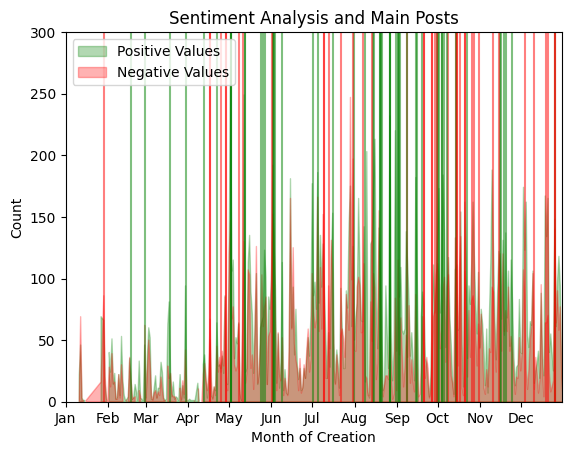

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the "Date Created" column to datetime format
result_pol["Date Created"] = pd.to_datetime(result_pol["Date Created"])

# Group the data by day of creation and sentiment label
grouped_data = result_pol.groupby([result_pol["Date Created"].dt.date, "sentiment_label"]).count()["Text"].unstack()

# Create the figure and axes objects
fig, ax = plt.subplots()

# Create the area charts
ax.fill_between(grouped_data.index, grouped_data["Positive"], color='green', alpha=0.3)
ax.fill_between(grouped_data.index, grouped_data["Negative"], color='red', alpha=0.3)

# Set the x-axis label and tick marks
ax.set_xlabel("Month of Creation")
ax.set_xticks(pd.date_range(start=pd.Timestamp('2021-01-01'), end=pd.Timestamp('2021-12-01'), freq='MS'))

# Set the limits of the x-axis to only show 2021
ax.set_xlim(pd.Timestamp('2021-01-01'), pd.Timestamp('2021-12-31'))

# Set the locator and formatter for the x-axis ticks
locator = MonthLocator(bymonthday=1)
formatter = DateFormatter("%b")
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)

# Set the y-axis label and limits
ax.set_ylabel("Count")
ax.set_ylim(0, 300)

# Add a legend
ax.legend(["Positive Values", "Negative Values"])

# Plot vertical lines at each x position, with color based on sentiment label
for i, x_val in enumerate(selected_rows["Date Created"]):
    if selected_rows.iloc[i]["sentiment_label"] == "Positive":
        ax.axvline(x_val, color='green', alpha=0.5)
    elif selected_rows.iloc[i]["sentiment_label"] == "Negative":
        ax.axvline(x_val, color='red', alpha=0.5)
    else:
        ax.axvline(x_val, color='gray', alpha=0.5)

# Set the title
ax.set_title("Sentiment Analysis and Main Posts")

# Show the plot
plt.show()


In [ ]:
# Filter the data for the specified criteria
filtered_data = result_pol[(result_pol["status"] == "Main post") & (result_pol["Username"] == "anwaribrahim")]

# Get a list of unique conversation IDs
conv_ids = filtered_data["Conversation ID"].unique().tolist()

# Filter the original data based on the conversation IDs
filtered_data = result_pol[(result_pol['Conversation ID'].isin(conv_ids)) & (result_pol["status"] == "reply")]
filtered_data

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month
25963,134548,134548,MohamadYusofBi6,@anwaribrahim Moga Allah jauhi penyakit yg d hidapi oleh Dato M. Nasir ini.,2021-12-13 11:41:51+00:00,2,0,0,Twitter for Android,1470358299962863618,1470357510951366658,reply,Politics,@anwaribrahim May God keep away the illness that Dato M. Nasir is suffering from.,god illness dato nasir suffering,"{'neg': 0.586, 'neu': 0.202, 'pos': 0.212, 'compound': -0.5719}",-0.5719,Negative,NaN,12
25964,134550,134550,Aamer_Aamar,@anwaribrahim Semoga sifu M. Nasir mengikuti jejak langkah Afdlin sertai PKR!,2021-12-13 12:36:50+00:00,1,0,0,Twitter for iPhone,1470372138762715136,1470357510951366658,reply,Politics,@anwaribrahim May sifu M. Nasir follow Afdlin's footsteps and join PKR!,sifu nasir follow afdlins footsteps join pkr,"{'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.296}",0.2960,Positive,Positive,12
25965,134551,134551,AmelinaZ95,@anwaribrahim Semoga cpt sembuh sifu Dato.M.Nasir,2021-12-13 13:34:35+00:00,3,0,0,Twitter for Android,1470386671036207106,1470357510951366658,reply,Politics,@anwaribrahim Hope you get well soon Sifu Dato.M.Nasir,hope sifu datomnasir,"{'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}",0.4404,Positive,NaN,12
25966,134555,134555,jamilahkatani,@anwaribrahim Semoga Allah beri kesembuhan yg tiada sakit nya selepas itu. Aamiin,2021-12-13 14:50:35+00:00,2,0,0,Twitter for Android,1470405796190031873,1470357510951366658,reply,Politics,@anwaribrahim May God grant him a cure without pain after that. Amen,god grant cure pain amen,"{'neg': 0.333, 'neu': 0.202, 'pos': 0.465, 'compound': 0.0772}",0.0772,Positive,NaN,12
25967,134558,134558,MOHDFAUZIBINSA3,@anwaribrahim Didoakan semoga Dato Sifu cepat sembuh,2021-12-13 15:51:12+00:00,1,0,0,Twitter for Android,1470421052161282052,1470357510951366658,reply,Politics,@anwaribrahim Praying for a speedy recovery for Dato Sifu,praying speedy recovery dato sifu,"{'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.3612}",0.3612,Positive,Positive,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30382,142454,142454,RosliIs55293687,"@anwaribrahim Sinar sudah jelas kelihatan kerana kita kini berada dipenghujung terowong, perlukan sedikit kesabaran dengan pelbagai gangguan nakal yg tentunya akan berakhir jua. Yakinlah kita akan menang kerana sebahagian besar rakyat memberikan sokongan padu setelah ada kesedaran tersendiri",2021-07-05 05:13:52+00:00,1,0,0,Twitter for Android,1411916214708760576,1411604336661065732,reply,Politics,"@anwaribrahim The light is clearly visible because we are now at the end of the tunnel, we need a little patience with various mischievous disturbances that will surely end anyway. Be sure that we will win because the majority of the people give strong support after having their own awareness",light visible tunnel patience mischievous disturbances surely win majority strong support awareness,"{'neg': 0.104, 'neu': 0.346, 'pos': 0.55, 'compound': 0.8834}",0.8834,Positive,NaN,7
30383,142456,142456,yousri_tahir,@anwaribrahim Modal politik murah main ayat tu...,2021-07-05 07:47:17+00:00,0,0,0,Twitter for iPhone,1411954825441406979,1411604336661065732,reply,Politics,@anwaribrahim Political capital is cheap playing that sentence...,political capital cheap playing sentence,"{'neg': 0.0, 'neu': 0.492, 'pos': 0.508, 'compound': 0.2732}",0.2732,Positive,NaN,7
30384,142457,142457,rahim_rohayu,"@anwaribrahim xperlu maaf Yb , abaikan langau2 lembu2 kaldai2 tersebut",2021-07-05 09:24:45+00:00,0,0,0,Twitter for Android,1411979349989871618,1411604336661065732,reply,Politics,"@anwaribrahim xperlu sorry sir, ignore the locusts, cows, donkeys",xperlu ignore locusts cows donkeys,"{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.36

In [ ]:
import pandas as pd

# Filter the data for the specified criteria
filtered_data = result_pol[(result_pol["status"] == "Main post") & (result_pol["Username"] == "anwaribrahim") & (result_pol["Date Created"].dt.date > pd.to_datetime('2021-04-10').date())]

# Get the first row after April 10th, 2021
filtered_data = filtered_data.sort_values("Date Created", ascending=True).iloc[0]

# Get the conversation ID of the first row
conv_id = filtered_data["Conversation ID"]

# Filter the original data based on the conversation ID
filtered_data = result_pol[(result_pol['Conversation ID'] == conv_id)]
filtered_data


,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month
331,1543,1543,anwaribrahim,"Maaf jika ada teman-teman yang kurang senang. Saya tidak mempunyai sebarang niat untuk ‘hijack’, selain sekadar menyatakan dukungan yang konsisten atas ekspresi menentang pemerintah yang gagal membela rakyat. https://t.co/UCZ4zyV7g3",2021-07-04 08:34:34+00:00,3470,1506,150,Twitter for iPhone,1411604336661065732,1411604336661065732,Main post,Politics,"Sorry if there are friends who are not happy. I do not have any intention to 'hijack', other than simply expressing my consistent support for the expression against the government that fails to defend the people. https://t.co/UCZ4zyV7g3",friends happy intention hijack simply expressing consistent support expression government fails defend,"{'neg': 0.131, 'neu': 0.423, 'pos': 0.446, 'compound': 0.7717}",0.7717,Positive,Positive,7
465,1760,1760,anwaribrahim,"Maaf jika ada teman-teman yang kurang senang. Saya tidak mempunyai sebarang niat untuk ‘hijack’, selain sekadar menyatakan dukungan yang konsisten atas ekspresi menentang pemerintah yang gagal membela rakyat.",2021-07-04 08:34:34+00:00,3470,1506,150,Twitter for iPhone,1411604336661065732,1411604336661065732,Main post,Politics,"Sorry if there are friends who are not happy. I do not have any intention to 'hijack', other than simply expressing my consistent support for the expression against the government that fails to defend the people.",friends happy intention hijack simply expressing consistent support expression government fails defend,"{'neg': 0.131, 'neu': 0.423, 'pos': 0.446, 'compound': 0.7717}",0.7717,Positive,NaN,7
30316,142346,142346,seeetian,"@anwaribrahim YB, saya rasa ada segelintir rakyat yang tidak faham apa tujuan sebenar kempen ini. Saya harap YB terus berjuang untuk rakyat. 💪🏻🤜🏻🤛🏻",2021-07-04 08:35:38+00:00,52,1,0,Twitter for iPhone,1411604603288780801,1411604336661065732,reply,Politics,"@anwaribrahim YB, I think there are a few people who do not understand the real purpose of this campaign. I hope YB continues to fight for the people. 💪🏻🤜🏻🤛🏻",understand real purpose campaign hope continues fight,"{'neg': 0.179, 'neu': 0.621, 'pos': 0.2, 'compound': 0.0772}",0.0772,Positive,NaN,7
30317,142347,142347,ams1610,"@anwaribrahim X de la YB, ramai orng bersikap selective je… @anwaribrahim x boleh, orng lain boleh.. cenggitu.. harap bertabah..🤗",2021-07-04 08:36:55+00:00,51,2,2,Twitter for iPhone,1411604926266941440,1411604336661065732,reply,Politics,"@anwaribrahim X de la YB, many people are selective... @anwaribrahim x can't, others can.. that's it.. hope you persevere..🤗",selective hope persevere,"{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.4404}",0.4404,Positive,NaN,7
30318,142349,142349,iqmalhisham,@anwaribrahim Istiqamah dalam perjuangan. Yang maha menilai adalah Allah swt bukan manusia.,2021-07-04 08:38:13+00:00,4,1,0,Twitter Web App,1411605254337032193,1411604336661065732,reply,Politics,"@anwaribrahim Istiqamah in the struggle. The almighty judge is God, not humans.",istiqamah struggle almighty judge god humans,"{'neg': 0.274, 'neu': 0.476, 'pos': 0.25, 'compound': -0.0516}",-0.0516,Negative,Positive,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30382,142454,142454,RosliIs55293687,"@anwaribrahim Sinar sudah jelas kelihatan kerana kita kini berada dipenghujung terowong, perlukan sedikit kesabaran dengan pelbagai gangguan nakal yg tentunya akan berakhir jua. Yakinlah kita akan menang kerana sebahagian besar rakyat memberikan sokongan padu setelah ada kesedaran tersendiri",2021-07-05 05:13:52+00:00,1,0,0,Twitter for Android,1411916214708760576,1411604336661065732,reply,Politics,"@anwaribrahim The light is clearly visible because we are now at the end of the tunnel, we need a little pati

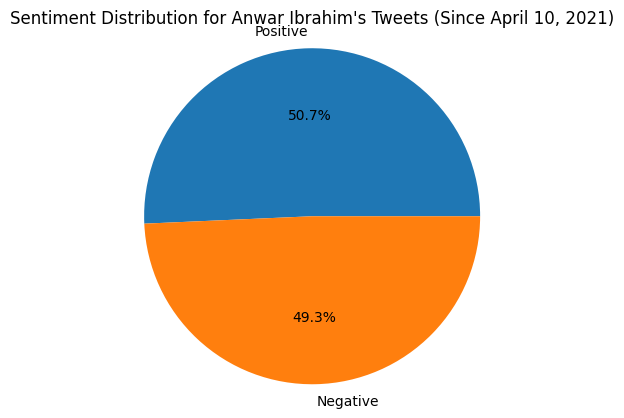

In [ ]:
import matplotlib.pyplot as plt


# Filter the data for the specified criteria
filtered_data = result_pol[(result_pol["status"] == "Main post") & (result_pol["Username"] == "anwaribrahim") & (result_pol["Date Created"].dt.date > pd.to_datetime('2021-04-29').date())]
main = result_pol[(result_pol["status"] == "Main post") & (result_pol["Username"] == "anwaribrahim") & (result_pol["Date Created"].dt.date > pd.to_datetime('2021-04-29').date())]
main_sorted = main.sort_values(by='Date Created', ascending=True)

# Get the conversation ID of the first row
conv_id = filtered_data.sort_values("Date Created", ascending=True).iloc[0]["Conversation ID"]
#
# Filter the original data based on the conversation ID
filtered_data = result_pol[result_pol['Conversation ID'] == conv_id]

# Remove rows with "Main post" status
filtered_data = filtered_data[filtered_data["status"] != "Main post"]

# Create a pie chart of sentiment labels
sentiment_counts = filtered_data["sentiment_label"].value_counts()
labels = sentiment_counts.index.tolist()
sizes = sentiment_counts.values.tolist()
plt.pie(sizes, labels=labels, autopct='%1.1f%%')
plt.title("Sentiment Distribution for Anwar Ibrahim's Tweets (Since April 10, 2021)")
plt.axis('equal')
plt.show()

In [ ]:
main_sorted

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month
465,1760,1760,anwaribrahim,"Maaf jika ada teman-teman yang kurang senang. Saya tidak mempunyai sebarang niat untuk ‘hijack’, selain sekadar menyatakan dukungan yang konsisten atas ekspresi menentang pemerintah yang gagal membela rakyat.",2021-07-04 08:34:34+00:00,3470,1506,150,Twitter for iPhone,1411604336661065732,1411604336661065732,Main post,Politics,"Sorry if there are friends who are not happy. I do not have any intention to 'hijack', other than simply expressing my consistent support for the expression against the government that fails to defend the people.",friends happy intention hijack simply expressing consistent support expression government fails defend,"{'neg': 0.131, 'neu': 0.423, 'pos': 0.446, 'compound': 0.7717}",0.7717,Positive,NaN,7
331,1543,1543,anwaribrahim,"Maaf jika ada teman-teman yang kurang senang. Saya tidak mempunyai sebarang niat untuk ‘hijack’, selain sekadar menyatakan dukungan yang konsisten atas ekspresi menentang pemerintah yang gagal membela rakyat. https://t.co/UCZ4zyV7g3",2021-07-04 08:34:34+00:00,3470,1506,150,Twitter for iPhone,1411604336661065732,1411604336661065732,Main post,Politics,"Sorry if there are friends who are not happy. I do not have any intention to 'hijack', other than simply expressing my consistent support for the expression against the government that fails to defend the people. https://t.co/UCZ4zyV7g3",friends happy intention hijack simply expressing consistent support expression government fails defend,"{'neg': 0.131, 'neu': 0.423, 'pos': 0.446, 'compound': 0.7717}",0.7717,Positive,Positive,7
330,1542,1542,anwaribrahim,Innalillahi wa inna ilaihi rajiun. \n\nSaya dan keluarga turut bersedih atas wafatnya Rachmawati Sukarnoputri. https://t.co/MCcqTS4kEw,2021-07-04 09:25:15+00:00,748,144,52,Twitter for iPhone,1411617088519561216,1411617088519561216,Main post,Politics,Innalillahi wa inna ilaihi rajiun.\n\nMy family and I are saddened by the death of Rachmawati Sukarnoputri. https://t.co/MCcqTS4kEw,innalillahi inna ilaihi rajiun family saddened death rachmawati sukarnoputri,"{'neg': 0.51, 'neu': 0.49, 'pos': 0.0, 'compound': -0.8074}",-0.8074,Negative,NaN,7
329,1541,1541,anwaribrahim,Luang masa hiburkan cucu. \n\nNampak awan mendung di luar teringat lagu ini yang mengajar anak-anak tentang alam dan hujan. https://t.co/0BKlEfWtab,2021-07-05 12:26:10+00:00,1772,271,81,Twitter for iPhone,1412025005446103040,1412025005446103040,Main post,Politics,Spend time entertaining grandchildren.\n\nSeeing cloudy clouds outside reminded me of this song that teaches children about nature and rain. https://t.co/0BKlEfWtab,spend time entertaining grandchildren cloudy clouds reminded song teaches children nature rain,"{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}",0.4404,Positive,NaN,7
328,1539,1539,anwaribrahim,"Kita sedia maklum Perdana Menteri Tan Sri Mahiaddin Yassin masih dirawat di rumah sakit. Sebagai rakan, maka saya dari pihak keluarga turut mendoakan agar beliau kembali sihat walafiat. Syafakallah.",2021-07-06 16:38:43+00:00,2591,614,88,Twitter for iPhone,1412450951802232838,1412450951802232838,Main post,Politics,"We are aware that Prime Minister Tan Sri Mahiaddin Yassin is still being treated in hospital. As a friend, I from the family also pray for his recovery. Syafakallah",aware prime minister tan sri mahiaddin yassin treated hospital friend family pray recovery syafakallah,"{'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.6705}",0.6705,Positive,NaN,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,1456,1456,anwaribrahim,"Selepas Kuching, saya di Miri bagi meluncur dan memberi semangat kepada jentera KEADILAN bagi menghadapi pilihanraya negeri akan datang. \n\nKEADILA

# ENGAGEMENT RATE

In [ ]:
user_categories = {
    'Entertainer': ['sofyank96', 'LuqmanPodolski', 'hazemanhuzir','CeddyOrNot', 'brgsjks', 'Azfarheri', 'Matluthfi90' ],
    'Politics': ['chairman_GLC', 'Khairykj', 'MuhyiddinYassin', 'limlipeng', 'kuasasiswa', 'NajibRazak', 'n_izzah', 'anwaribrahim', 'SyedSaddiq'],
    'Technology': ['XavierNaxa', 'fazlihalimmedia', 'thefaizzainal','aribismail','acaiijawe' ],
    'Celebrity': ['altimet', 'AfikryAibrahim', 'yunamusic', 'CTNurhaliza11', 'AaronDwiAziz', 'missfazura','Nor4Danish','Shaheizy_Sam' ],
    'Entrepreneur': ['FezzaHussin', 'adibhazlami', 'afiqnazary','AmirulMu_min', 'richardker', 'IZZTAZWAR', 'khairulaming'],
    'Fitness and others': ['najibfazail', 'fedtriyahya', 'Pandelela_R', 'ijaicool', "DrAmalinaBakri"]
}

In [ ]:
import tweepy
import pandas as pd

#Authenticate with Twitter API using OAuth 1.0a authentication
auth = tweepy.OAuthHandler(
"oSvfqpSUySTGosgcgRJqZnJv6",
"44BNZrpl4BbxFdHdlmGLcB0cqgylVL9D7jvYadWjjuENHkzVz1"
)
auth.set_access_token(
"1525783737371226114-CEnQlvbAIJEZpx0BCIS2dvBtlQjd8q",
"JcwX3rWjY0pk1XIdyEydNSQVLzts5Q80j4LWljI22llRc"
)

#Create the API object
api = tweepy.API(auth)

#Define a list of dictionaries to store the data
data = []

#Loop over the user_categories dictionary
for category, usernames in user_categories.items():
# Loop over the usernames in the category
    for username in usernames:
# Use API.get_user() method to get information about the user
        user = api.get_user(screen_name=username)

 # Retrieve the number of followers from the user object
        followers_count = user.followers_count
    
    # Add the data to the list of dictionaries
        data.append({
        'Category': category,
        'Username': username,
        'followers_count': followers_count
    })

#Create a DataFrame from the list of dictionaries
df = pd.DataFrame(data)

#Print the DataFrame
print(df)

              Category         Username  followers_count
0          Entertainer        sofyank96           165963
1          Entertainer   LuqmanPodolski           373473
2          Entertainer     hazemanhuzir           170309
3          Entertainer       CeddyOrNot            93238
4          Entertainer          brgsjks           601568
5          Entertainer        Azfarheri          1600182
6          Entertainer      Matluthfi90          1148066
7             Politics     chairman_GLC            43600
8             Politics         Khairykj          2904857
9             Politics  MuhyiddinYassin          1285412
10            Politics        limlipeng            28475
11            Politics       kuasasiswa           278523
12            Politics       NajibRazak          4159300
13            Politics          n_izzah          1404504
14            Politics     anwaribrahim          1814497
15            Politics       SyedSaddiq          1433780
16          Technology       Xa

In [ ]:
# Sort the DataFrame based on the 'followers_count' column in descending order
df_sorted = df.sort_values(by='followers_count', ascending=False)

# Print the sorted DataFrame
print(df_sorted)


              Category         Username  followers_count
12            Politics       NajibRazak          4159300
8             Politics         Khairykj          2904857
24           Celebrity    CTNurhaliza11          2456196
23           Celebrity        yunamusic          2421637
28           Celebrity     Shaheizy_Sam          2162722
25           Celebrity     AaronDwiAziz          1988861
27           Celebrity       Nor4Danish          1930573
14            Politics     anwaribrahim          1814497
26           Celebrity       missfazura          1807329
5          Entertainer        Azfarheri          1600182
15            Politics       SyedSaddiq          1433780
35        Entrepreneur     khairulaming          1431849
13            Politics          n_izzah          1404504
9             Politics  MuhyiddinYassin          1285412
6          Entertainer      Matluthfi90          1148066
40  Fitness and others   DrAmalinaBakri           822443
4          Entertainer         

# ENGAGEMENT RATE POLITIC

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_pol['Number of Likes'] + result_pol['Number of Retweet'] + result_pol['Number of Replies']) / df['followers_count']
result_pol.loc[result_pol['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_pol['followers_count'] = result_pol['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_pol.loc[result_pol['status'] == 'Main post', 'engagement_rate'] = (result_pol['Number of Likes'] + result_pol['Number of Retweet'] + result_pol['Number of Replies']) / result_pol['followers_count']


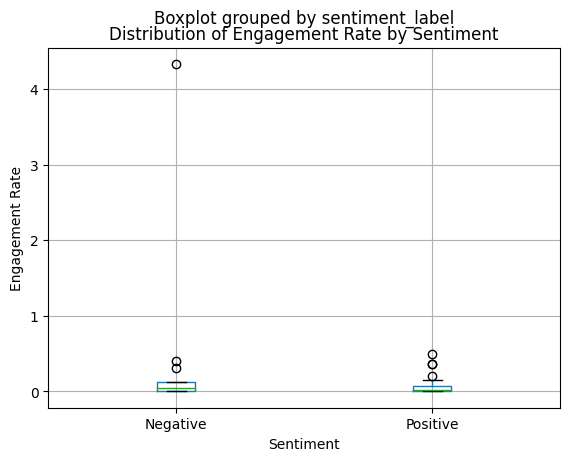

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_pol[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


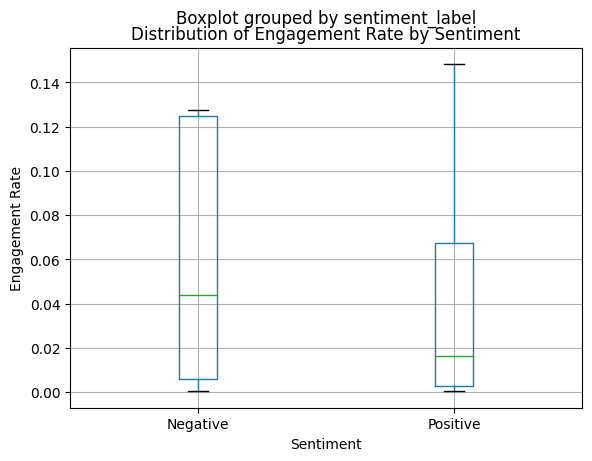

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_pol[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] 
                                + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month,engagement_rate,followers_count_x,Category_y,followers_count_y
31,967,967,Khairykj,Kadar kemasukkan hospital sudah meningkat. Kebanyakan kes adalah warga emas/golongan komorbid yang dijangkiti kontak rapat (ahli keluarga) yang membawa balik virus SARS-CoV2 ke rumah. Pakai pelitup muka &amp; elak tempat yang sesak. Dapatkan booster bila diberi temujanji.,2021-11-22 00:40:53+00:00,9276,9911,147,Twitter for iPhone,1462581816888475648,...,hospital admission rates increased cases elderlycomorbid group infected close contacts family members bring sarscov virus wear face mask avoid crowded places booster appointment,"{'neg': 0.196, 'neu': 0.727, 'pos': 0.076, 'compound': -0.5106}",-0.5106,Negative,Negative,11,4.332064,2904857.0,Politics,2904857
34,970,970,Khairykj,"For Sinovac recipients, a Pfizer booster is the best choice to increase your level of protection. Many who already qualify for the booster are waiting for a Sinovac booster to be approved. Don’t wait. Take the Pfizer booster that is being offered. It’s very effective &amp; safe. https://t.co/h89ZbbaKVS",2021-11-16 04:53:07+00:00,5038,4001,268,Twitter for iPhone,1460470967105245184,...,sinovac recipients pfizer booster choice increase level protection qualify booster waiting sinovac booster approved dont wait pfizer booster offered effective safe,"{'neg': 0.0, 'neu': 0.605, 'pos': 0.395, 'compound': 0.8779}",0.8779,Positive,Positive,11,0.489919,2904857.0,Politics,2904857
7,1688,1688,chairman_GLC,"Disebabkan Rina Harun, rakyat Malaysia terus dibutakan dengan tindakan Tengku Zafrul ni. Korang tak rasa apa-apa ke bila dia suruh mangsa banjir amik loan ni? Dah la miskin, harta benda semua habis. Kerajaan suruh pulak amik loan. Tak ke bangsat?",2021-12-27 06:15:28+00:00,6676,10794,50,TweetDeck,1475349594846359554,...,rina harun malaysians continue blinded tengku zafruls actions dont feel tells flood victims loan poor possessions government told loan bastard,"{'neg': 0.344, 'neu': 0.656, 'pos': 0.0, 'compound': -0.836}",-0.8360,Negative,NaN,12,0.401835,43600.0,Politics,43600
32,968,968,Khairykj,"Why a shorter booster interval for Sinovac (3 months) vs Pfizer/AZ (6 months)? While Sinovac is effective, there is evidence it’s effectiveness wanes sooner. This is Cat 4 &amp; 5 weekly admission into Hosp Sg Buloh. That’s why we want you to take whatever booster is on offer. https://t.co/Fo1FVgwXpL",2021-11-20 01:07:03+00:00,2408,1812,201,Twitter for iPhone,1461863629133803525,...,shorter booster interval sinovac months pfizeraz months sinovac effective evidence effectiveness wanes sooner cat weekly admission hosp sg buloh booster offer,"{'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4767}",0.4767,Positive,NaN,11,0.368632,2904857.0,Politics,2904857
19,951,951,Khairykj,"Malaysia is sending 559,200 doses of the AZ vaacine to our friends in Bangladesh and 283,400 doses of the AZ vaccine to our friends in Laos. \n\nThe Omicron variant has highlighted that no one is safe until everyone is safe. https://t.co/VnKKtKj51U",2021-12-06 09:52:40+00:00,3099,1090,100,Twitter for iPad,1467794110610165766,...,sending doses vaacine friends bangladesh doses vaccine friends laos omicron variant highlighted safe safe,"{'neg': 0.0, 'neu': 0.478, 'pos': 0.522, 'compound': 0.9001}",0.9001,Positive,NaN,12,0.368281,2904857.0,Politics,2904857
20,952,952,Khairykj,Malaysians going to countries like the UK should not follow the UK’s lackadaisical attitude towards mask wearing. Mask up like you’re in Malaysia.,2021-12-04 07:28:51+00:00,16191,7442,201,Twitter for iPhone,1467033141252530177,...,malaysians countries follow uks lackadaisical attitude mask wearing mask,"{'neg': 0.224, 'neu': 0.776, 'pos': 0.0, 'compound': -0.3818}",-0.3818,Negative,NaN,12,0.310618,2904857.0,Politics,2904857
30,966

# ENGAGEMENT RATE ENTERTAINER

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_enter['Number of Likes'] +result_enter['Number of Retweet'] +result_enter['Number of Replies']) / df['followers_count']
result_enter.loc[result_enter['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_enter['followers_count'] =result_enter['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_enter.loc[result_enter['status'] == 'Main post', 'engagement_rate'] = (result_enter['Number of Likes'] + result_enter['Number of Retweet'] + result_enter['Number of Replies']) / result_enter['followers_count']


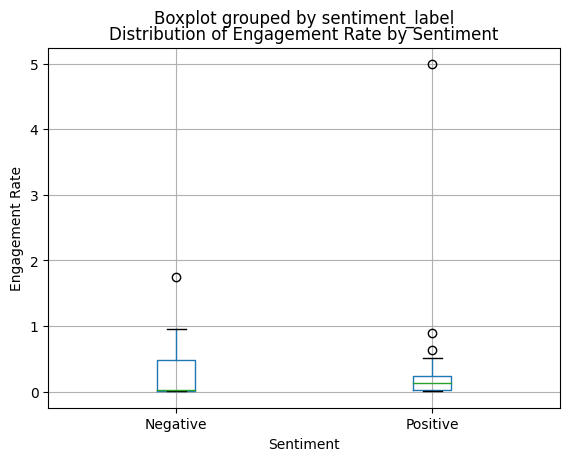

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_enter[(result_enter['status'] == 'Main post') & (result_enter['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


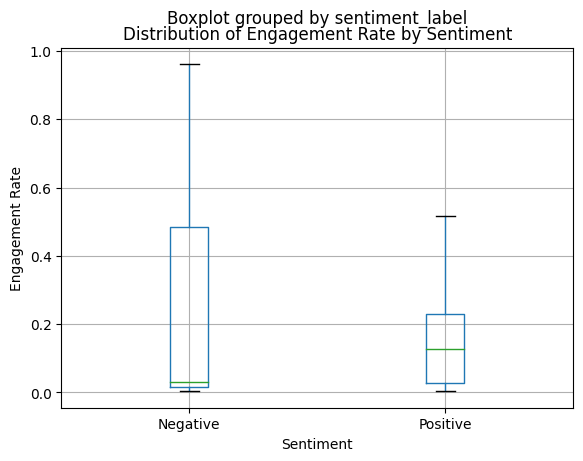

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_enter[(result_enter['status'] == 'Main post') & (result_enter['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
31,711,711,hazemanhuzir,"Ternyata di zaman ini, nilai imej itu lebih kuat daripada nilai kebenaran. Kalau orang lain dah kena jatuh hukum dah ni. No need siasatan.",2021-09-24 04:49:54+00:00,14902,7312,69,Twitter for Android,1441263600622968837,...,"It turns out that in this day and age, the value of the image is stronger than the value of the truth. If other people have already fallen under the law, this is it. No need to investigate.",turns day age image stronger truth fallen law investigate,"{'neg': 0.174, 'neu': 0.486, 'pos': 0.34, 'compound': 0.34}",0.3400,Positive,NaN,4.992830,170309.0,Entertainer,170309
29,707,707,hazemanhuzir,"Guys, jangan crash diet macam aku please. Rosak badan.\n\nDoctor diagnose badan aku tengah on ""survival mode"".\n\nMeaning, body tengah malnourished. So once kau makan, body kau terus store as fat and tak burn. Metabolic rate, drop.\n\nImagine kau berlapar, tapi makin gemuk.",2021-12-04 04:21:29+00:00,16872,8737,81,Twitter for Android,1466985988933107712,...,"Guys, don't crash diet like me please. Broken body.\n\nThe doctor diagnosed my body was on ""survival mode"".\n\nMeaning, the body is malnourished. So once you eat, your body continues to store fat and doesn't burn. Metabolic rate, drop.\n\nImagine you are hungry, but getting fatter.",guys crash diet broken body doctor diagnosed body survival mode meaning body malnourished eat body continues store fat burn metabolic rate drop imagine hungry fatter,"{'neg': 0.264, 'neu': 0.736, 'pos': 0.0, 'compound': -0.7845}",-0.7845,Negative,NaN,1.749047,170309.0,Entertainer,170309
34,716,716,hazemanhuzir,Sofa rumah aku dah berlendut siap berbentuk bontot https://t.co/drYP63id7s,2021-08-04 07:21:44+00:00,10796,7401,68,Twitter for Android,1422820030870220806,...,The sofa at my house is already shriveled up in the shape of an ass https://t.co/drYP63id7s,sofa house shriveled shape ass,"{'neg': 0.467, 'neu': 0.533, 'pos': 0.0, 'compound': -0.5423}",-0.5423,Negative,NaN,0.961468,170309.0,Entertainer,170309
32,713,713,hazemanhuzir,"Muncul pulak puak pRo-cHoiCe.\nKatanya not antivacs, but chose not to take sebab (isi tempat kosong). Kang aku tanya why choose to be stupid, kang marah.",2021-08-21 13:07:05+00:00,6306,4567,76,Twitter for Android,1429067533601042441,...,"The pRo-choiCe faction appeared.\nHe said not antivacs, but chose not to take because (fill in the blank). I asked why you choose to be stupid, you are angry.",prochoice faction appeared antivacs chose blank asked choose stupid angry,"{'neg': 0.456, 'neu': 0.544, 'pos': 0.0, 'compound': -0.7717}",-0.7717,Negative,NaN,0.912949,170309.0,Entertainer,170309
30,710,710,hazemanhuzir,"Assalamualaikum guys, just nak bagitau, saya dah ready nak adopt a baby.",2021-11-20 14:32:46+00:00,6548,865,90,Twitter for Android,1462066390630764546,...,"Assalamualaikum guys, just wanted to let you know, I'm ready to adopt a baby.",assalamualaikum guys wanted ready adopt baby,"{'neg': 0.0, 'neu': 0.488, 'pos': 0.512, 'compound': 0.4939}",0.4939,Positive,NaN,0.892789,170309.0,Entertainer,170309
33,715,715,hazemanhuzir,"Kenapa perkara basic sense macam ni boleh terlepas? Sebab hidup berlatarkan views, tapi malas berfikir. https://t.co/bYI3xX22CP",2021-08-10 03:16:16+00:00,17077,13446,80,Twitter for Android,1424932584400715787,...,"Why can basic sense things like this be missed? Because life is based on views, but lazy to think. https://t.co/bYI3xX22CP",basic sense things missed life based views lazy,"{'neg': 0.439, 'neu': 0.561, 'pos': 0.0, 'compound': -0.5719}",-0.5719,Negative,NaN,0.651294,170309.0,Entertainer,170309
0,661,661,sofyank96,Projek paling susah dan juga seronok buat tahun ini ✨\n\nShooting : 3 days\nEditing : 1 month and 15 day

# ENGAGEMENT RATE ENTREPRENUER

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_entrep['Number of Likes'] +result_entrep['Number of Retweet'] + result_entrep['Number of Replies']) / df['followers_count']
result_entrep.loc[result_entrep['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_entrep['followers_count'] = result_entrep['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_entrep.loc[result_entrep['status'] == 'Main post', 'engagement_rate'] = (result_entrep['Number of Likes'] +result_entrep['Number of Retweet'] + result_entrep['Number of Replies']) / result_entrep['followers_count']


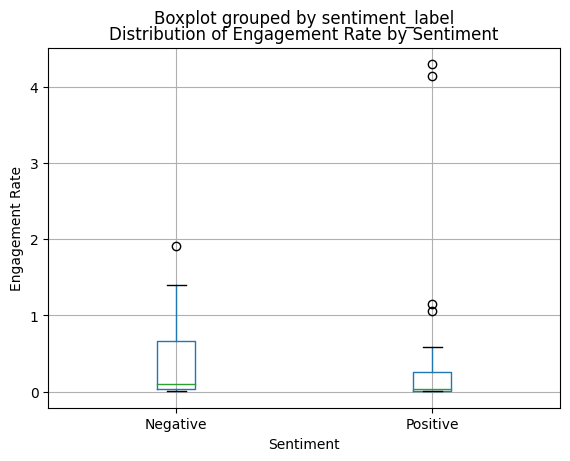

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_entrep[(result_entrep['status'] == 'Main post') & (result_entrep['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2013228929.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = result_entrep[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive']))]


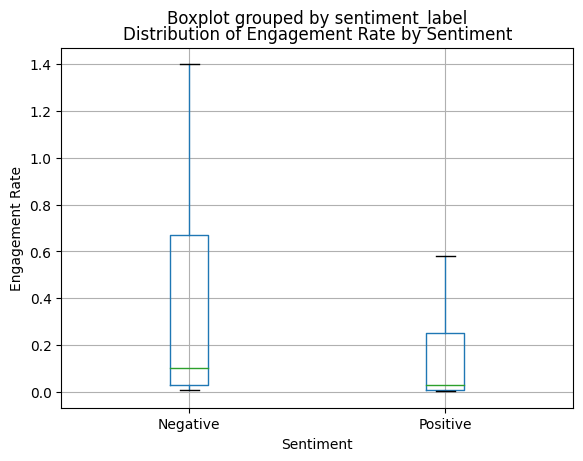

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_entrep[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
31,175,175,khairulaming,nasi lemak tak sedap kalau makan dengan rendang ayam https://t.co/RMcDDrsjml,2021-10-07 15:58:32+00:00,12040,6886,257,Twitter for iPhone,1446142912325062661,...,nasi lemak is not good if you eat it with chicken rendang https://t.co/RMcDDrsjml,nasi lemak good eat chicken rendang,"{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}",0.4404,Positive,NaN,4.298230,1431849.0,Entrepreneur,1431849
30,173,173,khairulaming,"10 bulan lepas bila Sambal Nyet di lancarkan, kita berjaya jual 10,000 botol sambal dalam masa 54 minit. Hari ni 10,000 botol sambal terjual dalam masa 3 minit. Terima kasih sgt guys sbb masih support sampai ke hari ni 🙏🏻🥺🥺 https://t.co/er8ShhXkC3",2021-10-10 04:50:57+00:00,24376,10104,328,Twitter Media Studio,1447062070462074882,...,"10 months ago when Sambal Nyet was launched, we managed to sell 10,000 bottles of sambal within 54 minutes. Today 10,000 bottles of sambal were sold in 3 minutes. Thank you guys so much for still supporting me to this day 🙏🏻🥺🥺 https://t.co/er8ShhXkC3",months ago sambal nyet launched managed sell bottles sambal minutes today bottles sambal sold minutes guys supporting day,"{'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.5267}",0.5267,Positive,NaN,4.141837,1431849.0,Entrepreneur,1431849
19,153,153,khairulaming,mesin topup kat tengah tol tu tak tahu idea siapa sbb buat jem lagi teruk. kalau topup kat stesen minyak pulak kena pakai cash je. card tak boleh. dah nak 2022 weh https://t.co/1pmxcbp6Fb,2021-11-05 23:44:38+00:00,12098,10093,109,Twitter for iPhone,1456769454902181888,...,"the topup machine in the middle of the toll road, I don't know whose idea it is to make the jam even worse. if you top up at the gas station, you have to use cash. card is not allowed. I already want 2022 https://t.co/1pmxcbp6Fb",topup machine middle toll road idea jam worse gas station cash card allowed,"{'neg': 0.205, 'neu': 0.795, 'pos': 0.0, 'compound': -0.4767}",-0.4767,Negative,Negative,1.914821,1431849.0,Entrepreneur,1431849
29,172,172,khairulaming,teaser untuk adik kakok hok nok kelik klate nati. bowok kreto molek tew https://t.co/9ouFHw2jrB,2021-10-11 02:50:04+00:00,16098,4277,178,Twitter for iPhone,1447394036633911310,...,teaser for sister kakok hok nok kelik klate nati. boyok kreto molek tew https://t.co/9ouFHw2jrB,teaser sister kakok hok nok kelik klate nati boyok kreto molek tew,"{'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compound': -0.25}",-0.2500,Negative,NaN,1.399306,1431849.0,Entrepreneur,1431849
34,181,181,khairulaming,tak faham betul manusia yang suka bercakap bising dalam wayang ni. kau takde respect and common sense ke kat orang lain,2021-10-01 13:19:09+00:00,15560,6059,126,Twitter for iPhone,1443928474004037632,...,I don't really understand people who like to talk loudly in this movie. You don't have respect and common sense for other people,understand talk loudly movie respect common sense,"{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}",0.4767,Positive,Positive,1.144654,1431849.0,Entrepreneur,1431849
36,185,185,khairulaming,eh dah 25 sept ke. selamat hari jadi yang ke-29 wahai Khairul Amin Bin Kamarulzaman 😆 https://t.co/NLrcvHgiXn,2021-09-24 16:13:40+00:00,31516,3690,696,Twitter for iPhone,1441435677883654150,...,It's already September 25th. happy 29th birthday oh Khairul Amin Bin Kamarulzaman 😆 https://t.co/NLrcvHgiXn,september happy birthday khairul amin bin kamarulzaman,"{'neg': 0.0, 'neu': 0.619, 'pos': 0.381, 'compound': 0.5719}",0.5719,Positive,NaN,1.055786,1431849.0,Entrepreneur,1431849
17,151,151,khairulaming,"macam mana aku tak sakit hati dengan maxis. sekarang ada kat KL, ibu negara malaysia. bukannya tengah hiking masuk hutan pun. bayar rm150 s

# ENGAGEMENT RATE OTHERS

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_others['Number of Likes'] +result_others['Number of Retweet'] +result_others['Number of Replies']) / df['followers_count']
result_others.loc[result_others['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_others['followers_count'] = result_others['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_others.loc[result_others['status'] == 'Main post', 'engagement_rate'] = (result_others['Number of Likes'] +result_others['Number of Retweet'] + result_others['Number of Replies']) / result_others['followers_count']


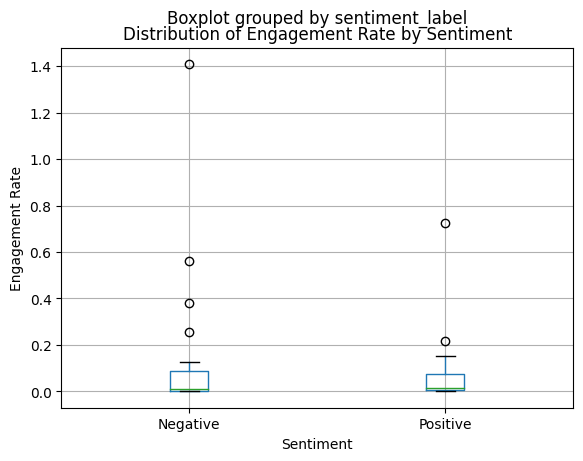

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_others[(result_others['status'] == 'Main post') & (result_others['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


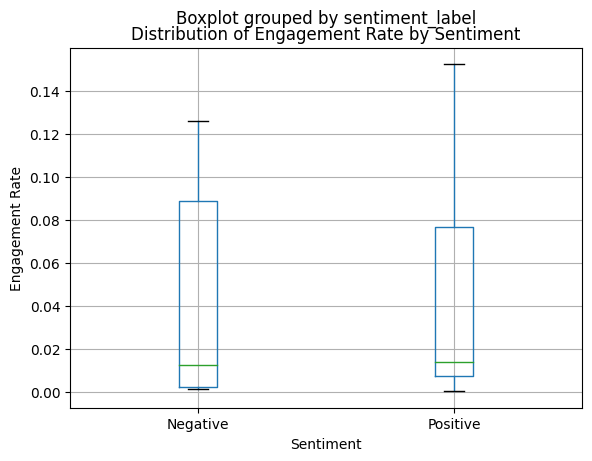

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_others[(result_others['status'] == 'Main post') & (result_others['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
19,451,451,fedtriyahya,"Semoga Allah permudahkan 🥲\n“Mangsa yang sedang hamil empat minggu parah di kepala dan tengkoraknya terpaksa dibuang akibat pendarahan selain rahang, tulang belakang serta rusuk retak disyaki dipukul suaminya. https://t.co/mxFOCKUQkY",2021-11-26 23:34:08+00:00,9093,7197,117,Twitter for iPhone,1464376961095012354,...,"May God make it easy 🥲\n""The victim, who was four weeks pregnant, was seriously injured in her head and skull and had to be removed due to bleeding, in addition to her jaw, spine and cracked ribs, suspected to have been beaten by her husband. https://t.co/mxFOCKUQkY",god easy victim weeks pregnant injured head skull removed bleeding addition jaw spine cracked ribs suspected beaten husband,"{'neg': 0.358, 'neu': 0.453, 'pos': 0.189, 'compound': -0.5423}",-0.5423,Negative,Positive,1.408810,353227.0,Fitness and others,353227
7,435,435,fedtriyahya,Ya Allah… https://t.co/MKOSQ5t5kn,2021-12-29 15:41:35+00:00,18090,13351,137,Twitter for iPhone,1476216835976536066,...,Oh God… https://t.co/MKOSQ5t5kn,god,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.2732}",0.2732,Positive,NaN,0.724266,353227.0,Fitness and others,353227
30,468,468,fedtriyahya,Dilema best student… Ayah antivaksin https://t.co/ZYuNKS9J28,2021-11-06 12:44:11+00:00,3273,1378,73,Twitter for iPhone,1456965635095752720,...,Best student's dilemma… Anti-vaccine father https://t.co/ZYuNKS9J28,students dilemma antivaccine father,"{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.1779}",-0.1779,Negative,NaN,0.562113,353227.0,Fitness and others,353227
29,467,467,fedtriyahya,Apakah kejadian di kedai makan yang tak dapat anda lupakan?,2021-11-07 10:21:39+00:00,3813,1020,778,Twitter for iPhone,1457292156150824960,...,What happened at the restaurant that you can't forget?,happened restaurant forget,"{'neg': 0.487, 'neu': 0.513, 'pos': 0.0, 'compound': -0.2263}",-0.2263,Negative,NaN,0.382013,353227.0,Fitness and others,353227
31,471,471,fedtriyahya,Cemburu buta atau overprotective atau psycho atau baran atau …apa? https://t.co/ou3Zya2NeS,2021-11-05 09:16:07+00:00,829,220,102,Twitter for iPhone,1456550888860897285,...,Blind jealous or overprotective or psycho or crazy or…what? https://t.co/ou3Zya2NeS,blind jealous overprotective psycho crazy orwhat,"{'neg': 0.73, 'neu': 0.27, 'pos': 0.0, 'compound': -0.7964}",-0.7964,Negative,Negative,0.257898,353227.0,Fitness and others,353227
32,472,472,fedtriyahya,🕊 biarlah aku sendirian tanpa cinta… dari menyaksikan sebuah kepuraan… https://t.co/eQ1SIg4i3m,2021-11-04 15:02:16+00:00,1900,656,67,Twitter for iPhone,1456275611681312769,...,🕊 let me be alone without love... from witnessing a pretense... https://t.co/eQ1SIg4i3m,love witnessing pretense,"{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.6369}",0.6369,Positive,NaN,0.218711,353227.0,Fitness and others,353227
34,477,477,fedtriyahya,Apakah kejayaan kecil yang sangat menggembirakan anda?,2021-11-02 12:55:54+00:00,2063,478,353,Twitter for iPhone,1455519032287793159,...,What small success makes you so happy?,small success happy,"{'neg': 0.0, 'neu': 0.119, 'pos': 0.881, 'compound': 0.8126}",0.8126,Positive,NaN,0.152340,353227.0,Fitness and others,353227
36,480,480,fedtriyahya,Hilang rasa satu ujian… https://t.co/1yMUgrBDSw,2021-10-31 10:26:43+00:00,3184,1016,74,Twitter for iPhone,1454756714134183950,...,Missing one test… https://t.co/1yMUgrBDSw,missing test,"{'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.296}",-0.2960,Negative,NaN,0.125687,353227.0,Fitness and others,353227
2,428,428,najibfazail,"As promised, this morning aku akan tulis berkenaan pros and cons of Amanah Saham Bumiputera(ASB) / ASB Financing.\n\nHow this will help your long term financial

# ENGAGEMENT RATE CELEBRITY

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_celeb['Number of Likes'] +result_celeb['Number of Retweet'] +result_celeb['Number of Replies']) / df['followers_count']
result_celeb.loc[result_celeb['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:


# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_celeb['followers_count'] = result_celeb['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_celeb.loc[result_celeb['status'] == 'Main post', 'engagement_rate'] = (result_celeb['Number of Likes'] +result_celeb['Number of Retweet'] + result_celeb['Number of Replies']) / result_celeb['followers_count']


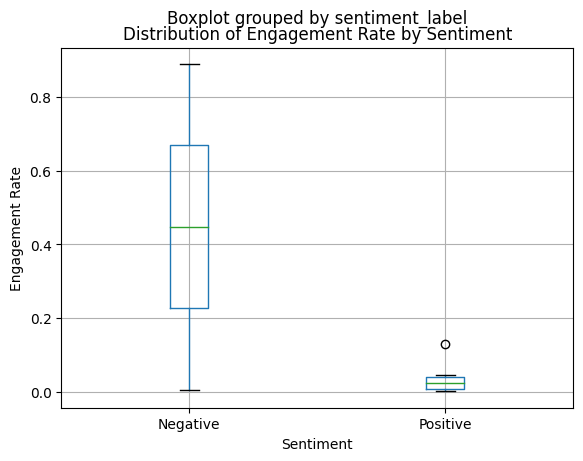

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_celeb[(result_celeb['status'] == 'Main post') & (result_celeb['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


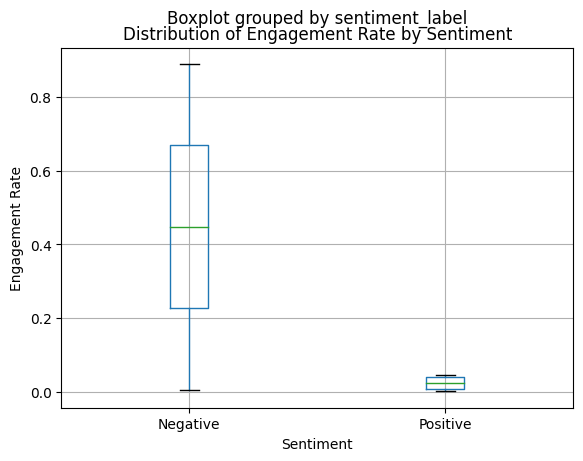

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_celeb[(result_celeb['status'] == 'Main post') & (result_celeb['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
3,87,87,AfikryAibrahim,Merajuk pulak😂 https://t.co/73hRlqTFfe,2021-02-16 09:48:35+00:00,45893,36137,826,Twitter for iPhone,1361613436979847171,...,Sulking again😂 https://t.co/73hRlqTFfe,sulking,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.3612}",-0.3612,Negative,NaN,0.888651,63582.0,Celebrity,63582
7,106,106,yunamusic,Are you guys happy?,2021-01-15 15:59:01+00:00,4224,1086,357,Twitter Web App,1350110246006476800,...,Are you guys happy?,guys happy,"{'neg': 0.0, 'neu': 0.213, 'pos': 0.787, 'compound': 0.5719}",0.5719,Positive,Positive,0.129977,2421637.0,Celebrity,2421637
1,82,82,altimet,"Kawan kawan, jiran jiran, perhatikan lah apa yang sendang berlaku. Guna akal masing masing utk sampai ke pendirian sendiri. Jangan lupa pendirian tu bila PRU nanti.",2021-08-02 03:50:17+00:00,9738,7074,51,Hootsuite Inc.,1422042040288923650,...,"Friends, neighbors, neighbors, pay attention to what is happening. Use your own common sense to come to your own position. Don't forget that stance when the next general election.",friends neighbors neighbors pay attention happening common sense position dont forget stance general election,"{'neg': 0.082, 'neu': 0.641, 'pos': 0.278, 'compound': 0.5213}",0.5213,Positive,NaN,0.045152,547351.0,Celebrity,547351
2,84,84,altimet,Setahun lepas. InsyaAllah kita boleh ulang lagi. https://t.co/TzRbTsanHM,2021-07-01 02:18:45+00:00,4200,2633,61,Hootsuite Inc.,1410422593413390337,...,A year ago. God willing we can repeat it again. https://t.co/TzRbTsanHM,year ago god repeat,"{'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.2732}",0.2732,Positive,NaN,0.040479,547351.0,Celebrity,547351
5,92,92,yunamusic,WOO!!!!! OMG Azreen Nabila did her PERSONAL BEST this morning for women’s 100m #Olympics !! My heart!! ❤️❤️❤️🇲🇾🇲🇾🇲🇾 https://t.co/IH3lSbSQhT,2021-07-30 00:27:25+00:00,32174,15664,51,Twitter for iPhone,1420903822470254592,...,WOO!!!!! OMG Azreen Nabila did her PERSONAL BEST this morning for women’s 100m #Olympics !! My heart!! ❤️❤️❤️🇲🇾🇲🇾🇲🇾 https://t.co/IH3lSbSQhT,woo omg azreen nabila personal morning womens olympics heart,"{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}",0.4767,Positive,NaN,0.029927,2421637.0,Celebrity,2421637
9,109,109,missfazura,Salam Darlings! Faz teringin nak order lemang untuk Raya ni. Boleh minta tolong suggest kat mana yang sedap? Faz suka yang lembut and rasa lemak masin macam tu.. hehe :) Thank you in advance darlings 🙏🏻💖,2021-04-27 07:23:17+00:00,17261,7184,544,Twitter for iPhone,1386944023072440320,...,Greetings Darlings! Faz would like to order lemang for Raya. Can you please suggest where is the best? Faz likes soft and salty fat like that.. hehe :) Thank you in advance darlings 🙏🏻💖,darlings order lemang raya likes soft salty fat hehe advance darlings,"{'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.8481}",0.8481,Positive,Positive,0.019440,1807329.0,Celebrity,1807329
4,90,90,yunamusic,I forgot to tweet on my bday!! Thanks for all the bday wishes❤️ #14nov https://t.co/Zl9TgmnDxV,2021-11-16 17:38:14+00:00,6100,531,67,Twitter for iPhone,1460663514561843200,...,I forgot to tweet on my bday!! Thanks for all the bday wishes❤️ #14nov https://t.co/Zl9TgmnDxV,forgot tweet bday bday wishes nov,"{'neg': 0.0, 'neu': 0.758, 'pos': 0.242, 'compound': 0.1531}",0.1531,Positive,Positive,0.011134,2421637.0,Celebrity,2421637
0,81,81,altimet,Awal tak kalut. @pentas_io https://t.co/Ong5cl1No9,2021-10-11 09:16:54+00:00,810,207,81,Hootsuite Inc.,1447491388589973504,...,The beginning is not confusing. @pentas_io https://t.co/Ong5cl1No9,confusing,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.2263}",-0.2263,Negative,NaN,0.006616,547351.0,Celebrity,547351
8,108,108,missfazura,Assalamualaikum darl

# ENGAGEMENT RATE TECH

In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_tech['Number of Likes'] +result_tech['Number of Retweet'] +result_tech['Number of Replies']) / df['followers_count']
result_tech.loc[result_tech['status'] == 'Main post', 'engagement_rate'] = engagement_rate


In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_tech['followers_count'] = result_tech['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_tech.loc[result_tech['status'] == 'Main post', 'engagement_rate'] = (result_tech['Number of Likes'] + result_tech['Number of Retweet'] + result_tech['Number of Replies']) / result_tech['followers_count']


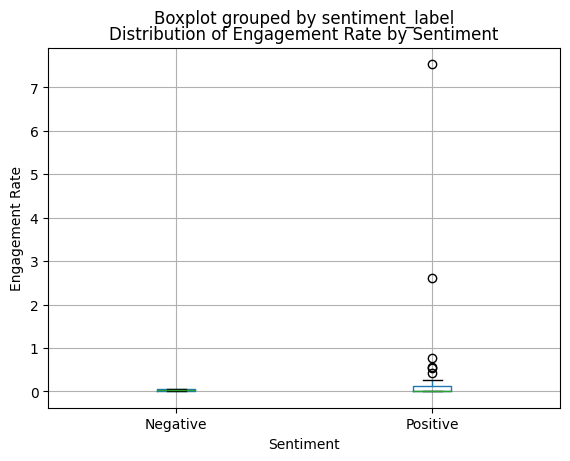

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_tech[(result_tech['status'] == 'Main post') & (result_tech['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


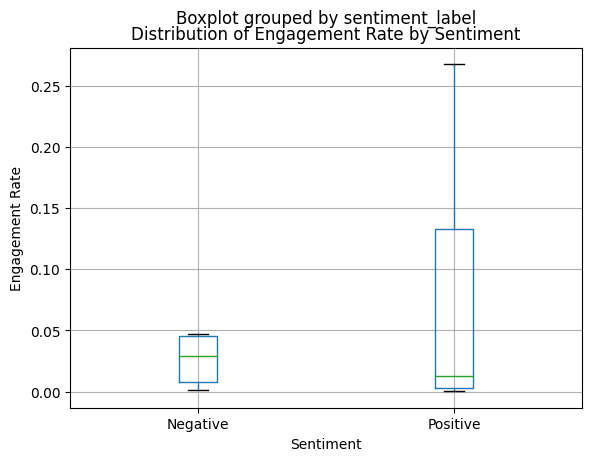

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_tech[(result_tech['status'] == 'Main post') & (result_tech['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
31,45,45,thefaizzainal,Okay ni menarik. https://t.co/y0hQwkjRYw,2021-09-13 07:02:00+00:00,21238,12291,103,Twitter for iPhone,1437310580063232008,...,Okay this is interesting. https://t.co/y0hQwkjRYw,interesting,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}",0.4019,Positive,NaN,7.535738,40214.0,Technology,40214
30,44,44,thefaizzainal,"Walaupun Selangor banyak tempat menarik &amp; cantik untuk beriadah outdoor, ada sebab kenapa beberapa tempat perlu dirahsiakan dari media sosial.\n\nDan aku harap ia kekal begitu. https://t.co/xDwix77YwR",2021-09-13 16:10:03+00:00,15818,5943,228,Twitter for iPhone,1437448497918136326,...,"Although Selangor has many interesting places &amp; beautiful for outdoor recreation, there is a reason why some places need to be kept secret from social media.\n\nAnd I hope it stays that way. https://t.co/xDwix77YwR",selangor interesting places beautiful outdoor recreation reason places secret social media hope stays,"{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.8591}",0.8591,Positive,NaN,2.616492,40214.0,Technology,40214
29,43,43,thefaizzainal,Cuaca hari ni elok 👌 https://t.co/1GpgttdLpB,2021-09-22 05:38:43+00:00,9125,1857,174,Twitter for iPhone,1440551111207751682,...,The weather is beautiful today 👌 https://t.co/1GpgttdLpB,weather beautiful today,"{'neg': 0.0, 'neu': 0.339, 'pos': 0.661, 'compound': 0.5994}",0.5994,Positive,NaN,0.759532,40214.0,Technology,40214
34,52,52,acaiijawe,"Ini benda yang semua anak muda kena tahu bila jumpa BAKAL MERTUA kali PERTAMA.\n\nIa tunjuk pemuda tu serius nak ke peringkat seterusnya.\n\nCuma.\n\nKalau korang pergi lepas Asar macam pakcik ni cadang, ada harapan kena jadi Imam Solat Maghrib😅.\n\nReady je!\n\nhttps://t.co/Lla9yZBjst",2021-11-05 11:37:36+00:00,7087,3290,68,Twitter for iPhone,1456586493015769088,...,"This is something that all young people need to know when they meet their future parents-in-law for the FIRST time.\n\nIt shows that the young man is serious about going to the next level.\n\nOnly.\n\nIf you go after Asr like this uncle suggested, there is a hope of becoming the Maghrib Prayer Imam😅.\n\nIt's ready!\n\nhttps://t.co/Lla9yZBjst",young meet future parentsinlaw time young man level asr uncle suggested hope maghrib prayer imam ready,"{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.6597}",0.6597,Positive,NaN,0.549824,76731.0,Technology,76731
18,24,24,fazlihalimmedia,Siapa bertanggungjawab ni sila tampil kehadapan 🤣🤣🤣 https://t.co/rL6XMrX8Mg,2021-10-30 07:40:33+00:00,12648,8898,63,Twitter for Android,1454352507526733824,...,Whoever is responsible please come forward 🤣🤣🤣 https://t.co/rL6XMrX8Mg,responsible forward,"{'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.3182}",0.3182,Positive,NaN,0.537350,38975.0,Technology,38975
36,54,54,acaiijawe,"Semalam ada kereta Honda Civic himpit terlalu rapat masa aku bayar tol.\n\nJenis bangsa nak elak tol.\n\nTadi lalu Highway Guthrie, siap ditampal nombor plat kereta yang kerap buat begitu.\n\nMaksudnya pihak konsesi tahu. Bila tahu nombor plat, boleh tahu owner. Boleh kot terus dakwa. https://t.co/dFOyzn7Z7R",2021-10-06 05:02:56+00:00,7041,7144,73,Twitter for iPhone,1445615535505305608,...,"Yesterday a Honda Civic car was too close to me when I was paying the toll.\n\nThe type of people who want to avoid tolls.\n\nJust past Highway Guthrie, ready to paste the number plate of cars that often do that.\n\nIt means the concessionaire knows. If you know the plate number, you can know the owner. You can continue to sue. https://t.co/dFOyzn7Z7R",yesterday honda civic car close paying toll type avoid tolls highway guthrie ready paste number plate cars concessionaire plate number owner continue sue,"{'neg': 0.08

In [ ]:
df

,Category,Username,followers_count
0,Entertainer,sofyank96,165963
1,Entertainer,LuqmanPodolski,373473
2,Entertainer,hazemanhuzir,170309
3,Entertainer,CeddyOrNot,93238
4,Entertainer,brgsjks,601568
5,Entertainer,Azfarheri,1600182
6,Entertainer,Matluthfi90,1148066
7,Politics,chairman_GLC,43600
8,Politics,Khairykj,2904857
9,Politics,MuhyiddinYassin,1285412


# ENGAGEMENT RATE MERGED


In [ ]:
# Calculate engagement rate for each row where status is "Main post"
engagement_rate = (result_merged['Number of Likes'] + result_merged['Number of Retweet'] + result_merged['Number of Replies']) / df['followers_count']
result_merged.loc[result_merged['status'] == 'Main post', 'engagement_rate'] = engagement_rate



In [ ]:
result_merged

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,Conversation ID,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate
0,2,2,XavierNaxa,"Melihat cara kerajaan mahupun pembangkang menyelesaikan isu banjir membuatkan saya fikir banyak kali nak pilih parti mana untuk tadbir kerajaan. \n\nRasa nak boikot, tapi tanggungjawab kita sebagai pengundi. Negara tidak akan berubah jika kita undi ahli politik yang sama.",2021-12-26 07:16:38+00:00,3047,2239,50,Twitter for iPhone,1475002598327394306,1475002598327394306,Main post,Technology,"Seeing how the government and the opposition solved the flood issue made me think many times about which party to choose to run the government.\n\nI feel like boycotting, but it is our responsibility as voters. The country will not change if we vote for the same politicians.",government opposition solved flood issue times party choose government feel boycotting responsibility voters country change vote politicians,"{'neg': 0.126, 'neu': 0.651, 'pos': 0.223, 'compound': 0.2732}",0.2732,Positive,NaN,0.032152
1,3,3,XavierNaxa,Penatlah dapat sorang menteri perasan cantik ni...,2021-12-19 13:59:40+00:00,10386,6531,57,Twitter Web App,1472567309940129792,1472567309940129792,Main post,Technology,Tired of getting a minister to notice this beauty...,tired minister notice beauty,"{'neg': 0.333, 'neu': 0.23, 'pos': 0.437, 'compound': 0.2263}",0.2263,Positive,NaN,0.045449
2,4,4,XavierNaxa,Apakah produk Apple yang berjaya anda miliki pada tahun ini?,2021-12-17 16:42:15+00:00,397,60,293,Twitter for iPhone,1471883452324597762,1471883452324597762,Main post,Technology,What are the successful Apple products you have this year?,successful apple products year,"{'neg': 0.0, 'neu': 0.441, 'pos': 0.559, 'compound': 0.5859}",0.5859,Positive,Positive,0.004404
3,5,5,XavierNaxa,Promosi penukaran bateri iPhone 8 dan iPhone 8 Plus serendah RM88 di @SwitchTM yang bagi saya luar biasa murah. \n\nPromosi ini tamat pada 31 Disember 2021. Rebut peluang keemasan ini. Hanya untuk iPhone 8 dan iPhone 8 Plus sahaja. https://t.co/2pNC7bKrAB,2021-12-14 10:57:18+00:00,921,532,63,Twitter for iPhone,1470709477196193796,1470709477196193796,Main post,Technology,iPhone 8 and iPhone 8 Plus battery replacement promotion as low as RM88 at @SwitchTM which for me is incredibly cheap.\n\nThis promotion ends on 31 December 2021. Grab this golden opportunity. Only for iPhone 8 and iPhone 8 Plus only. https://t.co/2pNC7bKrAB,iphone iphone battery replacement promotion low incredibly cheap promotion ends december grab golden opportunity iphone iphone,"{'neg': 0.111, 'neu': 0.741, 'pos': 0.148, 'compound': 0.1779}",0.1779,Positive,NaN,0.016259
4,6,6,XavierNaxa,Apa barangan menarik sempena 12.12 yang telah anda beli? Kongsikan,2021-12-11 16:58:35+00:00,225,28,67,Twitter for iPhone,1469713235125309445,1469713235125309445,Main post,Technology,What interesting items in conjunction with 12.12 have you bought? Share it,interesting items conjunction bought share,"{'neg': 0.0, 'neu': 0.38, 'pos': 0.62, 'compound': 0.5994}",0.5994,Positive,NaN,0.000532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76582,152259,152259,SuriaArul,@SyedSaddiq Ridiculous,2021-09-29 14:02:13+00:00,0,0,0,Twitter for iPhone,1443214534294966280,1442708708308373509,reply,Politics,@SyedSaddiq Ridiculous,ridiculous,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.3612}",-0.3612,Negative,Negative,NaN
76583,152260,152260,rotiPATsegi,"@SyedSaddiq Guna untuk sekolah, hospital, bantuan rakyat lagi berfaedah. Perangai membazir dh sebati agaknya😈",2021-09-29 15:35:21+00:00,0,0,0,Twitter for Android,1443237972267061248,1442708708308373509,reply,Politics,"@SyedSaddiq Use it for schools, hospitals, help the people and it's beneficial. The wasteful attitude seems to be mixed together😈",schools hospitals beneficial wasteful

In [ ]:
# Define a dictionary mapping usernames to followers counts
followers_dict = dict(zip(df['Username'], df['followers_count']))

# Use the map() method to add a new column to the result_pol DataFrame containing the followers count
result_merged['followers_count'] = result_merged['Username'].map(followers_dict)

# Compute the engagement rate by dividing the sum of likes, retweets, and replies by the number of followers
result_merged.loc[result_merged['status'] == 'Main post', 'engagement_rate'] = (result_merged['Number of Likes'] + result_merged['Number of Retweet'] + result_merged['Number of Replies']) / result_merged['followers_count']


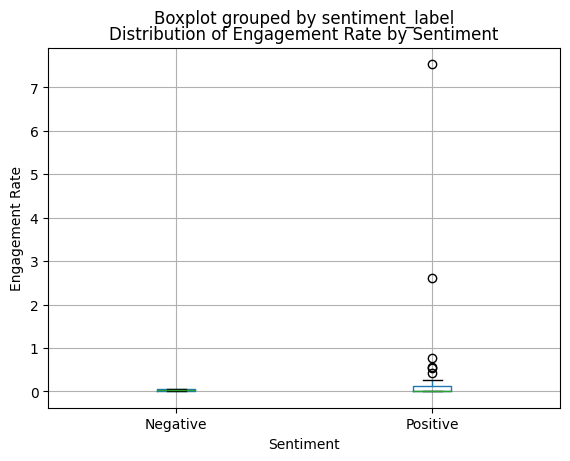

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_merged[(result_merged['status'] == 'Main post') & (result_merged['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


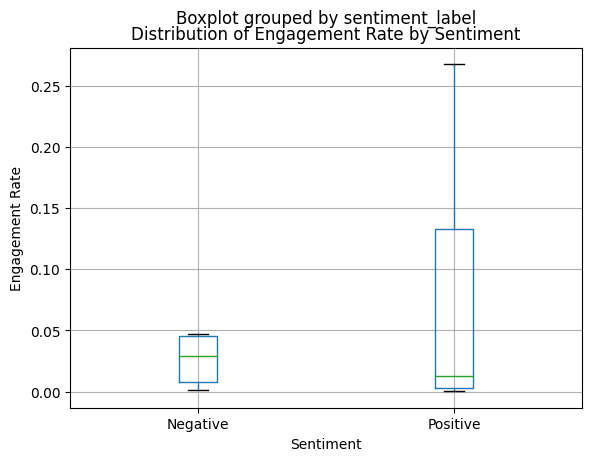

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_merged[(result_merged['status'] == 'Main post') & (result_merged['sentiment_label'].isin(['Negative', 'Positive']))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment')
plt.show()


In [ ]:
merged_dft = merged_df.sort_values(by='engagement_rate', ascending=False)
merged_dft.head(10)

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
31,45,45,thefaizzainal,Okay ni menarik. https://t.co/y0hQwkjRYw,2021-09-13 07:02:00+00:00,21238,12291,103,Twitter for iPhone,1437310580063232008,...,Okay this is interesting. https://t.co/y0hQwkjRYw,interesting,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}",0.4019,Positive,Positive,7.535738,40214.0,Technology,40214
30,44,44,thefaizzainal,"Walaupun Selangor banyak tempat menarik &amp; cantik untuk beriadah outdoor, ada sebab kenapa beberapa tempat perlu dirahsiakan dari media sosial.\n\nDan aku harap ia kekal begitu. https://t.co/xDwix77YwR",2021-09-13 16:10:03+00:00,15818,5943,228,Twitter for iPhone,1437448497918136326,...,"Although Selangor has many interesting places &amp; beautiful for outdoor recreation, there is a reason why some places need to be kept secret from social media.\n\nAnd I hope it stays that way. https://t.co/xDwix77YwR",selangor interesting places beautiful outdoor recreation reason places secret social media hope stays,"{'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.8591}",0.8591,Positive,NaN,2.616492,40214.0,Technology,40214
29,43,43,thefaizzainal,Cuaca hari ni elok 👌 https://t.co/1GpgttdLpB,2021-09-22 05:38:43+00:00,9125,1857,174,Twitter for iPhone,1440551111207751682,...,The weather is beautiful today 👌 https://t.co/1GpgttdLpB,weather beautiful today,"{'neg': 0.0, 'neu': 0.339, 'pos': 0.661, 'compound': 0.5994}",0.5994,Positive,NaN,0.759532,40214.0,Technology,40214
34,52,52,acaiijawe,"Ini benda yang semua anak muda kena tahu bila jumpa BAKAL MERTUA kali PERTAMA.\n\nIa tunjuk pemuda tu serius nak ke peringkat seterusnya.\n\nCuma.\n\nKalau korang pergi lepas Asar macam pakcik ni cadang, ada harapan kena jadi Imam Solat Maghrib😅.\n\nReady je!\n\nhttps://t.co/Lla9yZBjst",2021-11-05 11:37:36+00:00,7087,3290,68,Twitter for iPhone,1456586493015769088,...,"This is something that all young people need to know when they meet their future parents-in-law for the FIRST time.\n\nIt shows that the young man is serious about going to the next level.\n\nOnly.\n\nIf you go after Asr like this uncle suggested, there is a hope of becoming the Maghrib Prayer Imam😅.\n\nIt's ready!\n\nhttps://t.co/Lla9yZBjst",young meet future parentsinlaw time young man level asr uncle suggested hope maghrib prayer imam ready,"{'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.6597}",0.6597,Positive,NaN,0.549824,76731.0,Technology,76731
18,24,24,fazlihalimmedia,Siapa bertanggungjawab ni sila tampil kehadapan 🤣🤣🤣 https://t.co/rL6XMrX8Mg,2021-10-30 07:40:33+00:00,12648,8898,63,Twitter for Android,1454352507526733824,...,Whoever is responsible please come forward 🤣🤣🤣 https://t.co/rL6XMrX8Mg,responsible forward,"{'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.3182}",0.3182,Positive,NaN,0.537350,38975.0,Technology,38975
36,54,54,acaiijawe,"Semalam ada kereta Honda Civic himpit terlalu rapat masa aku bayar tol.\n\nJenis bangsa nak elak tol.\n\nTadi lalu Highway Guthrie, siap ditampal nombor plat kereta yang kerap buat begitu.\n\nMaksudnya pihak konsesi tahu. Bila tahu nombor plat, boleh tahu owner. Boleh kot terus dakwa. https://t.co/dFOyzn7Z7R",2021-10-06 05:02:56+00:00,7041,7144,73,Twitter for iPhone,1445615535505305608,...,"Yesterday a Honda Civic car was too close to me when I was paying the toll.\n\nThe type of people who want to avoid tolls.\n\nJust past Highway Guthrie, ready to paste the number plate of cars that often do that.\n\nIt means the concessionaire knows. If you know the plate number, you can know the owner. You can continue to sue. https://t.co/dFOyzn7Z7R",yesterday honda civic car close paying toll type avoid tolls highway guthrie ready paste number plate cars concessionaire plate number owner continue sue,"{'neg':

# Engagement rate table 

In [ ]:
import pandas as pd

#FOR POLITIC
# Filter the result_pol DataFrame
filtered_df_pol = result_pol[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_pol = filtered_df_pol.merge(df, on='Username')
# Calculate the engagement rate
merged_df_pol['engagement_rate'] = (merged_df_pol['Number of Likes'] + merged_df_pol['Number of Retweet'] + merged_df_pol['Number of Replies']) / df['followers_count']

# FOR ENTERTAINER
# Filter the result_enter DataFrame
filtered_df_enter = result_enter[(result_enter['status'] == 'Main post') & (result_enter['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_enter = filtered_df_enter.merge(df, on='Username')
# Calculate the engagement rate
merged_df_enter['engagement_rate'] = (merged_df_enter['Number of Likes'] + merged_df_enter['Number of Retweet'] + merged_df_enter['Number of Replies']) / df['followers_count']

# FOR TECH
# Filter the result_enter DataFrame
filtered_df_tech = result_tech[(result_tech['status'] == 'Main post') & (result_tech['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_tech = filtered_df_tech.merge(df, on='Username')
# Calculate the engagement rate
merged_df_tech['engagement_rate'] = (merged_df_tech['Number of Likes'] + merged_df_tech['Number of Retweet'] + merged_df_tech['Number of Replies']) / df['followers_count']

# FOR ENTREP
# Filter the result_enter DataFrame
filtered_df_entrep = result_entrep[(result_entrep['status'] == 'Main post') & (result_entrep['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_entrep = filtered_df_entrep.merge(df, on='Username')
# Calculate the engagement rate
merged_df_entrep['engagement_rate'] = (merged_df_entrep['Number of Likes'] + merged_df_entrep['Number of Retweet'] + merged_df_entrep['Number of Replies']) / df['followers_count']

# FOR other
# Filter the result_enter DataFrame
filtered_df_others = result_others[(result_others['status'] == 'Main post') & (result_others['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_others = filtered_df_others.merge(df, on='Username')
# Calculate the engagement rate
merged_df_others['engagement_rate'] = (merged_df_others['Number of Likes'] + merged_df_others['Number of Retweet'] + merged_df_others['Number of Replies']) / df['followers_count']

# FOR celeb
# Filter the result_enter DataFrame
filtered_df_celeb = result_celeb[(result_celeb['status'] == 'Main post') & (result_celeb['sentiment_label'].isin(['Negative', 'Positive']))]
# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df_celeb = filtered_df_celeb.merge(df, on='Username')
# Calculate the engagement rate
merged_df_celeb['engagement_rate'] = (merged_df_celeb['Number of Likes'] + merged_df_celeb['Number of Retweet'] + merged_df_celeb['Number of Replies']) / df['followers_count']






# Create a table to compare the distribution of engagement rate between negative and positive posts
table_data = {
    'Category': ['Technology','Technology',
                  'Entertainer','Entertainer',
                  'Celebrity', 'Celebrity', 
                  ' Others',' Others',
                  'Politic', 'Politic',
                  'Entrepreneur','Entrepreneur'],
    'Sentiment': ['Negative', 'Positive',
                   'Negative', 'Positive',
                   'Negative', 'Positive',
                   'Negative', 'Positive',
                   'Negative', 'Positive',
                   'Negative', 'Positive'],
    'Mean Engagement Rate': [merged_df_tech[merged_df_tech['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_tech[merged_df_tech['sentiment_label'] == 'Positive']['engagement_rate'].mean(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Positive']['engagement_rate'].mean(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Positive']['engagement_rate'].mean(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Positive']['engagement_rate'].mean(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Positive']['engagement_rate'].mean(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Negative']['engagement_rate'].mean(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Positive']['engagement_rate'].mean()],
    'Median Engagement Rate': [merged_df_tech[merged_df_tech['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_tech[merged_df_tech['sentiment_label'] == 'Positive']['engagement_rate'].median(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Positive']['engagement_rate'].median(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Positive']['engagement_rate'].median(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Positive']['engagement_rate'].median(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Positive']['engagement_rate'].median(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Negative']['engagement_rate'].median(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Positive']['engagement_rate'].median()],
    'Standard Deviation': [merged_df_tech[merged_df_tech['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_tech[merged_df_tech['sentiment_label'] == 'Positive']['engagement_rate'].std(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Positive']['engagement_rate'].std(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Positive']['engagement_rate'].std(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Positive']['engagement_rate'].std(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Positive']['engagement_rate'].std(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Negative']['engagement_rate'].std(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Positive']['engagement_rate'].std()],
    'Maximum Engagement Rate': [merged_df_tech[merged_df_tech['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_tech[merged_df_tech['sentiment_label'] == 'Positive']['engagement_rate'].max(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Positive']['engagement_rate'].max(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Positive']['engagement_rate'].max(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Positive']['engagement_rate'].max(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Positive']['engagement_rate'].max(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Negative']['engagement_rate'].max(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Positive']['engagement_rate'].max()],
    'Minimum Engagement Rate': [merged_df_tech[merged_df_tech['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_tech[merged_df_tech['sentiment_label'] == 'Positive']['engagement_rate'].min(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_enter[merged_df_enter['sentiment_label'] == 'Positive']['engagement_rate'].min(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_celeb[merged_df_celeb['sentiment_label'] == 'Positive']['engagement_rate'].min(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_others[merged_df_others['sentiment_label'] == 'Positive']['engagement_rate'].min(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_pol[merged_df_pol['sentiment_label'] == 'Positive']['engagement_rate'].min(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Negative']['engagement_rate'].min(),
                             merged_df_entrep[merged_df_entrep['sentiment_label'] == 'Positive']['engagement_rate'].min()]
}

# Create the DataFrame
table_df = pd.DataFrame(table_data)

# Display the table
table_df

# Save DataFrame to Excel
table_df.to_csv('table_engagementrate.csv', index=False)

# ENGAGEMENT RATE FOR EACH ACCOUNT 


In [ ]:
user_categories = {
    'Entertainer': ['sofyank96', 'LuqmanPodolski', 'hazemanhuzir','CeddyOrNot', 'brgsjks', 'Azfarheri', 'Matluthfi90' ],
    'Politics': ['chairman_GLC', 'Khairykj', 'MuhyiddinYassin', 'limlipeng', 'kuasasiswa', 'NajibRazak', 'n_izzah', 'anwaribrahim', 'SyedSaddiq'],
    'Technology': ['XavierNaxa', 'fazlihalimmedia', 'thefaizzainal','aribismail','acaiijawe' ],
    'Celebrity': ['altimet', 'AfikryAibrahim', 'yunamusic', 'CTNurhaliza11', 'AaronDwiAziz', 'missfazura','Nor4Danish','Shaheizy_Sam' ],
    'Entrepreneur': ['FezzaHussin', 'adibhazlami', 'afiqnazary','AmirulMu_min', 'richardker', 'IZZTAZWAR', 'khairulaming'],
    'Fitness and others': ['najibfazail', 'fedtriyahya', 'Pandelela_R', 'ijaicool', "DrAmalinaBakri"]
}

In [ ]:
main_posts_df =merged_df[merged_df['status'] == 'Main post']
column_names = main_posts_df.columns
print(column_names)




Index(['Unnamed: 0.1', 'Unnamed: 0', 'Username', 'Text', 'Date Created',
       'Number of Likes', 'Number of Retweet', 'Number of Replies',
       'Source of Tweet', 'User ID', 'Conversation ID', 'status', 'Category_x',
       'translated', 'translated cleaned', 'sentiment Scores', 'sentiment',
       'sentiment_label', 'SVM Predicted Label', 'engagement_rate',
       'followers_count_x', 'Category_y', 'followers_count_y'],
      dtype='object')


In [ ]:
user_counts = main_posts_df.groupby('Username').size().sort_values(ascending=False)
top5user = main_posts_df.groupby('Username').size().sort_values(ascending=False).head(30).index.tolist()
top5user

['Khairykj',
 'khairulaming',
 'SyedSaddiq',
 'fedtriyahya',
 'anwaribrahim',
 'NajibRazak',
 'hazemanhuzir',
 'MuhyiddinYassin',
 'brgsjks',
 'kuasasiswa',
 'Azfarheri',
 'acaiijawe',
 'CeddyOrNot',
 'sofyank96',
 'Pandelela_R',
 'XavierNaxa',
 'thefaizzainal',
 'DrAmalinaBakri',
 'ijaicool',
 'chairman_GLC',
 'limlipeng',
 'najibfazail',
 'adibhazlami',
 'fazlihalimmedia',
 'Matluthfi90',
 'LuqmanPodolski',
 'yunamusic',
 'altimet',
 'missfazura',
 'n_izzah']

C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\3728156625.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  result_merged_weekly = result_merged_top5.set_index('Date Created').groupby('Username').resample('W').sum().reset_index()
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\3728156625.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  result_merged_weekly = result_merged_top5.set_index('Date Created').groupby('Username').resample('W').sum().reset_index()
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\3728156625.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is dep

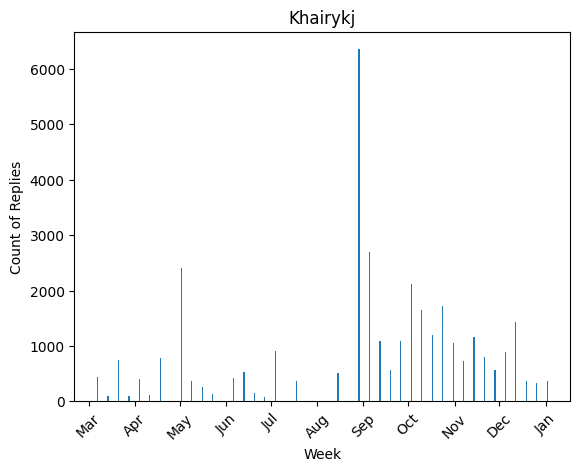

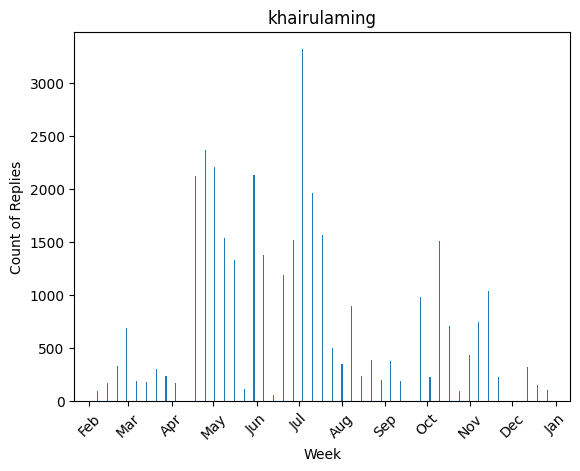

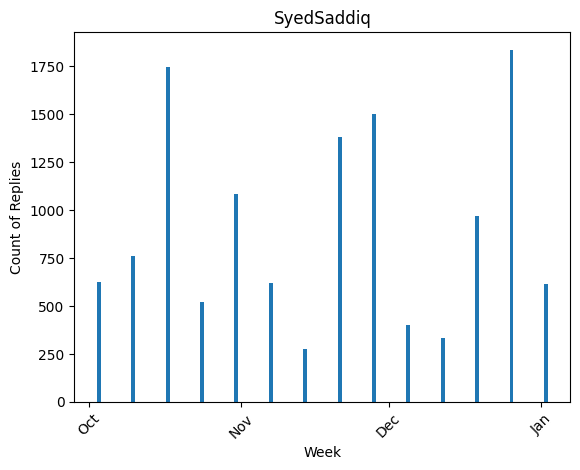

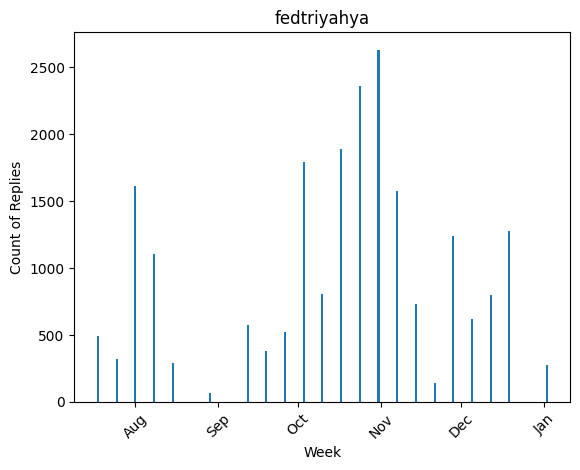

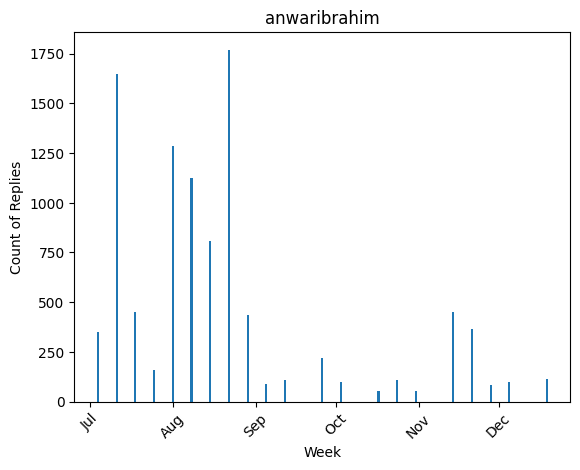

...

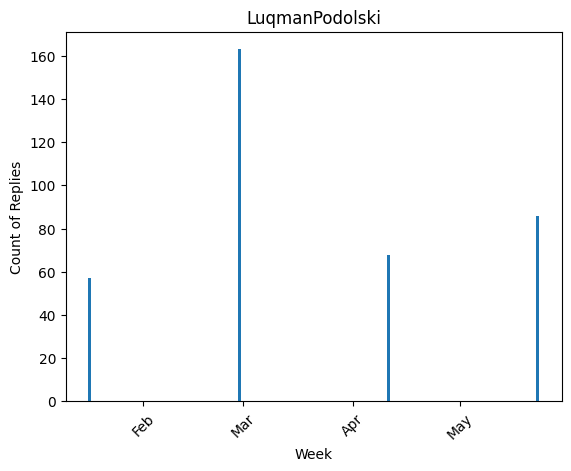

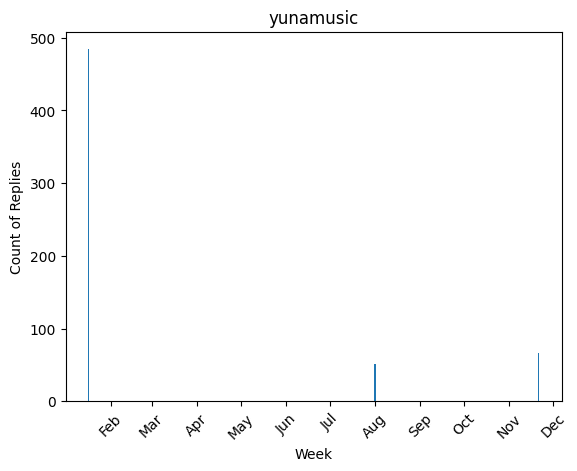

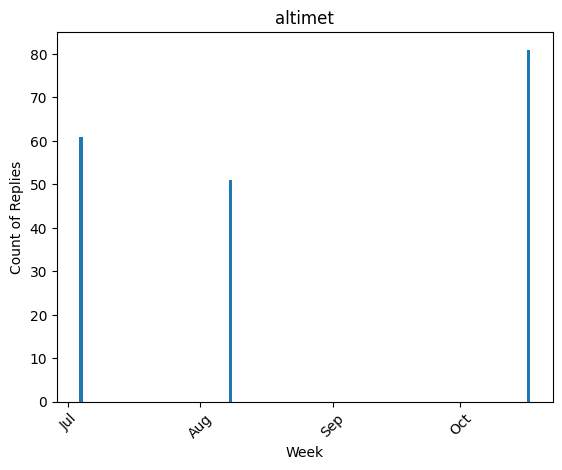

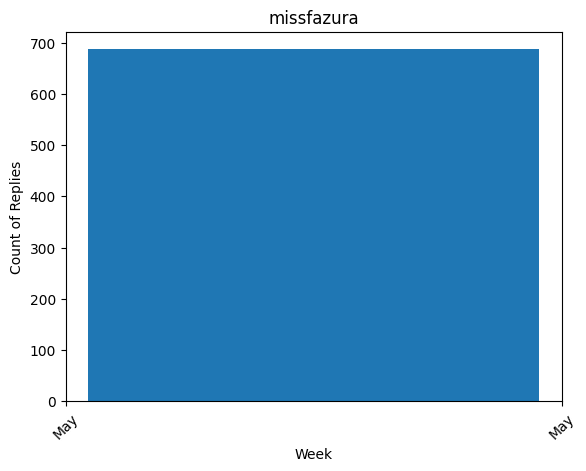

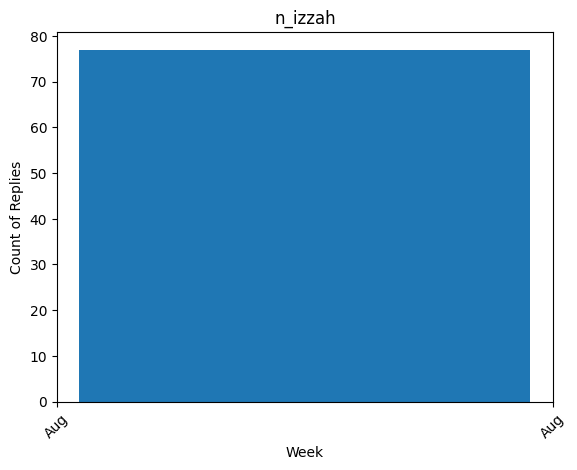

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Filter result_merged by top5user list
result_merged_top5 = main_posts_df[main_posts_df['Username'].isin(top5user)]

# Group the filtered dataframe by 'Username' and resample it by week
result_merged_weekly = result_merged_top5.set_index('Date Created').groupby('Username').resample('W').sum().reset_index()

# Loop through top5user list
for username in top5user:
    # Filter result_merged_weekly dataframe by username
    dt = result_merged_weekly[result_merged_weekly['Username'] == username]
    
    # Create a bar chart of engagement rate by week
    plt.bar(dt['Date Created'], dt['Number of Replies'])
    plt.title(username)
    plt.xlabel('Week')
    plt.ylabel('Count of Replies')
    
    # Set x-axis ticks to show only the first day of each month
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    plt.xticks(rotation=45)
    
    plt.show()


# SYED SADDIQ !!!!

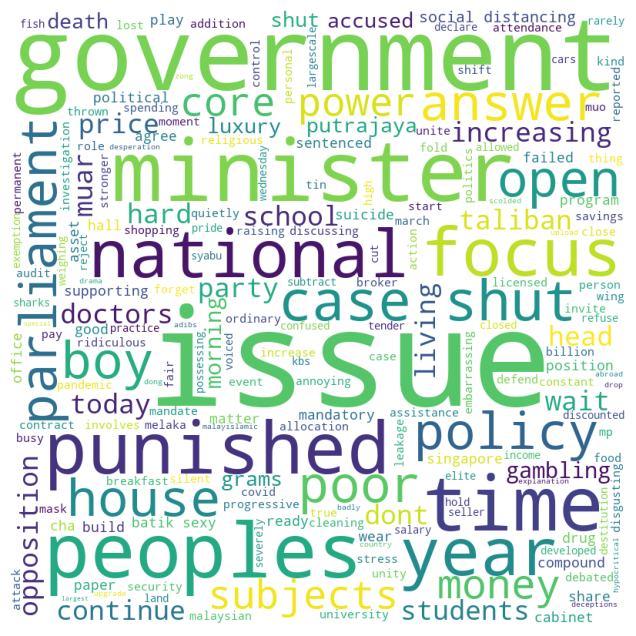

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count_x,Category_y,followers_count_y
954,1589,1589,SyedSaddiq,1. Kabinet Menteri Terbesar - ✅\n\n2. Duta Khas Bertaraf Menteri Terbesar - ✅\n\n3. Penasihat PM Terbesar - In progress\n\nDuit Rakyat - 💸💸💸 https://t.co/ogI5etmVYI,2021-11-28 08:28:48+00:00,1278,649,81,Twitter for iPhone,1464873899674386437,...,1. Largest Cabinet of Ministers - ✅\n\n2. Special Ambassador at the rank of the Greatest Minister - ✅\n\n3. Biggest PM Advisor - In progress\n\nPeople's Money - 💸💸💸 https://t.co/ogI5etmVYI,largest cabinet ministers special ambassador rank greatest minister biggest advisor progress peoples money,"{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.8658}",0.8658,Positive,NaN,NaN,1433780.0,Politics,1433780
955,1590,1590,SyedSaddiq,"Malaysia perlukan rombakan progesif kepada sistem negara terutamanya pada pembentukan dasar, reformasi institusi &amp; kenegaraan.\n\nKumpulan yang menyokong BMA ini terdiri daripada yang berpengalaman &amp; bukan partisan dapat memperkenalkan polisi yang menyeluruh dan adil. (1/2) https://t.co/ab7UrcgXG6",2021-11-28 05:47:55+00:00,311,111,148,Twitter for iPhone,1464833414456963074,...,"Malaysia needs a progressive overhaul of the national system, especially in policy formation, institutional reform &amp; nationality.\n\nThe group supporting BMA consists of experienced &amp; non-partisans can introduce comprehensive and fair policies. (1/2) https://t.co/ab7UrcgXG6",progressive overhaul national policy formation institutional reform nationality group supporting bma consists experienced nonpartisans introduce comprehensive fair policies,"{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.7351}",0.7351,Positive,NaN,NaN,1433780.0,Politics,1433780
956,1591,1591,SyedSaddiq,"Bila kawan ajak main badminton, it’s time to get fit!🏸 💪🏻 https://t.co/zDivvSsjoi",2021-11-26 04:02:22+00:00,3302,526,96,Twitter for iPhone,1464082075179372546,...,"When friends invite you to play badminton, it's time to get fit!🏸 💪🏻 https://t.co/zDivvSsjoi",friends invite play badminton time fit,"{'neg': 0.0, 'neu': 0.172, 'pos': 0.828, 'compound': 0.8225}",0.8225,Positive,Positive,NaN,1433780.0,Politics,1433780
957,1592,1592,SyedSaddiq,Batik is Sexy ✌️ https://t.co/oVd45ykLiR,2021-11-25 04:18:59+00:00,3932,258,90,Twitter for iPhone,1463723867910729729,...,Batik is Sexy ✌️ https://t.co/oVd45ykLiR,batik sexy,"{'neg': 0.0, 'neu': 0.227, 'pos': 0.773, 'compound': 0.5267}",0.5267,Positive,NaN,NaN,1433780.0,Politics,1433780
958,1593,1593,SyedSaddiq,Betul ke Syed Saddiq nak haramkan subjek agama di Universiti?\n\nSubjek agama tidak diperlukan sampai kena mansuh?\n\nPlease share this video! https://t.co/rXPasGzLmr,2021-11-24 13:37:27+00:00,18537,12816,569,Twitter for iPhone,1463502021349322756,...,Is it true that Syed Saddiq wants to ban religious subjects in the University?\n\nReligious subjects are not required until they are abolished?\n\nPlease share this video! https://t.co/rXPasGzLmr,true syed saddiq ban religious subjects university religious subjects required abolished share video,"{'neg': 0.194, 'neu': 0.538, 'pos': 0.269, 'compound': 0.1027}",0.1027,Positive,NaN,NaN,1433780.0,Politics,1433780
959,1594,1594,SyedSaddiq,"Ridiculous!\n\nSampai ada naik 2 kali ganda!\n\nSelain kuasa @kpdnhep untuk kawal harga, we must look at the core issue for the constant increasing price.\n\nThe government should start taking food security issue seriously! https://t.co/XIxA6uMsz2",2021-11-24 04:37:17+00:00,2230,1917,92,Twitter for iPhone,1463366085449641987,...,"Ridiculous!\n\nUntil there is a 2-fold increase!\n\nIn addition to @kpdnhep's power to control prices, we must look at the core issue for the constant increasing price.\n\nThe government should start taking food security issue seriously! http

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter main_posts_df by username and date range
username = 'SyedSaddiq'
start_date = '2021-10-01'
end_date = '2021-11-30'
df_filtered = main_posts_df[(main_posts_df['Username'] == username) & 
                            (main_posts_df['Date Created'] >= start_date) &
                            (main_posts_df['Date Created'] <= end_date)]



# Combine all text into a single string
text = ' '.join(df_filtered['translated cleaned'])

wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

df_filtered


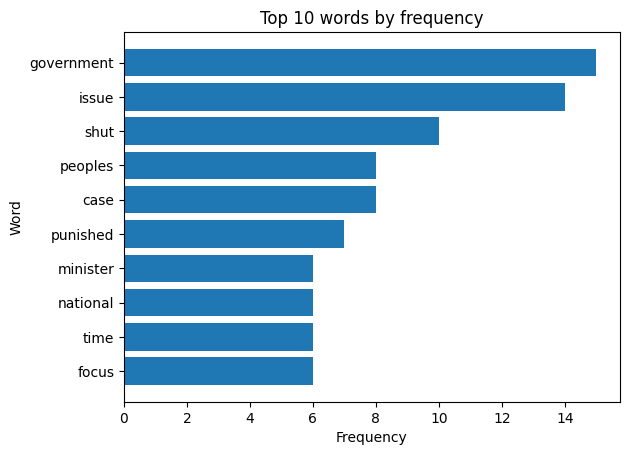

In [ ]:
from collections import Counter

# Split text into individual words
words = text.split()

# Count frequency of each word
word_freq = Counter(words)

# Get the top N words by frequency
N = 10
top_words = word_freq.most_common(N)

# Create bar chart
fig, ax = plt.subplots()
words, freqs = zip(*top_words)
ax.barh(words, freqs)
ax.invert_yaxis()
ax.set_xlabel('Frequency')
ax.set_ylabel('Word')
ax.set_title('Top {} words by frequency'.format(N))
plt.show()


c:\Users\Fikri\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


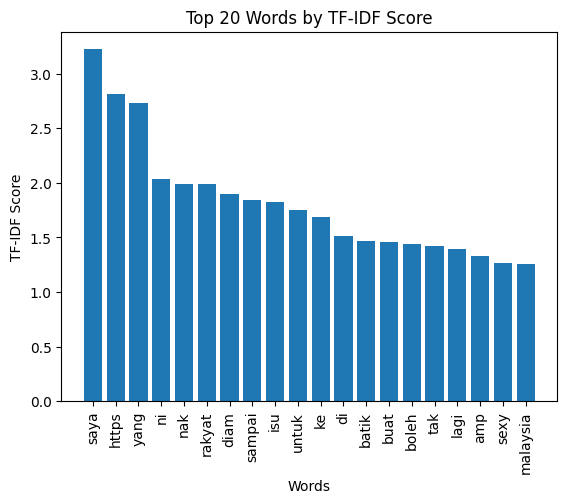

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Filter main_posts_df by username and date range
username = 'SyedSaddiq'
start_date = '2021-10-01'
end_date = '2021-11-30'
df_filtered = main_posts_df[(main_posts_df['Username'] == username) & 
                            (main_posts_df['Date Created'] >= start_date) &
                            (main_posts_df['Date Created'] <= end_date)]

# Create a TF-IDF vectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf = vectorizer.fit_transform(df_filtered['Text'])

# Get the feature names and scores
feature_names = vectorizer.get_feature_names()
scores = tfidf.sum(axis=0).A1

# Create a dictionary of feature names and scores
dict_tfidf = dict(zip(feature_names, scores))

# Sort the dictionary by score in descending order
dict_tfidf_sorted = dict(sorted(dict_tfidf.items(), key=lambda x: x[1], reverse=True))

# Get the top 20 words and scores
top_words = list(dict_tfidf_sorted.keys())[:20]
top_scores = list(dict_tfidf_sorted.values())[:20]

# Plot the bar chart of top words and scores
plt.bar(top_words, top_scores)
plt.xticks(rotation=90)
plt.xlabel('Words')
plt.ylabel('TF-IDF Score')
plt.title('Top 20 Words by TF-IDF Score')
plt.show()


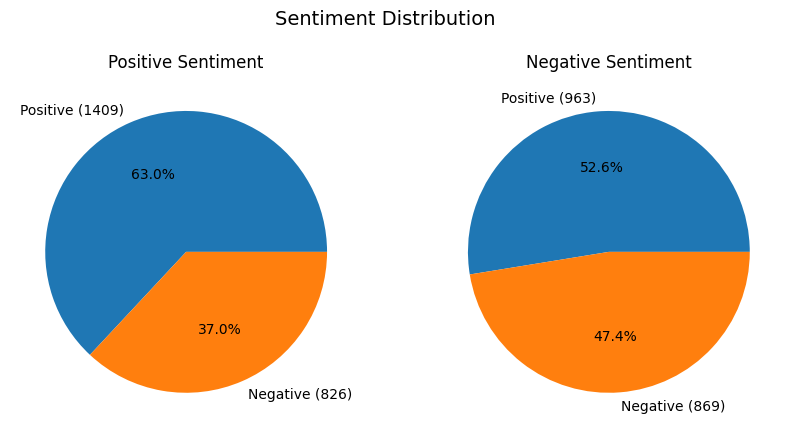

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'SyedSaddiq')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'SyedSaddiq')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


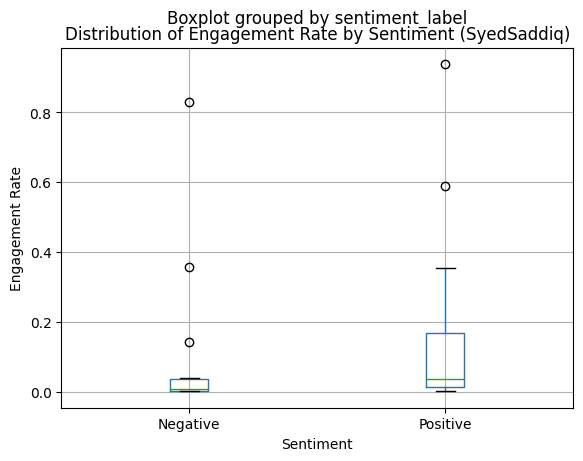

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_pol[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive'])& (result_pol['Username'] == 'SyedSaddiq'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (SyedSaddiq)')
plt.show()


<Figure size 800x600 with 0 Axes>

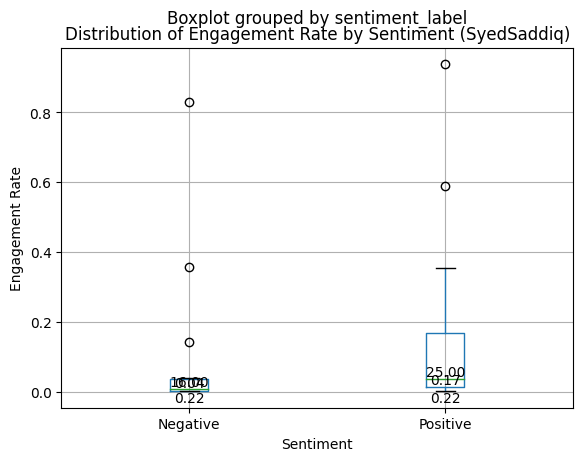

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame for username = 'SyedSaddiq'
filtered_df = result_pol[(result_pol['status'] == 'Main post') & (result_pol['sentiment_label'].isin(['Negative', 'Positive'])) & (result_pol['Username'] == 'SyedSaddiq')]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
plt.figure(figsize=(8, 6))
ax = merged_df.boxplot(column='engagement_rate', by='sentiment_label', showfliers=True)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (SyedSaddiq)')

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()
positions = [1, 2]
for i, stat in enumerate(summary_stats.itertuples()):
    ax.text(positions[i], stat[6], f"{stat[1]:.2f}", horizontalalignment='center', verticalalignment='bottom', color='black')
    ax.text(positions[i], stat[4], f"{stat[3]:.2f}", horizontalalignment='center', verticalalignment='top', color='black')
    ax.text(positions[i], stat[5], f"{stat[7]:.2f}", horizontalalignment='center', verticalalignment='bottom', color='black')

plt.show()



In [ ]:
summary_stats

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,16.0,0.092342,0.216659,0.000652,0.002613,0.007324,0.035513,0.830070
Positive,25.0,0.136190,0.220003,0.000790,0.012001,0.035541,0.167431,0.938744


In [ ]:
# Filter the result_pol dataframe by SyedSaddiq's posts
syedsaddiqpost = result_pol[result_pol['Username'] == 'SyedSaddiq']

# Get the list of conversation IDs
syedsaddiqconvid = syedsaddiqpost['Conversation ID'].tolist()

# Filter the result_pol dataframe by replies to SyedSaddiq's posts
syedsaddiqreply = result_pol[result_pol['Conversation ID'].isin(syedsaddiqconvid)]
syedsaddiqreply

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month,engagement_rate,followers_count
332,1549,1549,SyedSaddiq,"MUDA SUDAH LULUS.🎉\n\nBirthday MUDA 23 Disember 2021!!\n\nMaaf tidak maklumkan lebih awal kerana kita mahu fokus pada misi banjir. \n\nJoin us now! Semua boleh jadi ahli MUDA - tua, muda, muslim, non muslim!\n\nMUDA is a party for ALL &amp; a party for the FUTURE!\n\nhttps://t.co/w3A7X6AOyH https://t.co/ZAPIDEhGif",2021-12-29 06:32:11+00:00,6872,3882,186,Twitter for iPhone,1476078576109645828,...,Politics,"YOUNG HAS PASSED.🎉\n\nMUDA's birthday December 23, 2021!!\n\nSorry for not informing you earlier because we want to focus on the flood mission.\n\nJoin us now! Everyone can be a YOUNG member - old, young, Muslim, non-Muslim!\n\nMUDA is a party for ALL &amp; a party for the FUTURE!\n\nhttps://t.co/w3A7X6AOyH https://t.co/ZAPIDEhGif",young passed mudas birthday december informing earlier focus flood mission join young member young muslim nonmuslim muda party party future,"{'neg': 0.0, 'neu': 0.691, 'pos': 0.309, 'compound': 0.765}",0.7650,Positive,NaN,12,0.007630,1433780.0
333,1550,1550,SyedSaddiq,"Pelik, banjir kali ni banyak balak-balak bersih sampai tak ada kulit kayu. Wood chip pun bersepah. https://t.co/WBkoiHT2Jp",2021-12-28 13:16:15+00:00,11596,5791,186,Twitter for iPhone,1475817874455285761,...,Politics,"It's strange, this time there were many clean logs until there was no bark. Wood chips are also littered. https://t.co/WBkoiHT2Jp",strange time clean logs bark wood chips littered,"{'neg': 0.171, 'neu': 0.571, 'pos': 0.257, 'compound': 0.2263}",0.2263,Positive,NaN,12,0.012256,1433780.0
334,1552,1552,SyedSaddiq,"Dekat acc tulis ""Proud to be Muslim"", penyokong PAS, tapi kuat fitnah.\n\nBuat malu nama baik islam.\n\nSejak bila RM2juta dari DAP/Warisan?\n\nIni datang dari 42,209 penyumbang. Purata RM48.85 seorang.\n\nWe are an open book.\n\nBerani untuk diaudit.\n\nDah kongsikan pecahan perbelanjaan. https://t.co/b0kCcHI7Od",2021-12-27 10:29:04+00:00,3625,2308,120,Twitter for iPad,1475413413710888970,...,Politics,"Near acc write ""Proud to be Muslim"", PAS supporter, but strong slander.\n\nShame on the good name of Islam.\n\nSince when is RM2 million from DAP/Warisan?\n\nThis comes from 42,209 contributors. Average RM48.85 per person.\n\nWe are an open book.\n\nDare to be audited.\n\nHave shared the breakdown of expenses. https://t.co/b0kCcHI7Od",acc write muslim supporter strong slander shame good islam dapwarisan contributors average person open book dare audited shared breakdown expenses,"{'neg': 0.108, 'neu': 0.521, 'pos': 0.372, 'compound': 0.765}",0.7650,Positive,Positive,12,0.004222,1433780.0
335,1553,1553,SyedSaddiq,"Thank you Uncle Ali belanja kami semua makan!\n\nI will belanja you and your family next time, that’s my promise. https://t.co/AJDTtZU3e7",2021-12-26 10:23:22+00:00,10354,2162,111,Twitter for iPhone,1475049592085311493,...,Politics,"Thank you Uncle Ali for shopping, we all ate!\n\nI will shop for you and your family next time, that's my promise. https://t.co/AJDTtZU3e7",uncle ali shopping ate shop family time promise,"{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}",0.3182,Positive,NaN,12,0.008807,1433780.0
336,1554,1554,SyedSaddiq,I’m getting all the current infos from @partimuda Command Centre.\n\nI’m staying alert with the heavy rain that’s happening now. Hopefully no recurring flood.\n\nPraying for the best! https://t.co/XUPeTa3vSy,2021-12-26 09:45:21+00:00,3245,561,95,Twitter for iPhone,1475040024869564418,...,Politics,I’m getting all the current infos from @partimuda Command Centre.\n\nI’m staying alert with the heavy rain that’s happening now. Hopefully no recurring flood.\n\nPraying for the best! https://t.co/XUPeTa3vSy,current infos command centre staying alert heavy rain happening recu

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter result_pol by username
syedsaddiqpost = result_pol[result_pol['Username'] == 'SyedSaddiq']

# Get the list of conversation IDs for SyedSaddiq's posts
syedsaddiqconvid = syedsaddiqpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
syedsaddiqreply = result_pol[result_pol['Conversation ID'].isin(syedsaddiqconvid)]

# Convert sentiment labels to numeric values
syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
syedsaddiqreply_2021 = syedsaddiqreply[syedsaddiqreply['Date Created'].dt.year == 2021]

# Count the total occurrences of each sentiment label in the filtered dataframe
sentiment_counts = syedsaddiqreply_2021['sentiment_label'].value_counts()

# Print the sentiment counts
print(sentiment_counts)


 1    2424
-1    1735
Name: sentiment_label, dtype: int64


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\3172750928.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\935183323.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\935183323.py:44: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = sentiment_counts.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\935183323.py:53: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a time

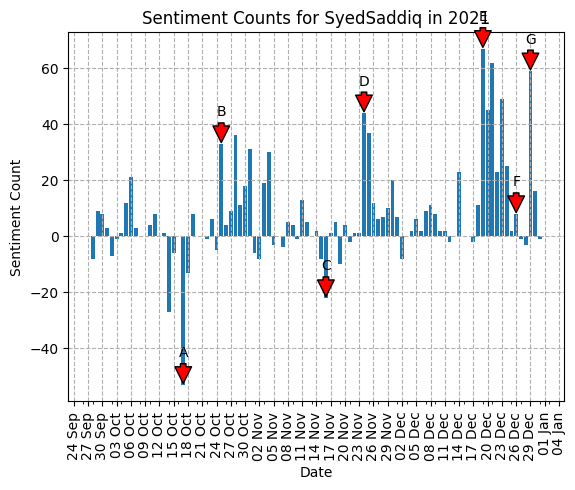

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
syedsaddiqpost = result_pol[result_pol['Username'] == 'SyedSaddiq']

# Get the list of conversation IDs for SyedSaddiq's posts
syedsaddiqconvid = syedsaddiqpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
syedsaddiqreply = result_pol[result_pol['Conversation ID'].isin(syedsaddiqconvid)]

# Convert sentiment labels to numeric values
syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
syedsaddiqreply_2021 = syedsaddiqreply[syedsaddiqreply['Date Created'].dt.year == 2021]

# Sum the count by each day
sentiment_counts = syedsaddiqreply_2021.groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].sum()

# Plot the sentiment counts as a bar chart
fig, ax = plt.subplots()
ax.bar(sentiment_counts.index, sentiment_counts.values)
ax.set_xlabel('Date')
ax.set_ylabel('Sentiment Count')
ax.set_title('Sentiment Counts for SyedSaddiq in 2021')

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


# Add annotation at 25 Dec 2021
annotation_date_2 = pd.Timestamp('2021-10-25')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'B'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')
           


# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-16')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'C'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-24')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'D'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-19')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'E'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')            

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-26')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'F'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')    

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-29')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'G'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center') 

# Show the grid
ax.grid(which='major', alpha=1, linestyle='--')

plt.show()
   

In [ ]:
sentiment_counts

Date Created
2021-09-28 00:00:00+00:00    -8
2021-09-29 00:00:00+00:00     9
2021-09-30 00:00:00+00:00     8
2021-10-01 00:00:00+00:00     3
2021-10-02 00:00:00+00:00    -7
                             ..
2021-12-27 00:00:00+00:00    -1
2021-12-28 00:00:00+00:00    -3
2021-12-29 00:00:00+00:00    59
2021-12-30 00:00:00+00:00    16
2021-12-31 00:00:00+00:00    -1
Freq: D, Name: sentiment_label, Length: 95, dtype: int64

In [ ]:
syedsaddiqreply

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month,engagement_rate,followers_count
332,1549,1549,SyedSaddiq,"MUDA SUDAH LULUS.🎉\n\nBirthday MUDA 23 Disember 2021!!\n\nMaaf tidak maklumkan lebih awal kerana kita mahu fokus pada misi banjir. \n\nJoin us now! Semua boleh jadi ahli MUDA - tua, muda, muslim, non muslim!\n\nMUDA is a party for ALL &amp; a party for the FUTURE!\n\nhttps://t.co/w3A7X6AOyH https://t.co/ZAPIDEhGif",2021-12-29 06:32:11+00:00,6872,3882,186,Twitter for iPhone,1476078576109645828,...,Politics,"YOUNG HAS PASSED.🎉\n\nMUDA's birthday December 23, 2021!!\n\nSorry for not informing you earlier because we want to focus on the flood mission.\n\nJoin us now! Everyone can be a YOUNG member - old, young, Muslim, non-Muslim!\n\nMUDA is a party for ALL &amp; a party for the FUTURE!\n\nhttps://t.co/w3A7X6AOyH https://t.co/ZAPIDEhGif",young passed mudas birthday december informing earlier focus flood mission join young member young muslim nonmuslim muda party party future,"{'neg': 0.0, 'neu': 0.691, 'pos': 0.309, 'compound': 0.765}",0.7650,1,NaN,12,0.007630,1433780.0
333,1550,1550,SyedSaddiq,"Pelik, banjir kali ni banyak balak-balak bersih sampai tak ada kulit kayu. Wood chip pun bersepah. https://t.co/WBkoiHT2Jp",2021-12-28 13:16:15+00:00,11596,5791,186,Twitter for iPhone,1475817874455285761,...,Politics,"It's strange, this time there were many clean logs until there was no bark. Wood chips are also littered. https://t.co/WBkoiHT2Jp",strange time clean logs bark wood chips littered,"{'neg': 0.171, 'neu': 0.571, 'pos': 0.257, 'compound': 0.2263}",0.2263,1,NaN,12,0.012256,1433780.0
334,1552,1552,SyedSaddiq,"Dekat acc tulis ""Proud to be Muslim"", penyokong PAS, tapi kuat fitnah.\n\nBuat malu nama baik islam.\n\nSejak bila RM2juta dari DAP/Warisan?\n\nIni datang dari 42,209 penyumbang. Purata RM48.85 seorang.\n\nWe are an open book.\n\nBerani untuk diaudit.\n\nDah kongsikan pecahan perbelanjaan. https://t.co/b0kCcHI7Od",2021-12-27 10:29:04+00:00,3625,2308,120,Twitter for iPad,1475413413710888970,...,Politics,"Near acc write ""Proud to be Muslim"", PAS supporter, but strong slander.\n\nShame on the good name of Islam.\n\nSince when is RM2 million from DAP/Warisan?\n\nThis comes from 42,209 contributors. Average RM48.85 per person.\n\nWe are an open book.\n\nDare to be audited.\n\nHave shared the breakdown of expenses. https://t.co/b0kCcHI7Od",acc write muslim supporter strong slander shame good islam dapwarisan contributors average person open book dare audited shared breakdown expenses,"{'neg': 0.108, 'neu': 0.521, 'pos': 0.372, 'compound': 0.765}",0.7650,1,Positive,12,0.004222,1433780.0
335,1553,1553,SyedSaddiq,"Thank you Uncle Ali belanja kami semua makan!\n\nI will belanja you and your family next time, that’s my promise. https://t.co/AJDTtZU3e7",2021-12-26 10:23:22+00:00,10354,2162,111,Twitter for iPhone,1475049592085311493,...,Politics,"Thank you Uncle Ali for shopping, we all ate!\n\nI will shop for you and your family next time, that's my promise. https://t.co/AJDTtZU3e7",uncle ali shopping ate shop family time promise,"{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.3182}",0.3182,1,NaN,12,0.008807,1433780.0
336,1554,1554,SyedSaddiq,I’m getting all the current infos from @partimuda Command Centre.\n\nI’m staying alert with the heavy rain that’s happening now. Hopefully no recurring flood.\n\nPraying for the best! https://t.co/XUPeTa3vSy,2021-12-26 09:45:21+00:00,3245,561,95,Twitter for iPhone,1475040024869564418,...,Politics,I’m getting all the current infos from @partimuda Command Centre.\n\nI’m staying alert with the heavy rain that’s happening now. Hopefully no recurring flood.\n\nPraying for the best! https://t.co/XUPeTa3vSy,current infos command centre staying alert heavy rain happening recurring flood praying,"{'neg':

C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\4292850636.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\4292850636.py:44: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = sentiment_counts.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\4292850636.py:53: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a t

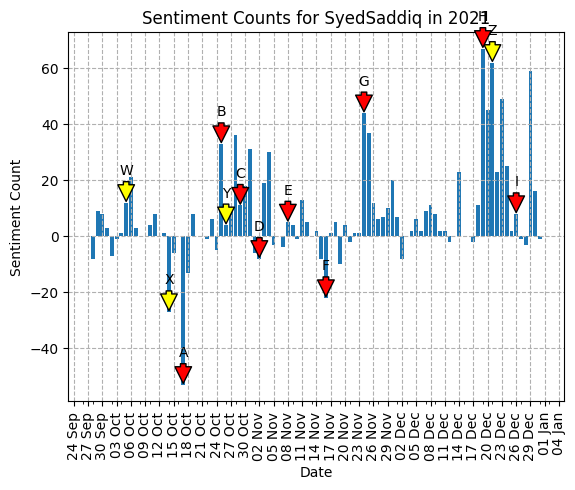

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
syedsaddiqpost = result_pol[result_pol['Username'] == 'SyedSaddiq']

# Get the list of conversation IDs for SyedSaddiq's posts
syedsaddiqconvid = syedsaddiqpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
syedsaddiqreply = result_pol[result_pol['Conversation ID'].isin(syedsaddiqconvid)]

# Convert sentiment labels to numeric values
syedsaddiqreply['sentiment_label'] = syedsaddiqreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
syedsaddiqreply_2021 = syedsaddiqreply[syedsaddiqreply['Date Created'].dt.year == 2021]

# Sum the count by each day
sentiment_counts = syedsaddiqreply_2021.groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].sum()

# Plot the sentiment counts as a bar chart
fig, ax = plt.subplots()
ax.bar(sentiment_counts.index, sentiment_counts.values)
ax.set_xlabel('Date')
ax.set_ylabel('Sentiment Count')
ax.set_title('Sentiment Counts for SyedSaddiq in 2021')

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-05')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'W'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-14')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'X'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-26')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'Y'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-12-21')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'Z'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


# Add annotation at 25 Dec 2021
annotation_date_2 = pd.Timestamp('2021-10-25')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'B'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 29 Dec 2021
annotation_date_2 = pd.Timestamp('2021-10-29')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'C'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 2 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-02')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'D'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')                

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-08')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'E'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')    

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-16')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'F'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-24')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'G'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-19')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'H'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')            

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-26')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'I'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')  

# Show the grid
ax.grid(which='major', alpha=1, linestyle='--')

plt.show()
  

In [ ]:
syedsaddiqpost_filtered = syedsaddiqpost[syedsaddiqpost['Date Created'].dt.strftime('%m/%d') == '12/21']
syedsaddiqpost_filtered


,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,Month,engagement_rate,followers_count
343,1561,1561,SyedSaddiq,"Banyak lagi tempat perlukan bantuan banjir.\n\nDengkil\nTaman Sri Lembayung\nHulu Langat\nLubok China\nBentong\nMentakab\nJelebu\nBandar Sri Ehsan\nJerantut\n\nKita perlu lebih banyak maklumat, tenaga kerja &amp; barang bantuan. Bersih kawasan pun kena ada barang.\n\nSpread our efforts everywhere!",2021-12-21 10:59:15+00:00,12279,20820,84,Twitter for iPhone,1473246682481520641,...,Politics,"Many more places need flood relief.\n\nNaughty\nSri Lembayung Park\nHulu Langat\nLubok China\nBentong\nMentakab\nHaze\nSri Ehsan Town\nJerantut\n\nWe need more information, manpower &amp; relief items. Even the clean area has to have items.\n\nSpread our efforts everywhere!",places flood relief naughty sri lembayung park hulu langat lubok china bentong mentakab haze sri ehsan town jerantut manpower relief items clean area items spread efforts,"{'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.836}",0.8360,Positive,NaN,12,0.023144,1433780.0
344,1562,1562,SyedSaddiq,"Chow Kit ✅ \n\nLembah Pantai ✅ \n\nNext stop, Sepang!\n\nSaya akan tolong sebanyak tempat yang boleh.\n\nSelagi ada yang perlukan bantuan, saya akan cuba turun.\n\nJom kita tolong semua! 🇲🇾 https://t.co/VMhEvp637X",2021-12-21 07:02:59+00:00,20206,7352,317,Twitter for iPhone,1473187223197548546,...,Politics,"Chow Kit ✅\n\nBeach Valley ✅\n\nNext stop, Sepang!\n\nI will help as many places as possible.\n\nAs long as anyone needs help, I'll try to come down.\n\nLet's help everyone! 🇲🇾 https://t.co/VMhEvp637X",chow kit beach valley sepang places long ill,"{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.4215}",-0.4215,Negative,NaN,12,0.019442,1433780.0


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2999042785.py:27: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2999042785.py:35: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2999042785.py:43: FutureWarning: Indexing a timezone-aware DatetimeInd

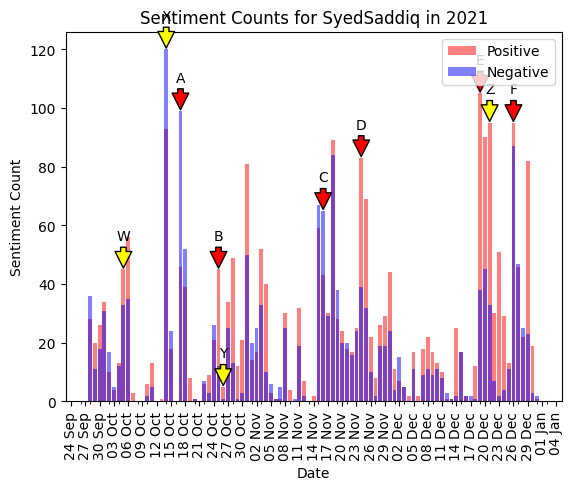

In [ ]:
# Group sentiment counts by positive and negative labels
positive_counts = syedsaddiqreply_2021[syedsaddiqreply_2021['sentiment_label'] == 1].groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].count()
negative_counts = syedsaddiqreply_2021[syedsaddiqreply_2021['sentiment_label'] == -1].groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].count()

# Plot the sentiment counts as separate bar charts
fig, ax = plt.subplots()
ax.bar(positive_counts.index, positive_counts.values,color='red',alpha=0.5, label='Positive')
ax.bar(negative_counts.index, negative_counts.values,color='blue', alpha=0.5, label='Negative')
ax.set_xlabel('Date')
ax.set_ylabel('Sentiment Count')
ax.set_title('Sentiment Counts for SyedSaddiq in 2021')
ax.legend()

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-05')
annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
annotation_text_1 = 'W'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-14')
annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
annotation_text_1 = 'X'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-26')
annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
annotation_text_1 = 'Y'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')            


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-12-21')
annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
annotation_text_1 = 'Z'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = positive_counts.loc[annotation_date_1] if positive_counts.loc[annotation_date_1] >= negative_counts.loc[annotation_date_1] else negative_counts.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')
annotation_date_2 = pd.Timestamp('2021-10-25')
annotation_value_2 = positive_counts.loc[annotation_date_2] if positive_counts.loc[annotation_date_2] >= negative_counts.loc[annotation_date_2] else negative_counts.loc[annotation_date_2]
annotation_text_2 = 'B'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')
           


# Add annotation at 8 Nov 2021
annotation_date_3 = pd.Timestamp('2021-11-16')
annotation_value_3 = positive_counts.loc[annotation_date_3] if positive_counts.loc[annotation_date_3] >= negative_counts.loc[annotation_date_3] else negative_counts.loc[annotation_date_3]
annotation_text_3 = 'C'

ax.annotate(annotation_text_3, xy=(annotation_date_3, annotation_value_3), xytext=(annotation_date_3, annotation_value_3+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_4 = pd.Timestamp('2021-11-24')
annotation_value_4 = positive_counts.loc[annotation_date_4] if positive_counts.loc[annotation_date_4] >= negative_counts.loc[annotation_date_4] else negative_counts.loc[annotation_date_4]
annotation_text_4 = 'D'

ax.annotate(annotation_text_4, xy=(annotation_date_4, annotation_value_4), xytext=(annotation_date_4, annotation_value_4+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_5 = pd.Timestamp('2021-12-19')
annotation_value_5 = positive_counts.loc[annotation_date_5] if positive_counts.loc[annotation_date_5] >= negative_counts.loc[annotation_date_5] else negative_counts.loc[annotation_date_5]
annotation_text_5 = 'E'

ax.annotate(annotation_text_5, xy=(annotation_date_5, annotation_value_5), xytext=(annotation_date_5, annotation_value_5+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')            

# Add annotation at 8 Nov 2021
annotation_date_6 = pd.Timestamp('2021-12-26')
annotation_value_6 = positive_counts.loc[annotation_date_6] if positive_counts.loc[annotation_date_6] >= negative_counts.loc[annotation_date_6] else negative_counts.loc[annotation_date_6]
annotation_text_6 ='F'
ax.annotate(annotation_text_6, xy=(annotation_date_6, annotation_value_6), xytext=(annotation_date_6, annotation_value_6+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')     


plt.show()


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\1757377169.py:36: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\1757377169.py:44: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\1757377169.py:53: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\17

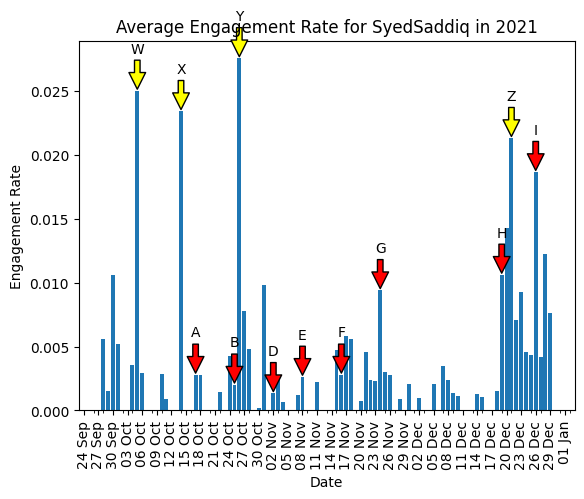

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
syedsaddiqpost = result_pol[result_pol['Username'] == 'SyedSaddiq']

# Filter by year 2021
syedsaddiqpost_2021 = syedsaddiqpost[syedsaddiqpost['Date Created'].dt.year == 2021]

# Get the average engagement rate for each day
engagement_rate_avg = syedsaddiqpost_2021.groupby(pd.Grouper(key='Date Created', freq='D'))['engagement_rate'].mean()

# Plot the engagement rate as a bar chart
fig, ax = plt.subplots()
ax.bar(engagement_rate_avg.index, engagement_rate_avg.values)
ax.set_xlabel('Date')
ax.set_ylabel('Engagement Rate')
ax.set_title('Average Engagement Rate for SyedSaddiq in 2021')

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-05')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'W'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-14')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'X'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-26')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'Y'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-12-21')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'Z'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='yellow', shrink=0.05), ha='center')


# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-10-25')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'B'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-10-29')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'C'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-11-02')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'D'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-11-08')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'E'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-11-16')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'F'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-11-24')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'G'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-12-19')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'H'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


# Add annotation at 22 Oct 2025
annotation_date_1 = pd.Timestamp('2021-12-26')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'I'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


plt.show()


# KHAIRUL AMINGG!!!

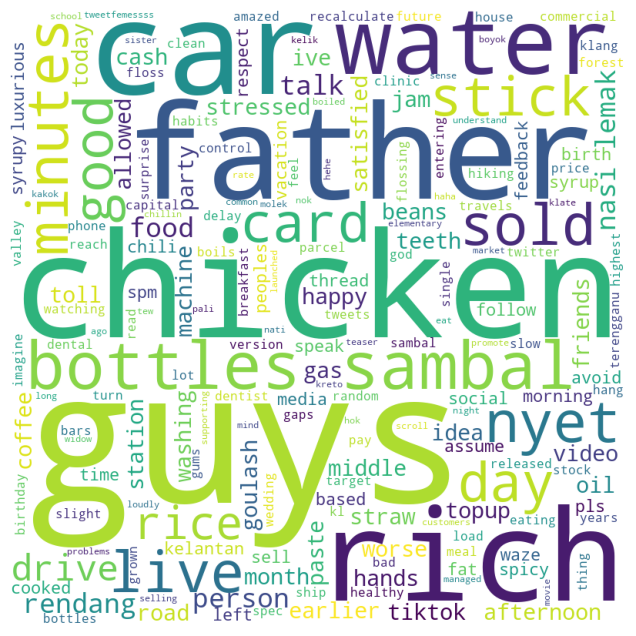

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count
83,147,147,khairulaming,ternampak video ni kat tiktok petang tadi. stress aku dia rebus straw coffee bean jadi pasta 😂 https://t.co/VupunT4UGx,2021-11-15 11:48:46+00:00,8501,3528,114,Twitter for iPhone,1460213181721169921,...,Main post,Entrepreneur,"saw this video on tiktok this afternoon. I'm stressed, he boils straw coffee beans into paste 😂 https://t.co/VupunT4UGx",video tiktok afternoon stressed boils straw coffee beans paste,"{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.34}",-0.3400,Negative,NaN,0.008481,1431849.0
84,148,148,khairulaming,"Terima kasih guys sebab sudi tengok live tadi. 13,000 botol sambal nyet terjual dalam a few minutes tadi. we will do our best to ship out parcel secepat mungkin tapi akan ada delay sikit sbb kita tambah surprise stock tadi. Tq again guys 🙏🏻 https://t.co/ODwgBjwFPh",2021-11-11 06:08:14+00:00,7974,1211,111,Twitter for iPhone,1458677931203465223,...,Main post,Entrepreneur,"Thank you guys for watching live earlier. 13,000 bottles of sambal nyet were sold in the last few minutes. we will do our best to ship out the parcel as soon as possible but there will be a slight delay because we added the surprise stock earlier. Tq again guys 🙏🏻 https://t.co/ODwgBjwFPh",guys watching live earlier bottles sambal nyet sold minutes ship parcel slight delay surprise stock earlier guys,"{'neg': 0.119, 'neu': 0.773, 'pos': 0.108, 'compound': -0.0516}",-0.0516,Negative,NaN,0.006492,1431849.0
85,149,149,khairulaming,"salah satu habit yang aku happy melekat sampai sekarang ialah floss gigi. dah 4 tahun floss gigi setiap hari, around 2 kali sehari setiap kali lepas makan. benda paling best bila pergi klinik and dentist cakap gusi healthy and celah gigi semua bersih ✨🥺 https://t.co/RqvOUdxWSJ",2021-11-09 14:25:37+00:00,7753,1895,55,Twitter for iPhone,1458078326141165568,...,Main post,Entrepreneur,"One of the habits that I am happy to stick to until now is dental floss. I've been flossing my teeth every day for 4 years, around 2 times a day after every meal. the best thing is when you go to the clinic and the dentist says the gums are healthy and the gaps between the teeth are all clean ✨🥺 https://t.co/RqvOUdxWSJ",habits happy stick dental floss ive flossing teeth day years times day meal thing clinic dentist gums healthy gaps teeth clean,"{'neg': 0.0, 'neu': 0.664, 'pos': 0.336, 'compound': 0.8442}",0.8442,Positive,NaN,0.006777,1431849.0
86,151,151,khairulaming,"macam mana aku tak sakit hati dengan maxis. sekarang ada kat KL, ibu negara malaysia. bukannya tengah hiking masuk hutan pun. bayar rm150 sebulan, tapi nak load twitter pun tak lepas. bagi 4G pn line 2 bar. kau bayang nak 5G mcm mana nanti. phone kawan aku pun sama jgk slow https://t.co/unfZKqfqvY",2021-11-08 05:01:57+00:00,19400,10556,874,Twitter for iPhone,1457574086851186689,...,Main post,Entrepreneur,"How can I not feel bad for Maxis? now in KL, the capital of Malaysia. not even while hiking in the forest. pay rm150 a month, but you can't even load twitter. for 4G pn line 2 bars. How do you imagine 5G in the future? My friend's phone is also slow https://t.co/unfZKqfqvY",feel bad kl capital hiking forest pay month load twitter bars imagine future friends phone slow,"{'neg': 0.213, 'neu': 0.652, 'pos': 0.135, 'compound': -0.2023}",-0.2023,Negative,NaN,0.021532,1431849.0
87,152,152,khairulaming,tapi tak puas basuh tangan sebab minyak gulai still melekat 😩 https://t.co/p0LBS633Ov,2021-11-07 17:15:33+00:00,12864,5908,131,Twitter for iPhone,1457396317055975424,...,Main post,Entrepreneur,but I'm not satisfied with washing my hands because the goulash oil still sticks 😩 https://t.co/p0LBS633Ov,satisfied washing hands goulash oil sticks,"{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'co

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter main_posts_df by username and date range
username = 'khairulaming'
start_date = '2021-10-01'
end_date = '2021-11-30'
df_filtered = main_posts_df[(main_posts_df['Username'] == username) & 
                            (main_posts_df['Date Created'] >= start_date) &
                            (main_posts_df['Date Created'] <= end_date)]



# Combine all text into a single string
text = ' '.join(df_filtered['translated cleaned'])

# Generate word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Plot word cloud
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

df_filtered


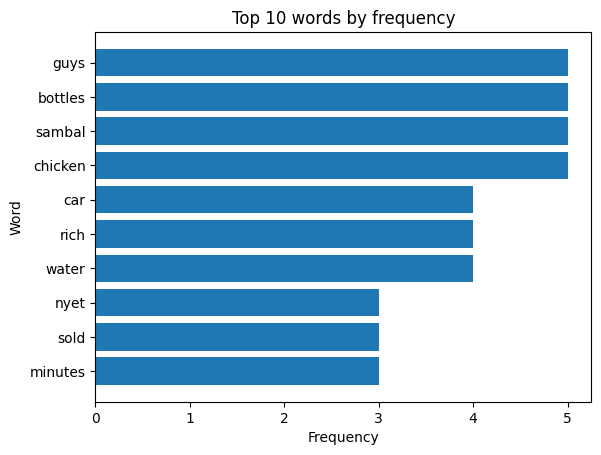

In [ ]:
from collections import Counter

# Split text into individual words
words = text.split()

# Count frequency of each word
word_freq = Counter(words)

# Get the top N words by frequency
N = 10
top_words = word_freq.most_common(N)

# Create bar chart
fig, ax = plt.subplots()
words, freqs = zip(*top_words)
ax.barh(words, freqs)
ax.invert_yaxis()
ax.set_xlabel('Frequency')
ax.set_ylabel('Word')
ax.set_title('Top {} words by frequency'.format(N))
plt.show()


In [ ]:
# Filter the result_pol dataframe by SyedSaddiq's posts
khairulamingpost =result_entrep[result_entrep['Username'] == 'khairulaming']

# Get the list of conversation IDs
khairulamingconvid = khairulamingpost['Conversation ID'].tolist()

# Filter the result_pol dataframe by replies to SyedSaddiq's posts
khairulamingreply = result_entrep[result_entrep['Conversation ID'].isin(khairulamingconvid)]
khairulamingreply

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count
8,128,128,khairulaming,"ini realiti rumah mangsa banjir. buat masa sekarang mereka kena tidur kat PPS dahulu sampai rumah habis cuci. pasca banjir bukan sehari dua nak pulih, akan ambil masa berbulan nak recover balik. sama-sama kita tolong guys 🙏🏻 https://t.co/IVOHIl5PzN",2021-12-21 14:47:41+00:00,11773,11787,50,Twitter for iPhone,1473304171356983296,...,Main post,Entrepreneur,"this is the reality of flood victims' houses. for now they have to sleep at PPS first until the house is cleaned. after the flood it is not a day or two to recover, it will take months to recover. let's help each other guys 🙏🏻 https://t.co/IVOHIl5PzN",reality flood victims houses sleep pps house cleaned flood day recover months recover guys,"{'neg': 0.15, 'neu': 0.85, 'pos': 0.0, 'compound': -0.3182}",-0.3182,Negative,NaN,0.016489,1431849.0
9,129,129,khairulaming,kita perlukan dalam 50 orang volunteers untuk join cuci rumah-rumah mangsa banjir di bentong esok. pls dm me if you are interested. kita buat telegram group 🙏🏻\n- mula 9 pagi\n- self transport\n- pakai boots\n- bawa alatan mencuci (tbc)\n- bawa lunch dan minuman sendiri https://t.co/t9NRQaVu82,2021-12-21 09:54:00+00:00,10935,15883,61,Twitter for iPhone,1473230261475110918,...,Main post,Entrepreneur,We need 50 volunteers to join in cleaning the houses of flood victims in Bentong tomorrow. pls dm me if you are interested. we make a telegram group 🙏🏻\n- from 9 am\n- self transport\n- wear boots\n- bring washing tools (tbc)\n- bring your own lunch and drinks https://t.co/t9NRQaVu82,volunteers join cleaning houses flood victims bentong tomorrow pls dm interested telegram group transport wear boots bring washing tools tbc bring lunch drinks,"{'neg': 0.084, 'neu': 0.691, 'pos': 0.225, 'compound': 0.4404}",0.4404,Positive,NaN,0.018772,1431849.0
10,133,133,khairulaming,will try to rt as many as possible. pls keep rt those who need help guyss. walaupun tak boleh directly bantu kat sana but every effort matters,2021-12-19 11:56:32+00:00,9320,7163,65,Twitter for iPhone,1472536323588489220,...,Main post,Entrepreneur,will try to rt as many as possible. pls keep rt those who need help guyss. walaupun tak boleh directly bantu kat sana but every effort matters,pls guyss walaupun tak boleh directly bantu kat sana effort matters,"{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.1027}",0.1027,Positive,NaN,0.011557,1431849.0
11,134,134,khairulaming,guys please turn on lampu kereta bila drive dalam hujan. bahaya bila orang tak nampak kereta kita,2021-12-18 05:37:10+00:00,23751,17011,91,Twitter for iPhone,1472078463695667201,...,Main post,Entrepreneur,guys please turn on the car lights when driving in the rain. it's dangerous when people don't see our car,guys turn car lights driving rain dangerous car,"{'neg': 0.279, 'neu': 0.721, 'pos': 0.0, 'compound': -0.4767}",-0.4767,Negative,NaN,0.028532,1431849.0
12,137,137,khairulaming,"tangan tu mmg wajib bergerak, baru boleh keluar suara 🤣 https://t.co/SQFsb4WqJG",2021-12-09 15:03:39+00:00,8712,2261,52,Twitter for iPhone,1468959535654076422,...,Main post,Entrepreneur,"The hand must move, then the voice can come out 🤣 https://t.co/SQFsb4WqJG",hand voice,"{'neg': 0.0, 'neu': 0.238, 'pos': 0.762, 'compound': 0.4939}",0.4939,Positive,NaN,0.007700,1431849.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14768,42197,42197,clothbylea,"@khairulaming hai tumpang iklan bole😊 hi guys i ada jual baju,blouse and pants cantik ii ada banyak lagi yang tak post hehe kalau taknak beli pun takpe, rt la untuk rezeki saya hm https://t.co/Tobkswokw6",2021-02-06 07:38:35+00:00,2,0,0,Twitter for Android,1357956841423081474,...,reply,Entrepreneur,"@khairulaming hi, can you take the 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter result_pol by username
khairulamingpost = result_entrep[result_entrep['Username'] == 'khairulaming']

# Get the list of conversation IDs for SyedSaddiq's posts
khairulamingconvid = khairulamingpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
khairulamingreply = result_entrep[result_entrep['Conversation ID'].isin(khairulamingconvid)]

# Convert sentiment labels to numeric values
khairulamingreply['sentiment_label'] = khairulamingreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
khairulamingreply_2021 =khairulamingreply[khairulamingreply['Date Created'].dt.year == 2021]

# Count the total occurrences of each sentiment label in the filtered dataframe
sentiment_counts = khairulamingreply_2021['sentiment_label'].value_counts()

# Print the sentiment counts
print(sentiment_counts)



 1    6367
-1    2391
Name: sentiment_label, dtype: int64


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\4128927206.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  khairulamingreply['sentiment_label'] = khairulamingreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})


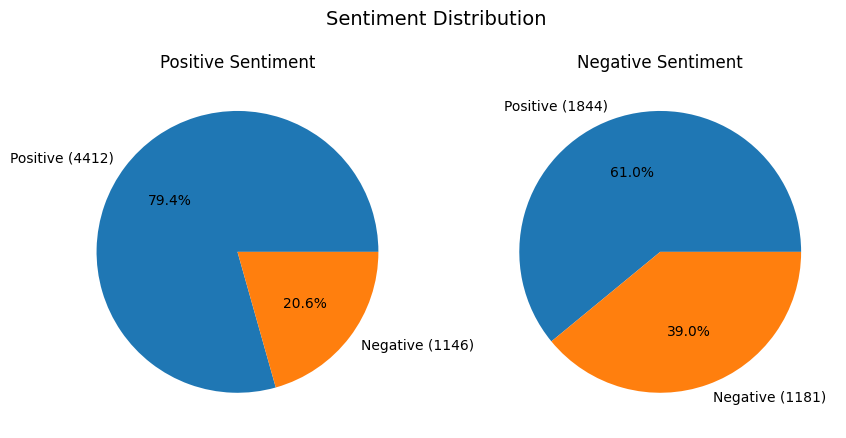

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'khairulaming')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'khairulaming')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


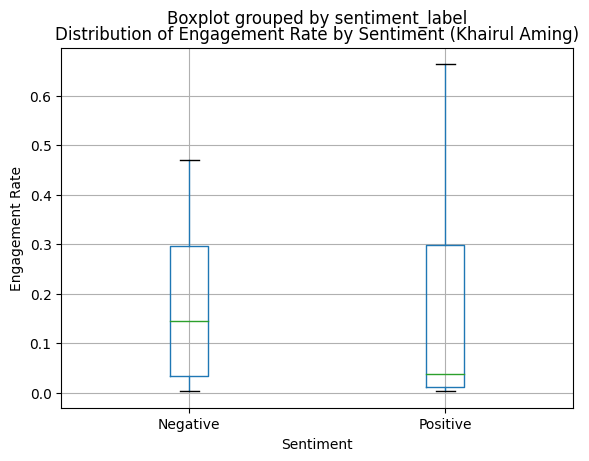

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_entrep[(result_entrep['status'] == 'Main post') & (result_entrep['sentiment_label'].isin(['Negative', 'Positive'])& (result_entrep['Username'] == 'khairulaming'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Khairul Aming)')
plt.show()


<Figure size 800x600 with 0 Axes>

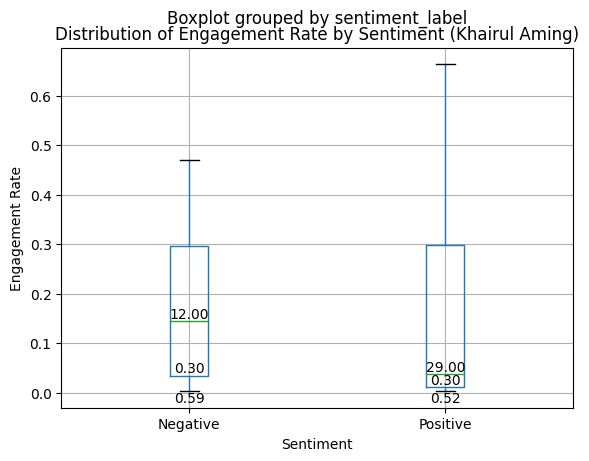

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame for username = 'SyedSaddiq'
filtered_df = result_entrep[(result_entrep['status'] == 'Main post') & (result_entrep['sentiment_label'].isin(['Negative', 'Positive'])) & (result_entrep['Username'] == 'khairulaming')]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
plt.figure(figsize=(8, 6))
ax = merged_df.boxplot(column='engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Khairul Aming)')

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()
positions = [1, 2]
for i, stat in enumerate(summary_stats.itertuples()):
    ax.text(positions[i], stat[6], f"{stat[1]:.2f}", horizontalalignment='center', verticalalignment='bottom', color='black')
    ax.text(positions[i], stat[4], f"{stat[3]:.2f}", horizontalalignment='center', verticalalignment='top', color='black')
    ax.text(positions[i], stat[5], f"{stat[7]:.2f}", horizontalalignment='center', verticalalignment='bottom', color='black')

plt.show()



In [ ]:
summary_stats

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,12.0,0.328077,0.587504,0.003271,0.034159,0.143638,0.295314,2.125953
Positive,29.0,0.306361,0.523433,0.002310,0.010412,0.037220,0.298055,1.870917


C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2739832945.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  khairulamingreply['sentiment_label'] = khairulamingreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2739832945.py:44: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = sentiment_counts.loc[annotation_date_1]
C:\Users\Fikri\AppData\Local\Temp\ipykernel_23040\2739832945.py:53: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use

Text(2021-12-26 00:00:00, 10, 'F')

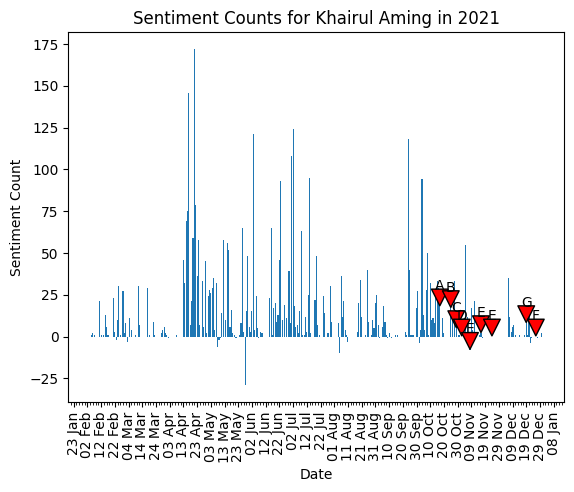

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
khairulamingpost=result_entrep[result_entrep['Username'] == 'khairulaming']

# Get the list of conversation IDs for SyedSaddiq's posts
khairulamingconvid =khairulamingpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
khairulamingreply = result_entrep[result_entrep['Conversation ID'].isin(khairulamingconvid)]

# Convert sentiment labels to numeric values
khairulamingreply['sentiment_label'] = khairulamingreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
khairulamingreply_2021 = khairulamingreply[khairulamingreply['Date Created'].dt.year == 2021]

# Sum the count by each day
sentiment_counts = khairulamingreply_2021.groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].sum()

# Plot the sentiment counts as a bar chart
fig, ax = plt.subplots()
ax.bar(sentiment_counts.index, sentiment_counts.values)
ax.set_xlabel('Date')
ax.set_ylabel('Sentiment Count')
ax.set_title('Sentiment Counts for Khairul Aming in 2021')

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = sentiment_counts.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


# Add annotation at 25 Dec 2021
annotation_date_2 = pd.Timestamp('2021-10-25')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'B'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 29 Dec 2021
annotation_date_2 = pd.Timestamp('2021-10-29')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'C'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

# Add annotation at 2 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-02')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'D'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')                

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-08')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'E'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')    

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-16')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'E'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-24')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'E'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')   

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-19')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'G'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')            

# Add annotation at 8 Nov 2021
annotation_date_2 = pd.Timestamp('2021-12-26')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'F'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')    

# FEDYTRIYAHYA


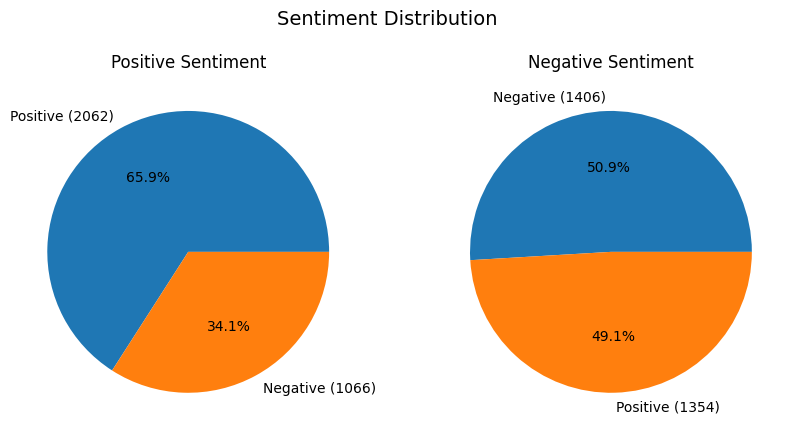

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'fedtriyahya')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'fedtriyahya')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


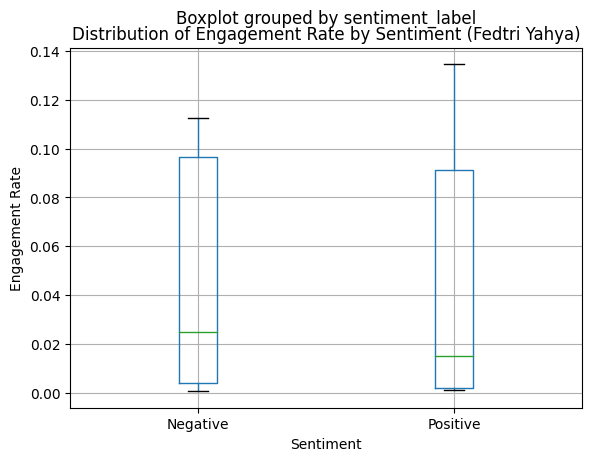

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df = result_others[(result_others['status'] == 'Main post') & (result_others['sentiment_label'].isin(['Negative', 'Positive'])& (result_others['Username'] == 'fedtriyahya'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Fedtri Yahya)')
plt.show()


In [ ]:
summary_stats

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,12.0,0.328262,0.587606,0.003268,0.034138,0.143801,0.295866,2.126387
Positive,29.0,0.306464,0.523630,0.002307,0.010423,0.037268,0.298308,1.873657


# XavierNaxa

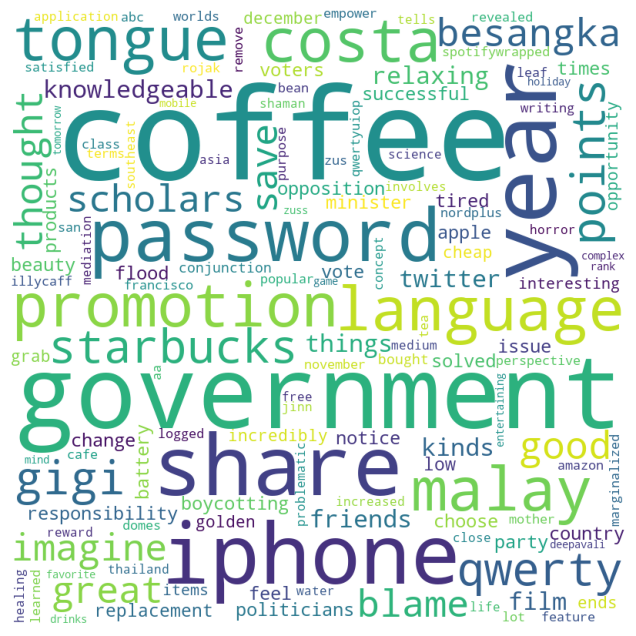

,Unnamed: 0.1,Unnamed: 0,Username,Text,Date Created,Number of Likes,Number of Retweet,Number of Replies,Source of Tweet,User ID,...,status,Category,translated,translated cleaned,sentiment Scores,sentiment,sentiment_label,SVM Predicted Label,engagement_rate,followers_count
0,2,2,XavierNaxa,"Melihat cara kerajaan mahupun pembangkang menyelesaikan isu banjir membuatkan saya fikir banyak kali nak pilih parti mana untuk tadbir kerajaan. \n\nRasa nak boikot, tapi tanggungjawab kita sebagai pengundi. Negara tidak akan berubah jika kita undi ahli politik yang sama.",2021-12-26 07:16:38+00:00,3047,2239,50,Twitter for iPhone,1475002598327394306,...,Main post,Technology,"Seeing how the government and the opposition solved the flood issue made me think many times about which party to choose to run the government.\n\nI feel like boycotting, but it is our responsibility as voters. The country will not change if we vote for the same politicians.",government opposition solved flood issue times party choose government feel boycotting responsibility voters country change vote politicians,"{'neg': 0.126, 'neu': 0.651, 'pos': 0.223, 'compound': 0.2732}",0.2732,Positive,NaN,0.015960,334338.0
1,3,3,XavierNaxa,Penatlah dapat sorang menteri perasan cantik ni...,2021-12-19 13:59:40+00:00,10386,6531,57,Twitter Web App,1472567309940129792,...,Main post,Technology,Tired of getting a minister to notice this beauty...,tired minister notice beauty,"{'neg': 0.333, 'neu': 0.23, 'pos': 0.437, 'compound': 0.2263}",0.2263,Positive,NaN,0.050769,334338.0
2,4,4,XavierNaxa,Apakah produk Apple yang berjaya anda miliki pada tahun ini?,2021-12-17 16:42:15+00:00,397,60,293,Twitter for iPhone,1471883452324597762,...,Main post,Technology,What are the successful Apple products you have this year?,successful apple products year,"{'neg': 0.0, 'neu': 0.441, 'pos': 0.559, 'compound': 0.5859}",0.5859,Positive,Positive,0.002243,334338.0
3,5,5,XavierNaxa,Promosi penukaran bateri iPhone 8 dan iPhone 8 Plus serendah RM88 di @SwitchTM yang bagi saya luar biasa murah. \n\nPromosi ini tamat pada 31 Disember 2021. Rebut peluang keemasan ini. Hanya untuk iPhone 8 dan iPhone 8 Plus sahaja. https://t.co/2pNC7bKrAB,2021-12-14 10:57:18+00:00,921,532,63,Twitter for iPhone,1470709477196193796,...,Main post,Technology,iPhone 8 and iPhone 8 Plus battery replacement promotion as low as RM88 at @SwitchTM which for me is incredibly cheap.\n\nThis promotion ends on 31 December 2021. Grab this golden opportunity. Only for iPhone 8 and iPhone 8 Plus only. https://t.co/2pNC7bKrAB,iphone iphone battery replacement promotion low incredibly cheap promotion ends december grab golden opportunity iphone iphone,"{'neg': 0.111, 'neu': 0.741, 'pos': 0.148, 'compound': 0.1779}",0.1779,Positive,NaN,0.004534,334338.0
4,6,6,XavierNaxa,Apa barangan menarik sempena 12.12 yang telah anda beli? Kongsikan,2021-12-11 16:58:35+00:00,225,28,67,Twitter for iPhone,1469713235125309445,...,Main post,Technology,What interesting items in conjunction with 12.12 have you bought? Share it,interesting items conjunction bought share,"{'neg': 0.0, 'neu': 0.38, 'pos': 0.62, 'compound': 0.5994}",0.5994,Positive,NaN,0.000957,334338.0
5,7,7,XavierNaxa,Kongsi #spotifywrapped2021 anda semua💕 https://t.co/rLnRltTCki,2021-12-01 15:54:51+00:00,439,37,116,Twitter for iPhone,1466073316993630220,...,Main post,Technology,Share your #spotifywrapped2021 everyone💕 https://t.co/rLnRltTCki,share spotifywrapped,"{'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}",0.2960,Positive,NaN,0.001771,334338.0
6,9,9,XavierNaxa,"Saya kongsi penulisan dalam bahasa Melayu, tetap ada yang tidak berpuas hati dan mahu saya guna bahasa rojak.\n\nKatanya ""ni bukan kelas bahasa Melayu""\n\nTujuan saya adalah untuk memperkasa bahasa ibunda yang selama ini dipinggirkan. Banyak yang saya belajar tentang istilah baharu https://t.co/Wc6VqJk67Z",2021-11-28 13:33:48+00:00,6021,2787,129,Twitter for Android,1464950654485467136,...,Main post,Technology,"I share the writi

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter main_posts_df by username and date range
username = 'XavierNaxa'
start_date = '2021-01-01'
end_date = '2021-12-30'
df_filtered = main_posts_df[(main_posts_df['Username'] == username) & 
                            (main_posts_df['Date Created'] >= start_date) &
                            (main_posts_df['Date Created'] <= end_date)]



# Combine all text into a single string
text = ' '.join(df_filtered['translated cleaned'])

# Generate word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Plot word cloud
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()



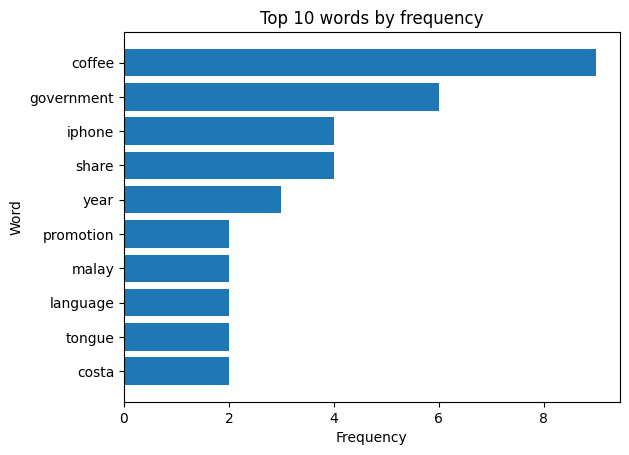

In [ ]:
from collections import Counter

# Split text into individual words
words = text.split()

# Count frequency of each word
word_freq = Counter(words)

# Get the top N words by frequency
N = 10
top_words = word_freq.most_common(N)

# Create bar chart
fig, ax = plt.subplots()
words, freqs = zip(*top_words)
ax.barh(words, freqs)
ax.invert_yaxis()
ax.set_xlabel('Frequency')
ax.set_ylabel('Word')
ax.set_title('Top {} words by frequency'.format(N))
plt.show()


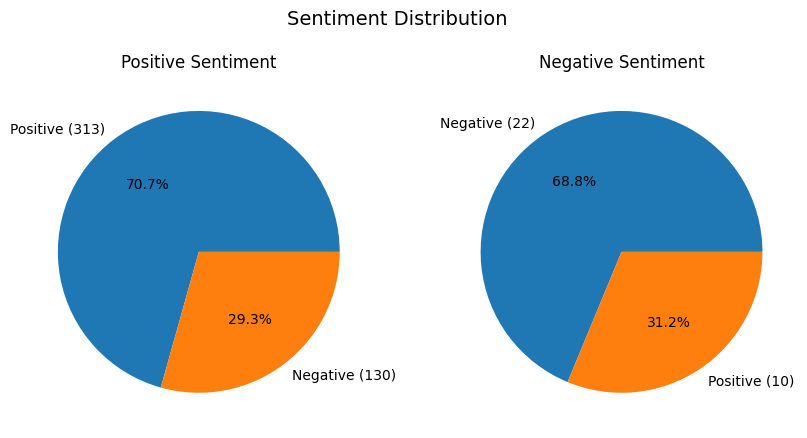

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'XavierNaxa')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'XavierNaxa')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


C:\Users\Fikri\AppData\Local\Temp\ipykernel_22236\202435040.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xavierreply['sentiment_label'] = xavierreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})
C:\Users\Fikri\AppData\Local\Temp\ipykernel_22236\202435040.py:47: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_2 = sentiment_counts.loc[annotation_date_2]


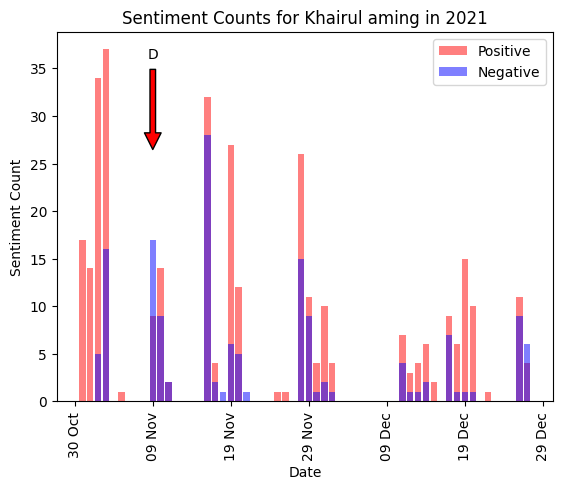

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
xavierpost =result_tech[result_tech['Username'] == 'XavierNaxa']

# Get the list of conversation IDs for SyedSaddiq's posts
xavierconvid= xavierpost['Conversation ID'].tolist()

# Filter result_pol by conversation IDs that are replies to SyedSaddiq's posts
xavierreply = result_tech[result_tech['Conversation ID'].isin(xavierconvid)]

# Convert sentiment labels to numeric values
xavierreply['sentiment_label'] = xavierreply['sentiment_label'].map({'Positive': 1, 'Negative': -1})

# Filter by year 2021
xavierreply_2021 = xavierreply[xavierreply['Date Created'].dt.year == 2021]

# Group sentiment counts by positive and negative labels
positive_counts = xavierreply_2021[xavierreply_2021['sentiment_label'] == 1].groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].count()
negative_counts = xavierreply_2021[xavierreply_2021['sentiment_label'] == -1].groupby(pd.Grouper(key='Date Created', freq='D'))['sentiment_label'].count()

# Plot the sentiment counts as separate bar charts
fig, ax = plt.subplots()
ax.bar(positive_counts.index, positive_counts.values,color='red',alpha=0.5, label='Positive')
ax.bar(negative_counts.index, negative_counts.values,color='blue', alpha=0.5, label='Negative')
ax.set_xlabel('Date')
ax.set_ylabel('Sentiment Count')
ax.set_title('Sentiment Counts for Khairul aming in 2021')
ax.legend()

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(10))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 2 Nov 2021
annotation_date_2 = pd.Timestamp('2021-11-09')
annotation_value_2 = sentiment_counts.loc[annotation_date_2]
annotation_text_2 = 'D'

ax.annotate(annotation_text_2, xy=(annotation_date_2, annotation_value_2), xytext=(annotation_date_2, annotation_value_2+10),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')


plt.show()


C:\Users\Fikri\AppData\Local\Temp\ipykernel_22236\1893210262.py:35: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]


KeyError: Timestamp('2021-10-17 00:00:00')

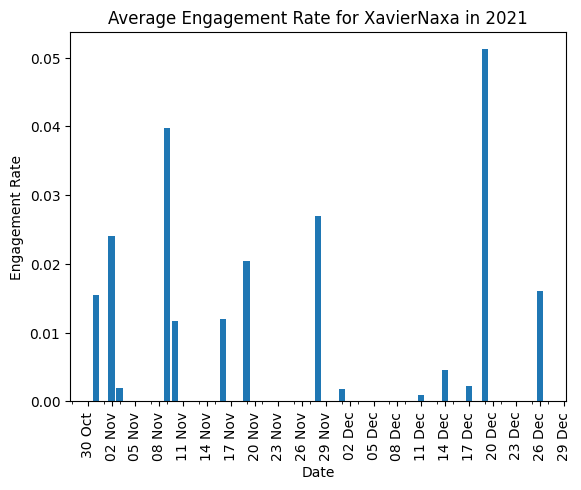

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# Filter result_pol by username
xavierpost =result_tech[result_tech['Username'] == 'XavierNaxa']

# Filter by year 2021
xavierpost_2021 = xavierpost[xavierpost['Date Created'].dt.year == 2021]

# Get the average engagement rate for each day
engagement_rate_avg = xavierpost_2021.groupby(pd.Grouper(key='Date Created', freq='D'))['engagement_rate'].mean()

# Plot the engagement rate as a bar chart
fig, ax = plt.subplots()
ax.bar(engagement_rate_avg.index, engagement_rate_avg.values)
ax.set_xlabel('Date')
ax.set_ylabel('Engagement Rate')
ax.set_title('Average Engagement Rate for XavierNaxa in 2021')

# Set the x-axis tick frequency to every 3 days
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))

# Set the minor locator to every 2 ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(2))

myFmt = mdates.DateFormatter('%d %b')
ax.xaxis.set_major_formatter(myFmt)

ax.xaxis.set_tick_params(rotation=90)

# Add annotation at 22 Oct 2021
annotation_date_1 = pd.Timestamp('2021-10-17')
annotation_value_1 = engagement_rate_avg.loc[annotation_date_1]
annotation_text_1 = 'A'

ax.annotate(annotation_text_1, xy=(annotation_date_1, annotation_value_1), xytext=(annotation_date_1, annotation_value_1+0.003),
            arrowprops=dict(facecolor='red', shrink=0.05), ha='center')

plt.show()


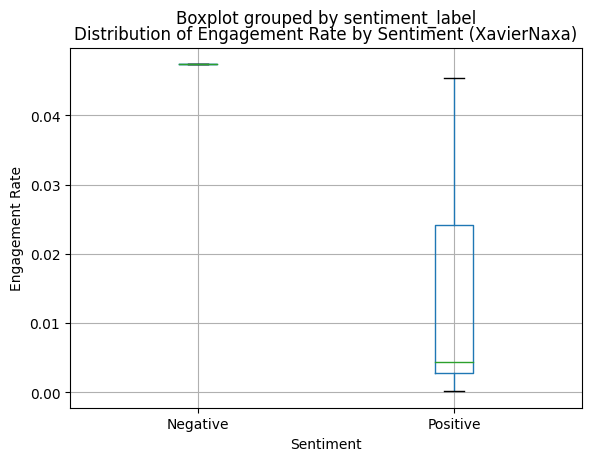

In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df =result_tech[(result_tech['status'] == 'Main post') & (result_tech['sentiment_label'].isin(['Negative', 'Positive'])& (result_tech['Username'] == 'XavierNaxa'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (XavierNaxa)')
plt.show()

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()

In [ ]:
summary_stats

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,1.0,0.047427,NaN,0.047427,0.047427,0.047427,0.047427,0.047427
Positive,15.0,0.022758,0.038418,0.000152,0.002756,0.004405,0.024253,0.135544


# HAZEMAN HUZIR

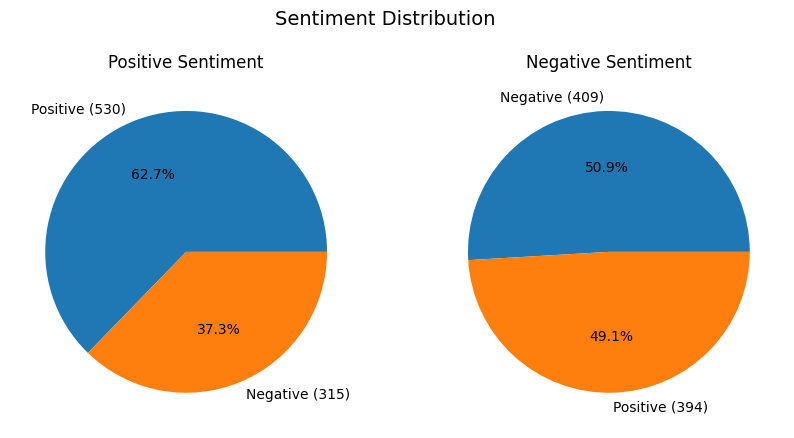

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'hazemanhuzir')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'hazemanhuzir')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


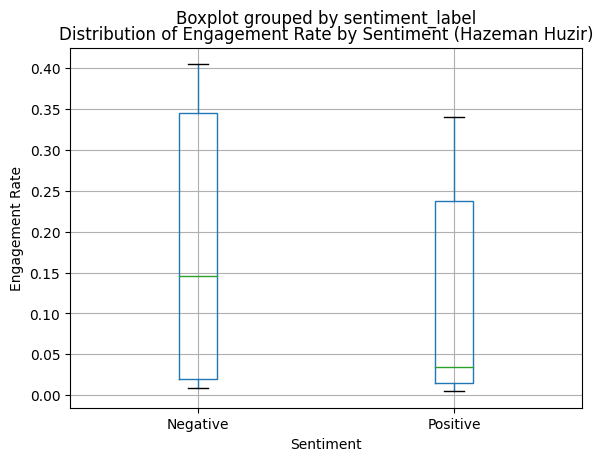

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,21.0,0.909530,2.278751,0.009308,0.019591,0.146241,0.344639,9.153794
Positive,20.0,0.236368,0.396390,0.004694,0.015470,0.034720,0.236950,1.282903


In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df =result_enter[(result_enter['status'] == 'Main post') & (result_enter['sentiment_label'].isin(['Negative', 'Positive'])& (result_enter['Username'] == 'hazemanhuzir'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Hazeman Huzir)')
plt.show()

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()
summary_stats

# YUNA MUSIC

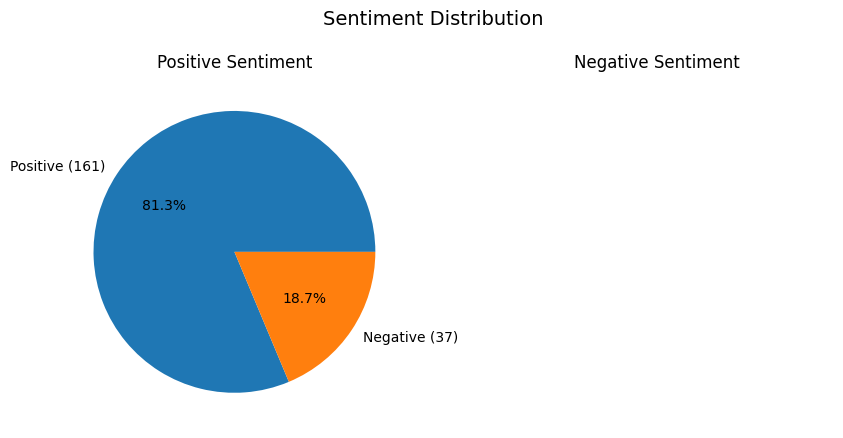

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'yunamusic')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'yunamusic')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


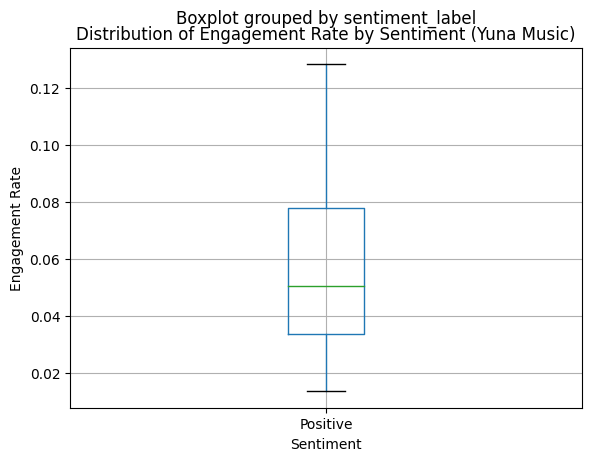

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Positive,4.0,0.060799,0.048921,0.013661,0.033747,0.050665,0.077718,0.128204


In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df =result_celeb[(result_celeb['status'] == 'Main post') & (result_celeb['sentiment_label'].isin(['Negative', 'Positive'])& (result_celeb['Username'] == 'yunamusic'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Yuna Music)')
plt.show()

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()
summary_stats

# Altimet

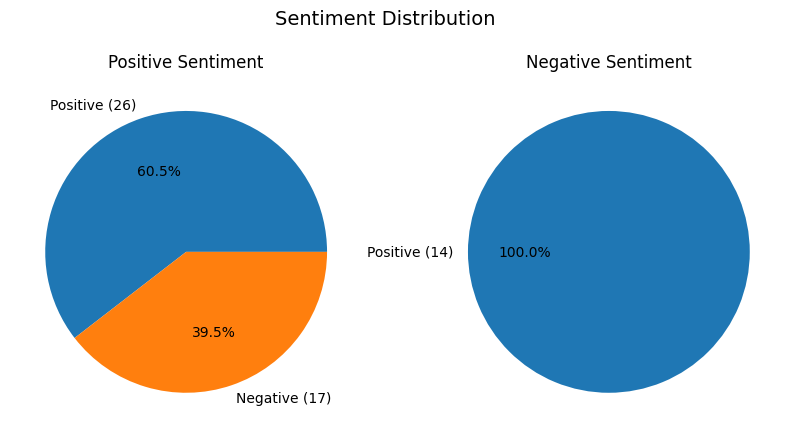

In [ ]:
# Filter the dataframe to get only the main posts with positive or negative sentiment
main_posts_df = result_merged[result_merged['status'] == 'Main post']
positive_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Positive') & (main_posts_df['Username'] == 'altimet')]
negative_main_posts_df = main_posts_df[(main_posts_df['sentiment_label'] == 'Negative') & (main_posts_df['Username'] == 'altimet')]

# Get a list of conversation IDs of the main posts with positive or negative sentiment
positive_conversation_ids = positive_main_posts_df['Conversation ID'].tolist()
negative_conversation_ids = negative_main_posts_df['Conversation ID'].tolist()

# Filter the dataframe to get only the rows with Conversation ID in positive_conversation_ids or negative_conversation_ids
positive_rows_df = result_merged[result_merged['Conversation ID'].isin(positive_conversation_ids) & (result_merged['status'] == 'reply')]
negative_rows_df = result_merged[result_merged['Conversation ID'].isin(negative_conversation_ids) & (result_merged['status'] == 'reply')]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart for positive sentiment on the first subplot
counts_positive = positive_rows_df['sentiment_label'].value_counts()
percentages_positive = counts_positive / counts_positive.sum() * 100
labels_positive = [f"{label} ({count})" for label, count in zip(counts_positive.index, counts_positive)]
ax1.pie(counts_positive, labels=labels_positive, autopct='%1.1f%%')
ax1.set_title('Positive Sentiment')

# Plot the pie chart for negative sentiment on the second subplot
counts_negative = negative_rows_df['sentiment_label'].value_counts()
percentages_negative = counts_negative / counts_negative.sum() * 100
labels_negative = [f"{label} ({count})" for label, count in zip(counts_negative.index, counts_negative)]
ax2.pie(counts_negative, labels=labels_negative, autopct='%1.1f%%')
ax2.set_title('Negative Sentiment')

# Add a main title with the name of the dataframe
fig.suptitle(f"Sentiment Distribution", fontsize=14)

# Display the chart
plt.show()


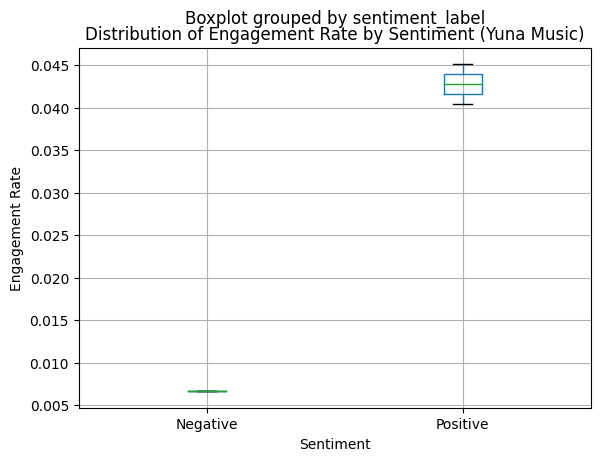

,count,mean,std,min,25%,50%,75%,max
sentiment_label,,,,,,,,
Negative,1.0,0.006630,NaN,0.006630,0.006630,0.006630,0.00663,0.006630
Positive,2.0,0.042817,0.003292,0.040489,0.041653,0.042817,0.04398,0.045144


In [ ]:
import matplotlib.pyplot as plt

# Filter the result_pol DataFrame
filtered_df =result_celeb[(result_celeb['status'] == 'Main post') & (result_celeb['sentiment_label'].isin(['Negative', 'Positive'])& (result_celeb['Username'] == 'altimet'))]

# Merge the filtered DataFrame with the followers DataFrame to get the number of followers for each user
merged_df = filtered_df.merge(df, on='Username')

# Calculate the engagement rate
merged_df['engagement_rate'] = (merged_df['Number of Likes'] + merged_df['Number of Retweet'] + merged_df['Number of Replies']) / df['followers_count']

# Create a boxplot to compare the distribution of engagement rate between negative and positive posts
merged_df.boxplot('engagement_rate', by='sentiment_label', showfliers=False)
plt.xlabel('Sentiment')
plt.ylabel('Engagement Rate')
plt.title('Distribution of Engagement Rate by Sentiment (Yuna Music)')
plt.show()

# Calculate and annotate the summary statistics
summary_stats = merged_df.groupby('sentiment_label')['engagement_rate'].describe()
summary_stats